- Kaggle Name: JacobWhite
- Number of Kaggle Submissions: 43
- Best Score on Public: 0.9135
- Best Score on Private: 0.9313

# Business Understanding

## Objectives

The primary business objective is to build a model that can correctly estimate the sex of new footprints taken from a crime scene using 18 geometric landmarks of footprints. Currently there is no automated process of sexing footprints in forensic investigations. As noted by Vernon et al. (2020), forensic examinations of footprints typically involve expert examiners who rely on manual evaluation and subjective judgment. This reliance on human expertise can introduce variability, delays, and the potential for error. An automated model would fill this critical gap by providing an objective, consistent, interpretable and efficient tool for sex estimation at a lower cost than involving an expert.


The model should be able to process and make predictions in a timely manner, but speed is not a critical factor as predictions do not need to be produced instantaneously, therefore accuracy and reliability are more important factors to consider as false predictions will mislead the investigators, wasting time and resources. Interpretability is also an important thing to consider, as the model must be unbiased as well as its use in a legal context.
The task is a binary classification problem.
The dataset is rather limited at 2000 instances so there is the risk of overfitting so this must be considered when selecting and tuning models.


The goal is to build a classification model that predicts footprint sex with at least 90% accuracy, using Area Under the Receiver Operating Characteristic Curve (AUC) as the primary evaluation metric.

## Plan

The approach taken in data processing and modelling was to save all dataframes in a reverse tree structure, applying different data processing methods. Starting from the original training data, at the root, a series of processed datasets were generated, each taking a different data preprocessing technique or transformation. This allowed each processed dataset to branch from the original test set providing multiple variations for model training. Corresponding holdout sets were also generated from the test data for each training dataset, ensuring the same preprocessing techniques and scaling methods were applied.

After each iteration of processing, training and testing was complete, insights were gained from the performance of the models and datasets using cross-validation on the training set and the submitted Kaggle scores. Using these insights new branches were added to the tree structure with new processing methods and models.

# Notebook Preparation

## Notes on running notebook

All code for grid searches have been commented out, as they take a long time to compute, but the cell outputs have been kept.

## Imports

In [3]:
import pandas as pd
import numpy as np

# Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
from graphviz import Source

# Utilities
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from shapely.geometry import Polygon
import inspect
from imblearn.over_sampling import SMOTE
from sklearn.decomposition import PCA

# Training/testing
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split

# Models
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier, BaggingClassifier
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB, GaussianNB, ComplementNB
import lightgbm as lgb

pd.set_option('display.max_columns', None)

## Loading Data

In [4]:
df_test_orig = pd.read_csv('Data/Source_Data/SexLandmarks-test.csv')
df_train_orig = pd.read_csv('Data/Source_Data/SexLandmarks-train.csv')

# Data Understanding

## Training Dataset

### Descriptive Statistics

In [5]:
df_train_orig.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
0,0,0.556673,0.064617,0.459606,0.083429,0.395285,0.117782,0.361370,0.157043,0.328624,0.202848,0.328624,0.279733,0.325116,0.317358,0.436216,0.516934,0.473640,0.674795,0.597605,0.705059,0.638537,0.622448,0.583571,0.537382,0.502877,0.445774,0.495860,0.337807,0.591757,0.297728,0.626842,0.242926,0.591757,0.181581,0.463115,0.180763
1,0,0.601897,0.171537,0.519308,0.152283,0.431714,0.167161,0.391671,0.213546,0.342868,0.280936,0.332858,0.341324,0.310334,0.391210,0.387917,0.584626,0.442976,0.758789,0.574367,0.780669,0.611908,0.682648,0.541832,0.618759,0.469254,0.513736,0.485522,0.398211,0.603148,0.390334,0.654453,0.339573,0.630678,0.286187,0.473008,0.258181
2,1,0.327504,0.195426,0.437202,0.191268,0.523052,0.216216,0.575517,0.258836,0.610493,0.317048,0.616852,0.403326,0.623211,0.458420,0.543720,0.677755,0.521463,0.853430,0.375199,0.902287,0.310016,0.783784,0.351351,0.688150,0.430843,0.596674,0.440382,0.474012,0.325914,0.451143,0.238474,0.395010,0.235294,0.322245,0.470588,0.304574
3,1,0.594496,0.111449,0.498477,0.120736,0.458640,0.153599,0.416760,0.191463,0.386116,0.235043,0.406545,0.290052,0.400416,0.325059,0.503585,0.499376,0.554658,0.637258,0.648634,0.657976,0.677235,0.587964,0.648634,0.513664,0.558744,0.425791,0.550572,0.328631,0.633312,0.310056,0.669063,0.262190,0.645569,0.207895,0.515842,0.202894
4,1,0.616850,0.231525,0.544279,0.222445,0.489851,0.260579,0.450974,0.288725,0.410801,0.344109,0.403026,0.404034,0.387475,0.445799,0.476892,0.611952,0.484668,0.778105,0.581861,0.818054,0.622034,0.733616,0.583156,0.680955,0.488555,0.574726,0.492443,0.470313,0.577973,0.429456,0.663502,0.400402,0.657023,0.345925,0.522249,0.322319


In [6]:
df_train_orig.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 37 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   sex     2000 non-null   int64  
 1   x0      2000 non-null   float64
 2   y0      2000 non-null   float64
 3   x1      1994 non-null   float64
 4   y1      1994 non-null   float64
 5   x2      1993 non-null   float64
 6   y2      1993 non-null   float64
 7   x3      1992 non-null   float64
 8   y3      1992 non-null   float64
 9   x4      1992 non-null   float64
 10  y4      1992 non-null   float64
 11  x5      1992 non-null   float64
 12  y5      1992 non-null   float64
 13  x6      1992 non-null   float64
 14  y6      1992 non-null   float64
 15  x7      1992 non-null   float64
 16  y7      1992 non-null   float64
 17  x8      1992 non-null   float64
 18  y8      1992 non-null   float64
 19  x9      1991 non-null   float64
 20  y9      1991 non-null   float64
 21  x10     1991 non-null   float64
 22  

In [7]:
df_train_orig.describe()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
count,2000.00000,2000.000000,2000.000000,1994.000000,1994.000000,1993.000000,1993.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1992.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1991.000000,1983.000000,1983.000000
mean,0.55850,0.487538,0.142495,0.488544,0.148220,0.488321,0.177648,0.487826,0.218273,0.486957,0.272767,0.485293,0.339229,0.483736,0.391514,0.477024,0.581950,0.475605,0.743143,0.476982,0.775661,0.475448,0.682442,0.475880,0.608140,0.478347,0.514928,0.483149,0.407749,0.483490,0.374265,0.481527,0.316086,0.482622,0.257975,0.485124,0.245457
std,0.49669,0.093121,0.059570,0.051502,0.059680,0.094597,0.059735,0.137298,0.059840,0.171293,0.061972,0.175482,0.064906,0.184741,0.068487,0.089184,0.085838,0.059292,0.099844,0.112509,0.102197,0.150311,0.093776,0.101895,0.086237,0.048361,0.076974,0.048621,0.069833,0.119457,0.066957,0.164397,0.064219,0.140620,0.060773,0.051954,0.059889
min,0.00000,0.175532,0.001002,0.220859,0.001002,0.185583,0.021830,0.159509,0.060291,0.108896,0.115385,0.108434,0.172557,0.091867,0.232848,0.151840,0.383768,0.157975,0.526286,0.160572,0.546888,0.111963,0.461924,0.161043,0.398798,0.268405,0.318637,0.272347,0.218295,0.127660,0.180361,0.029255,0.129259,0.042553,0.091182,0.279141,0.083166
25%,0.00000,0.410135,0.099982,0.456053,0.106029,0.406938,0.135271,0.363337,0.176715,0.327892,0.228754,0.321468,0.293543,0.311576,0.341693,0.403738,0.522760,0.436203,0.673583,0.383651,0.702451,0.341932,0.617649,0.387917,0.548044,0.449610,0.462477,0.456981,0.359672,0.377107,0.328315,0.331990,0.271877,0.356151,0.215530,0.451500,0.202468
50%,1.00000,0.486504,0.140632,0.488557,0.146900,0.490798,0.175112,0.521695,0.215431,0.554990,0.268298,0.557388,0.332631,0.558647,0.382448,0.477107,0.565161,0.474609,0.716671,0.474261,0.748052,0.434794,0.660890,0.472178,0.588883,0.478722,0.502227,0.483680,0.398815,0.461438,0.366944,0.420670,0.309592,0.449387,0.253770,0.484450,0.240473
75%,1.00000,0.567022,0.180361,0.520950,0.188130,0.568368,0.216843,0.611989,0.256513,0.645764,0.311850,0.649112,0.378398,0.654856,0.431608,0.551698,0.627078,0.515023,0.798747,0.574128,0.831167,0.614617,0.733651,0.564400,0.655165,0.507516,0.556430,0.510376,0.448935,0.591357,0.415155,0.635003,0.356986,0.611963,0.295962,0.520419,0.282791
max,1.00000,0.764706,0.408115,0.731928,0.371102,0.783133,0.412682,0.853916,0.455301,0.920213,0.523909,0.944149,0.579002,0.989362,0.634096,0.739362,0.843504,0.700301,0.992723,0.866564,0.999016,0.886503,0.934870,0.808282,0.848233,0.697443,0.760915,0.736196,0.643451,0.793323,0.600200,0.861685,0.538462,0.837838,0.476091,0.722892,0.458420


In [8]:
missing_values_per_column = df_train_orig.isnull().sum()
print(f"Missing Values per column:\n{missing_values_per_column}\n")

total_missing_values = df_train_orig.isnull().sum().sum()
print(f"Total number of missing values:\n{total_missing_values}\n")

rows_with_missing = df_train_orig.isnull().any(axis=1).sum()
print(f"Number of rows with missing values:\n{rows_with_missing}\n")

missing_percentage = (df_train_orig.isnull().sum() / len(df_train_orig)) * 100
print(f"Missing Percentage per column:\n{missing_percentage}\n")

percentage_rows_with_missing = (rows_with_missing / len(df_train_orig)) * 100
print(f"Percentage of rows with missing values:\n{percentage_rows_with_missing:.2f}%")

Missing Values per column:
sex     0
x0      0
y0      0
x1      6
y1      6
x2      7
y2      7
x3      8
y3      8
x4      8
y4      8
x5      8
y5      8
x6      8
y6      8
x7      8
y7      8
x8      8
y8      8
x9      9
y9      9
x10     9
y10     9
x11     9
y11     9
x12     9
y12     9
x13     9
y13     9
x14     9
y14     9
x15     9
y15     9
x16     9
y16     9
x17    17
y17    17
dtype: int64

Total number of missing values:
300

Number of rows with missing values:
17

Missing Percentage per column:
sex    0.00
x0     0.00
y0     0.00
x1     0.30
y1     0.30
x2     0.35
y2     0.35
x3     0.40
y3     0.40
x4     0.40
y4     0.40
x5     0.40
y5     0.40
x6     0.40
y6     0.40
x7     0.40
y7     0.40
x8     0.40
y8     0.40
x9     0.45
y9     0.45
x10    0.45
y10    0.45
x11    0.45
y11    0.45
x12    0.45
y12    0.45
x13    0.45
y13    0.45
x14    0.45
y14    0.45
x15    0.45
y15    0.45
x16    0.45
y16    0.45
x17    0.85
y17    0.85
dtype: float64

Percentage of rows wi

The dataset has 2000 rows in total, 17 of which (0.85% of rows) contain missing elements, with 300 total missing values, the features with the most missing values are x17 and y17.

In [9]:
rows_with_missing = df_train_orig[df_train_orig.isnull().any(axis=1)]
print(rows_with_missing)

      sex        x0        y0        x1        y1        x2        y2  \
59      1  0.337423  0.151303       NaN       NaN       NaN       NaN   
95      0  0.554346  0.143531       NaN       NaN       NaN       NaN   
259     1  0.454690  0.121622  0.588235  0.150728  0.653418  0.178794   
375     0  0.664110  0.205411  0.516871  0.227455  0.427914  0.261523   
448     0  0.631400  0.127002       NaN       NaN       NaN       NaN   
646     0  0.341246  0.032225  0.439169  0.062370  0.504451  0.087318   
1162    1  0.599507  0.180740  0.505039  0.207893  0.448116  0.235046   
1167    0  0.604344  0.408115       NaN       NaN       NaN       NaN   
1204    0  0.572789  0.134375  0.493739  0.138007  0.449678  0.158890   
1320    0  0.565608  0.150533  0.456741  0.146157  0.411692  0.174163   
1508    0  0.530697  0.121215       NaN       NaN       NaN       NaN   
1680    0  0.603858  0.098753  0.502967  0.119543  0.418398  0.203742   
1702    1  0.605507  0.184991  0.494024  0.175818  

### Target Class Distribution

sex
1    1117
0     883
Name: count, dtype: int64


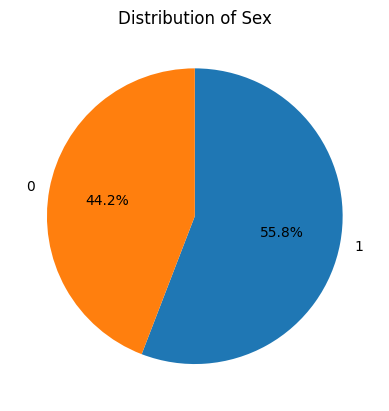

In [10]:
print(df_train_orig["sex"].value_counts())
df_train_orig['sex'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, counterclock=False)

plt.title('Distribution of Sex')
plt.ylabel('')
plt.show()

From the pie chart above, slight class imbalanced can be observed with 44.2% and 55.8 for sex 0 and 1 respectively.

### Histogram Plot

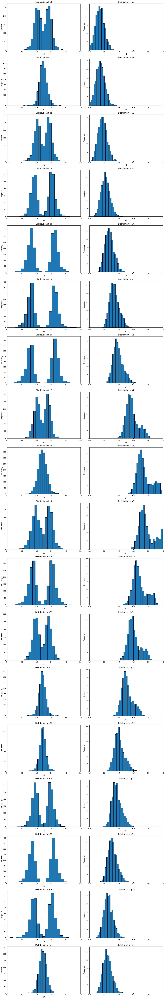

In [11]:
columns_to_plot = df_train_orig.columns[1:]
num_columns = len(columns_to_plot)
fig_rows = (num_columns + 1) // 2
fig, axes = plt.subplots(fig_rows, 2, figsize=(15, 5 * fig_rows))
axes = axes.ravel()

for i, column in enumerate(columns_to_plot):
    axes[i].hist(df_train_orig[column], bins=20, edgecolor='black')
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    axes[i].set_xlim(0, 1)

plt.tight_layout()
plt.show()

The X landmarks x0, x2, x3, x4, x5, x6, x7, x9, x10, x11, x14, x15 and x16​ exhibit a bimodal distribution.

The Y landmarks y7​, y8​, y9​, y10​, and y11​ show a right-skewed bimodal distribution.

The remaining data points follow a normal distribution or a slightly right-skewed normal distribution.

### Scatter Plot

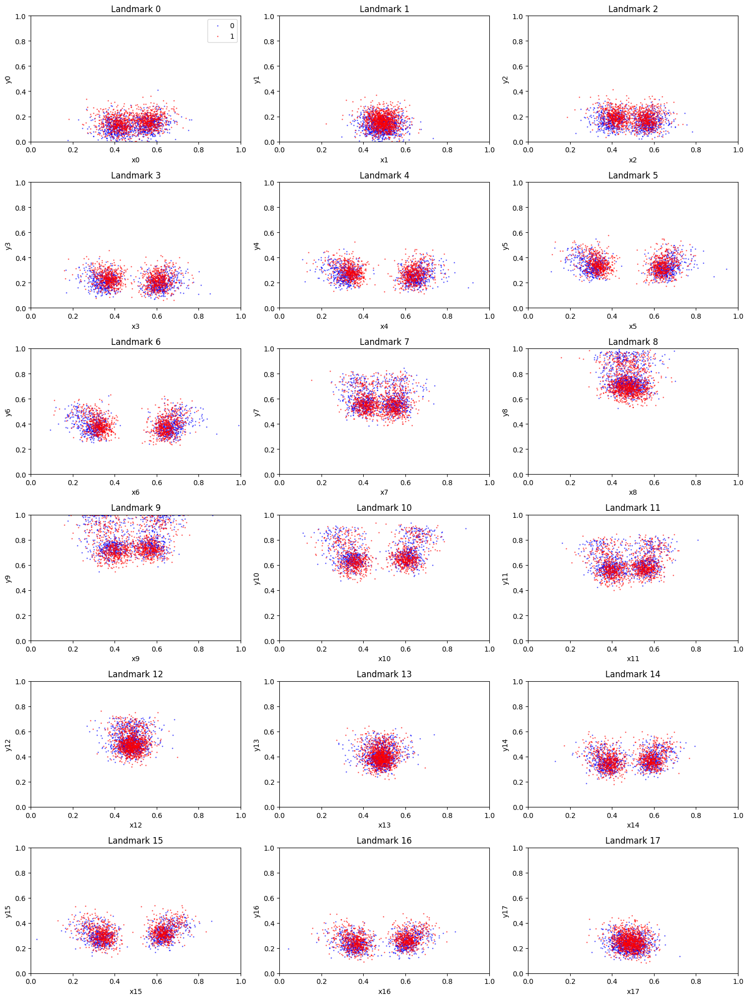

In [12]:
num_landmarks = 18

fig, axes = plt.subplots(6, 3, figsize=(15, 20))
axes = axes.flatten()

for i in range(num_landmarks):
    x_column = f'x{i}'
    y_column = f'y{i}'

    # Sex 0
    axes[i].scatter(df_train_orig[df_train_orig['sex'] == 0][x_column],
                    df_train_orig[df_train_orig['sex'] == 0][y_column],
                    color='blue', label=0, alpha=0.5, s=1)
    # Sex 1
    axes[i].scatter(df_train_orig[df_train_orig['sex'] == 1][x_column],
                    df_train_orig[df_train_orig['sex'] == 1][y_column],
                    color='red', label=1, alpha=0.5, s=1)

    axes[i].set_title(f'Landmark {i}')
    axes[i].set_xlabel(f'{x_column}')
    axes[i].set_ylabel(f'{y_column}')
    axes[i].set_xlim(0, 1)
    axes[i].set_ylim(0, 1)

    if i == 0:
        axes[i].legend()

plt.tight_layout()
plt.show()

The bimodal distribution for X landmarks mentioned before can be seen again here, there are two distinct clusters for landmarks 0, 2, 3, 4, 5, 6, 7, 9, 10, 11, 14, 15 and 17.

Also seen again is the slight skewing on the Y axis for landmarks 7​, 8​, 9​, 10​, and 11.

### Plot foot

In [13]:
def plot_footprint(df, row_index, norm=True):

    if norm==False:
        w, h = 2240, 3200
        figsize=(7, 10)
    else:
        w, h = 1, 1
        figsize=(6, 6)

    selected_row = df.iloc[row_index]

    x_coordinates = [selected_row[f'x{i}'] * w for i in range(18)]
    y_coordinates = [selected_row[f'y{i}'] * h for i in range(18)]

    plt.figure(figsize=figsize)
    plt.scatter(x_coordinates, y_coordinates, color='blue', s=10)

    for i in range(18):
        plt.text(x_coordinates[i], y_coordinates[i], str(i), fontsize=9, color='red', ha='right', va='bottom')

    plt.xlim(0, w)
    plt.ylim(0, h)
    plt.gca().set_aspect(w / h)
    plt.title(f'Footprint for Row {row_index}')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.grid()
    plt.show()

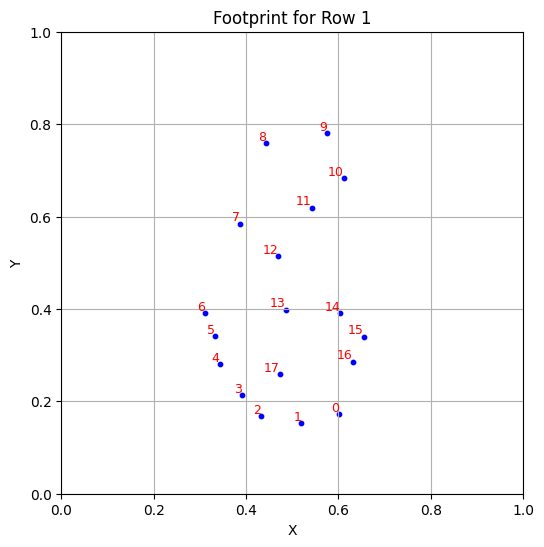

In [14]:
plot_footprint(df_train_orig, 1, norm=True)

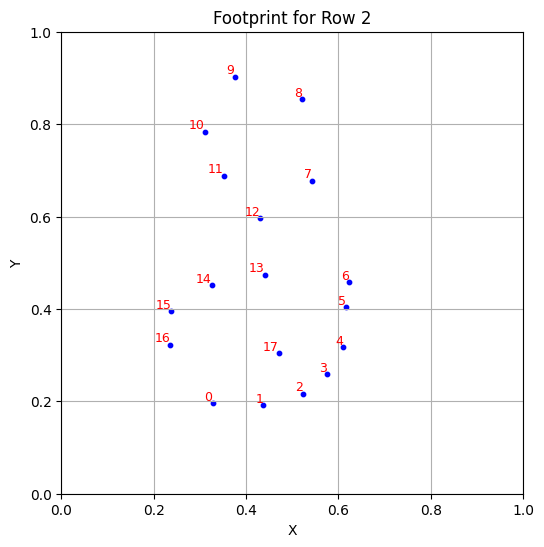

In [15]:
plot_footprint(df_train_orig, 2, norm=True)

From the scatter plot and from visualizing the plots of many footprints it can be seen that the feet are all oriented the same way, with the heel at the top of the image and the toes at the bottom. Also, from these two plots above it can be observed that the dataset includes both left and right feet, this is likely the cause of the bimodal distribution of the X coordinates.

### Outliers

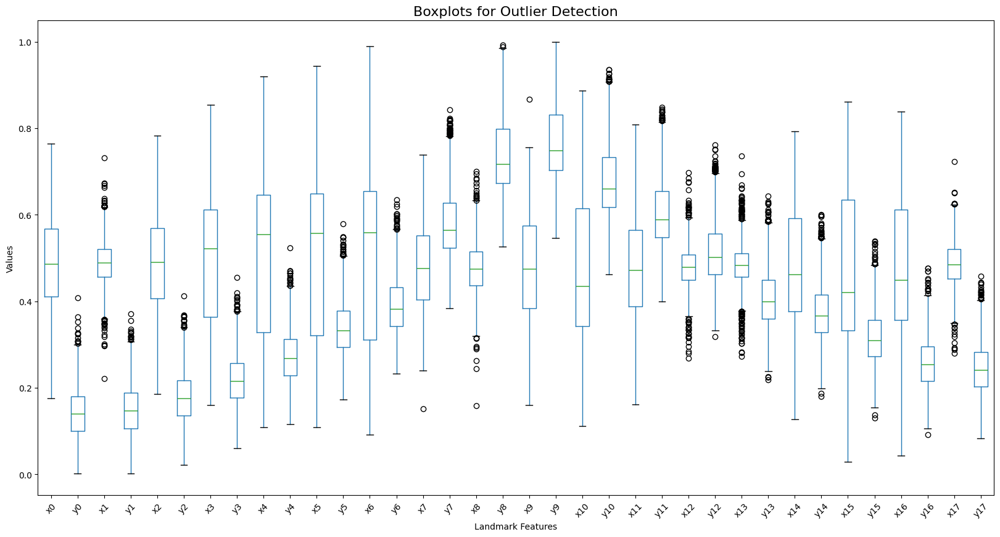

In [16]:
columns_pairs = [(f'x{i}', f'y{i}') for i in range(18)]
columns_to_plot = [col for pair in columns_pairs for col in pair]
data_to_plot = df_train_orig[columns_to_plot]


plt.figure(figsize=(20, 10))
data_to_plot.boxplot(rot=45, grid=False)

plt.title('Boxplots for Outlier Detection', fontsize=16)
plt.ylabel('Values')
plt.xlabel('Landmark Features')
plt.show()


The boxplots highlight wide variability across the features, many showing a considerable number of outliers such as x12, y12 and x13. This is likely due to the variability and clustering in the data that was previously observed in the histogram and cluster plots. Features such as x9 and x7 exhibit extreme outliers, which may result from data collection errors or anomalies.

The interquartile range (IQR) varies significantly between the landmarks. Features like x6, x10, and x15 have a large IQR, indicating more variable or dispersed data, while other features with a smaller IQR, such as y0, x1 and y1, suggest less variance in the data or tighter clustered values.

### Pairplot

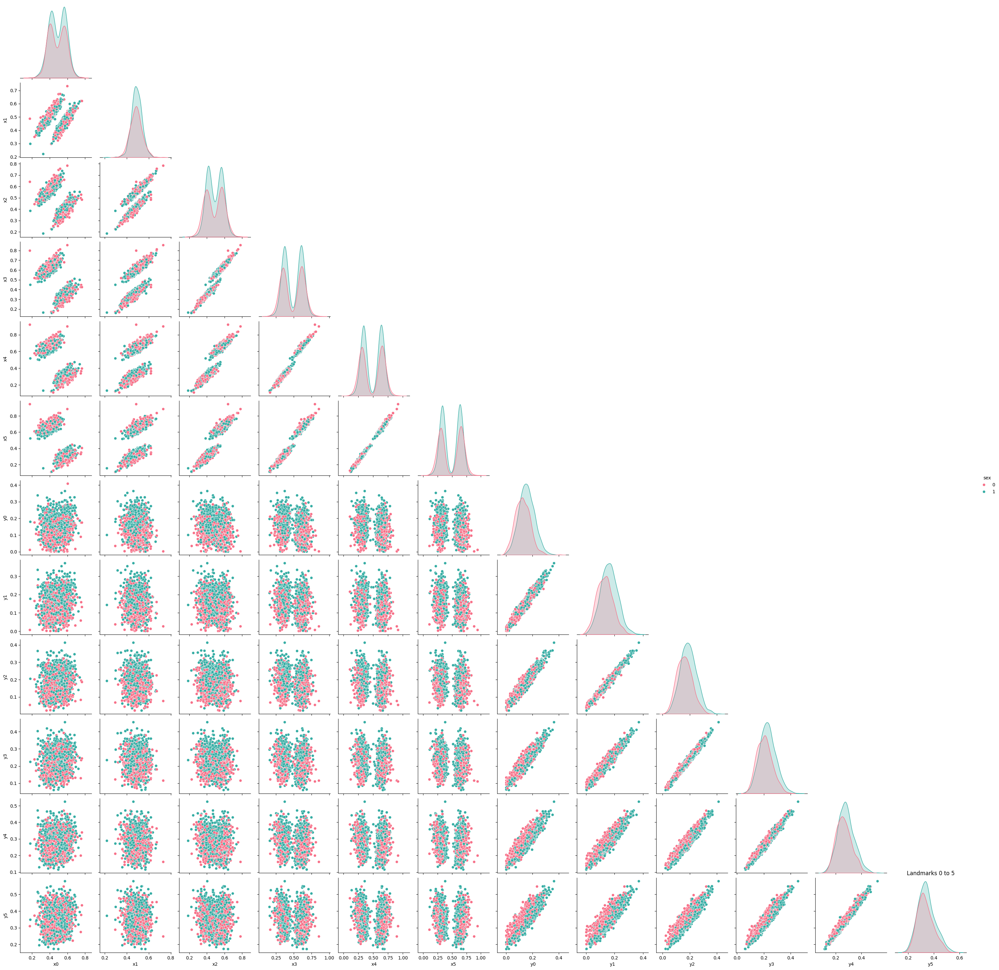

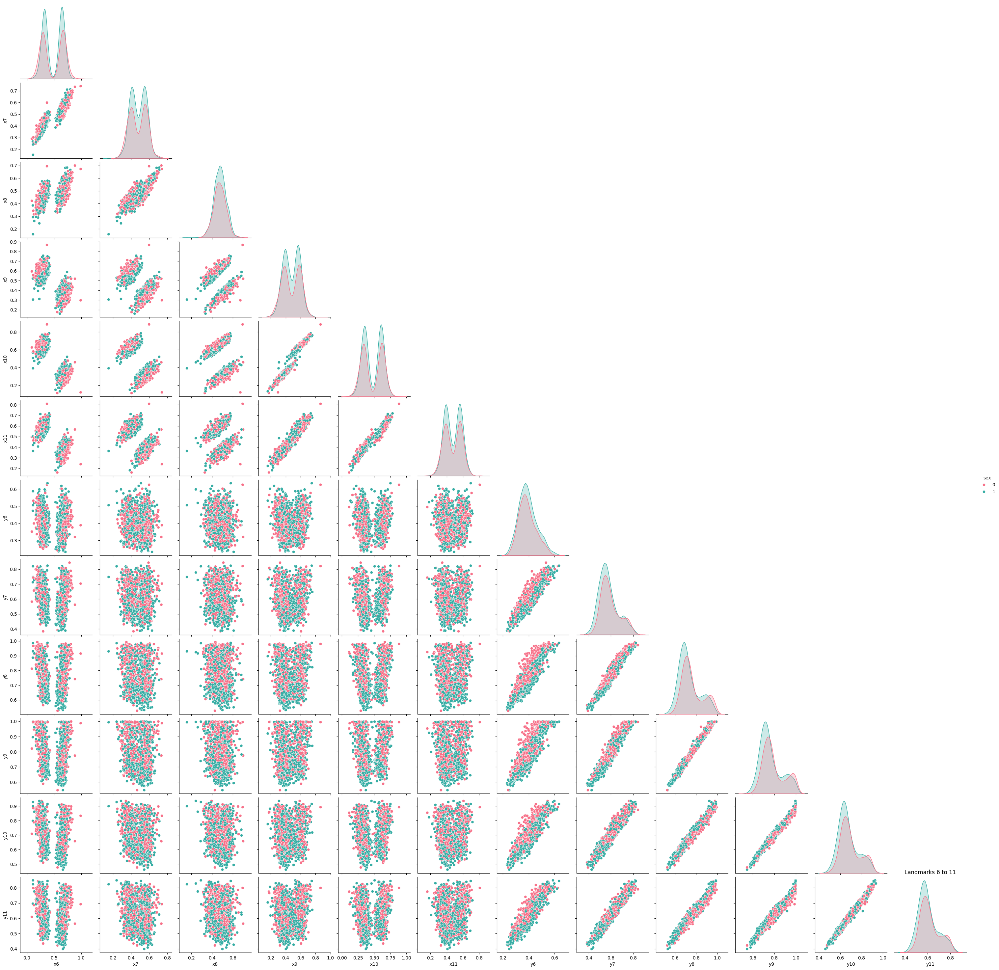

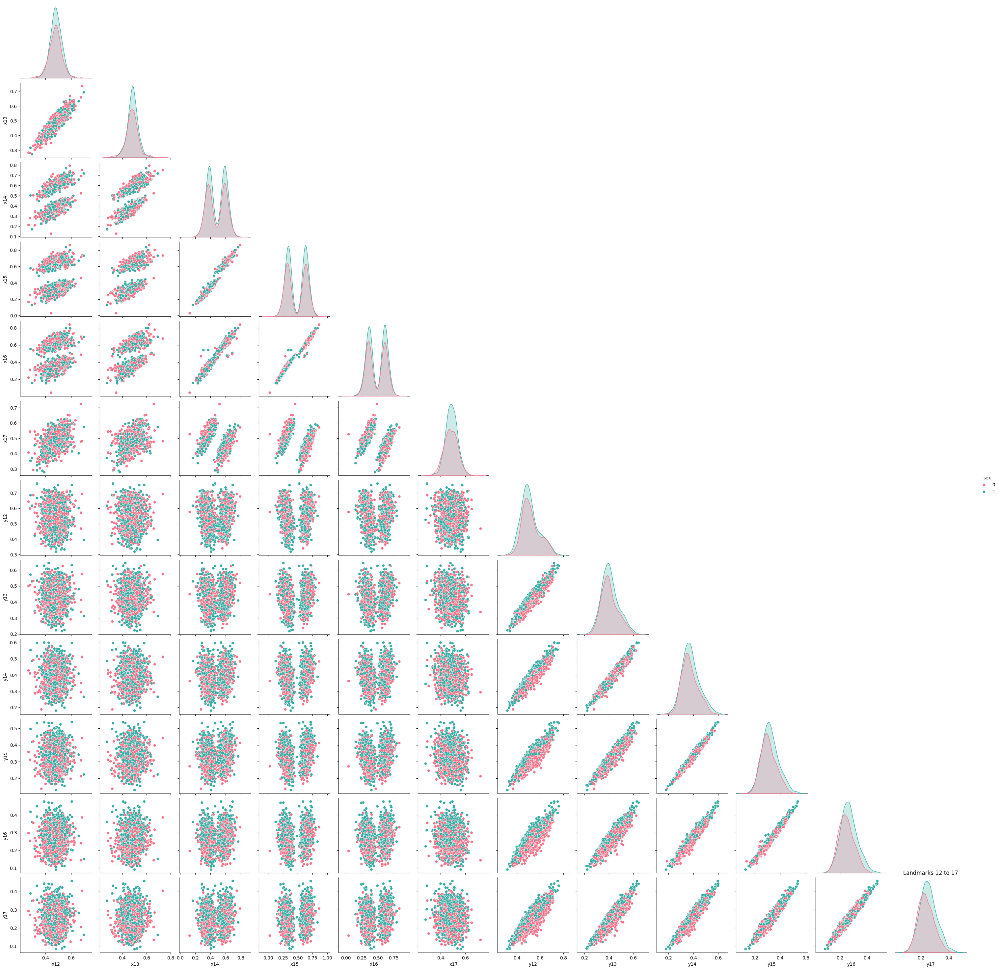

In [17]:
def plot_landmark_cluster(df, cluster_start, cluster_end):
    columns = [f'x{i}' for i in range(cluster_start, cluster_end + 1)] + \
              [f'y{i}' for i in range(cluster_start, cluster_end + 1)]
    pairplot_data = df[columns + ['sex']]
    
    sns.pairplot(pairplot_data, hue='sex', corner=True, diag_kind='kde', palette='husl')
    plt.title(f"Landmarks {cluster_start} to {cluster_end}")
    plt.show()

# Plot clusters of landmarks (0-5, 6-11, 12-17)
cluster_ranges = [(0, 5), (6, 11), (12, 17)]
for start, end in cluster_ranges:
    plot_landmark_cluster(df_train_orig, start, end)


Pairplots were produced to visualize pairwise relationships between features to identify patterns, correlations and clusters.
Some pairs of features show a linear separation between sexes such as y12/y17 and y6/y8, whereas, others show a noisy mixture of data such as x12/x17 and x7/x11. There are also more complex patterns such as in x6/x9 and x7/x10 which exhibit nonlinear relationships, suggesting the potential need for feature engineering or nonlinear models to capture these patterns.

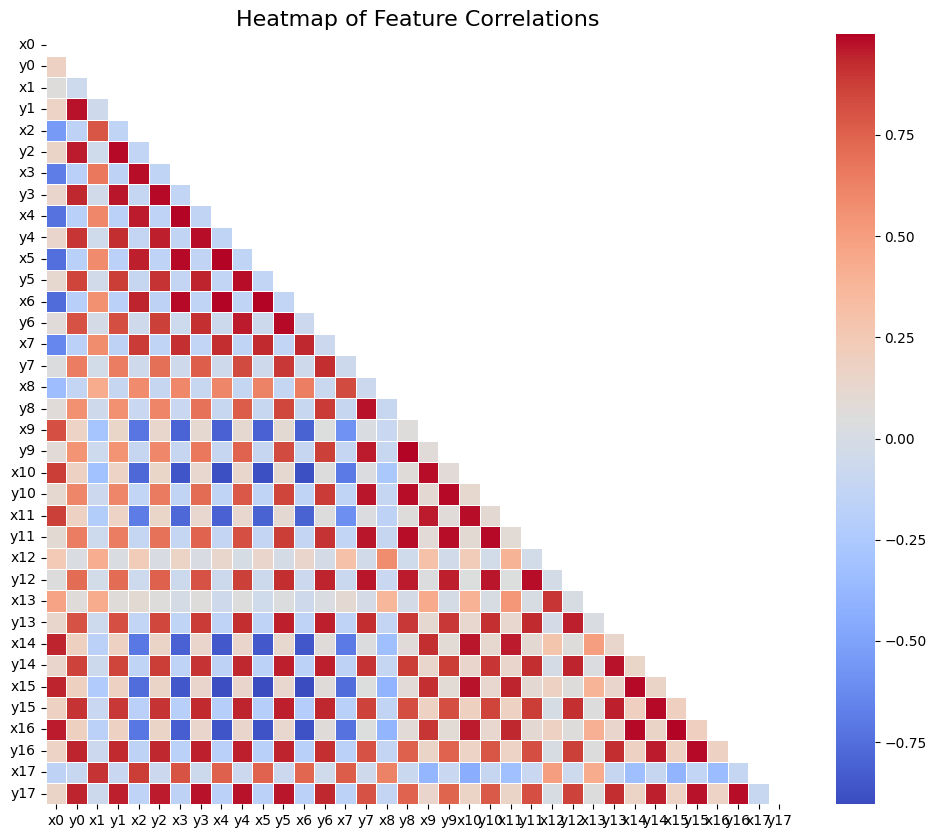

In [18]:
corr_matrix = df_train_orig.drop(columns=['sex'], errors='ignore').corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, mask=mask, annot=False, cmap='coolwarm', linewidths=0.5)
plt.xticks(rotation=0)
plt.title('Heatmap of Feature Correlations', fontsize=16)
plt.show()

Large variance in the correlation between landmarks is observed, ranging from very strong positive to very strong negative correlations as well as some features displaying no correlation at all.
This suggests that while some landmarks are closely related and may capture similar information, others are mostly independent or inversely related.
This variability highlights the need for careful feature selection or dimensionality reduction to minimize redundancy and focus on the most useful features for the models.

## Testing Dataset

### Descriptive Statistics

In [19]:
df_test_orig.head()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
0,0.540300,0.145592,0.435047,0.154589,0.388268,0.183217,0.361370,0.235565,0.327455,0.301818,0.321607,0.368070,0.309913,0.407331,0.421013,0.623266,0.459606,0.797485,0.568368,0.840836,0.630350,0.759860,0.605791,0.672342,0.487674,0.534929,0.525097,0.453135,0.595266,0.401605,0.629181,0.345986,0.599944,0.283005,0.431539,0.265828
1,0.518625,0.086172,0.438395,0.059118,0.375358,0.106212,0.333811,0.164329,0.308023,0.210421,0.283668,0.284569,0.262178,0.336673,0.361032,0.575150,0.429799,0.733467,0.561605,0.777555,0.608883,0.682365,0.600287,0.599198,0.594556,0.482966,0.595989,0.384770,0.601719,0.312625,0.618911,0.245491,0.581662,0.191383,0.408309,0.193387
2,0.596507,0.098336,0.488977,0.112610,0.427855,0.133229,0.390503,0.160192,0.364469,0.221255,0.357678,0.275975,0.341831,0.315626,0.423328,0.482162,0.469735,0.638389,0.593111,0.670904,0.610090,0.572568,0.542176,0.514677,0.451625,0.446476,0.494637,0.352105,0.607826,0.318005,0.651970,0.267251,0.632728,0.204602,0.475395,0.199844
3,0.356083,0.086279,0.449555,0.085239,0.502967,0.108108,0.543027,0.139293,0.584570,0.198545,0.577151,0.245322,0.586053,0.291060,0.491098,0.455301,0.442136,0.613306,0.336795,0.646570,0.302671,0.562370,0.335312,0.497921,0.446588,0.428274,0.431751,0.302495,0.344214,0.285863,0.296736,0.228690,0.316024,0.186071,0.462908,0.181913
4,0.619146,0.072213,0.530697,0.079951,0.464360,0.123794,0.432420,0.171077,0.415221,0.218360,0.409079,0.287134,0.407850,0.333557,0.530697,0.502915,0.600719,0.658518,0.722338,0.678291,0.756735,0.608656,0.700225,0.523547,0.590892,0.429842,0.579836,0.336136,0.675656,0.302609,0.713738,0.245010,0.673199,0.182253,0.542982,0.190850


In [20]:
df_test_orig.describe()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
count,598.000000,598.000000,597.000000,597.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000,596.000000
mean,0.491009,0.143420,0.489788,0.148444,0.488023,0.178109,0.486524,0.219255,0.483931,0.273324,0.482759,0.339507,0.480933,0.391180,0.475599,0.580253,0.474975,0.741262,0.479651,0.773865,0.479382,0.680424,0.479355,0.606155,0.480235,0.513472,0.485511,0.407380,0.487831,0.374685,0.486342,0.316678,0.487253,0.258946,0.485480,0.245523
std,0.090997,0.057240,0.051621,0.057024,0.097195,0.056922,0.140132,0.057097,0.173701,0.058980,0.177200,0.061549,0.185687,0.065300,0.089910,0.081700,0.058408,0.094030,0.112510,0.095838,0.149354,0.087463,0.099219,0.080824,0.045100,0.073258,0.044951,0.066370,0.116107,0.062958,0.161209,0.060501,0.138406,0.058056,0.053091,0.056533
min,0.235294,0.001002,0.341812,0.001002,0.282209,0.030060,0.220986,0.061122,0.176471,0.117464,0.165644,0.185039,0.161043,0.235471,0.269939,0.388773,0.309816,0.537422,0.153374,0.563410,0.133436,0.463617,0.206533,0.412682,0.337423,0.339917,0.302067,0.242204,0.246423,0.206861,0.182515,0.149688,0.193959,0.100832,0.325914,0.098753
25%,0.417668,0.101691,0.454928,0.110220,0.404674,0.136989,0.357815,0.179080,0.325558,0.234571,0.317886,0.297340,0.306737,0.344159,0.399602,0.522699,0.432024,0.674511,0.391289,0.706387,0.342741,0.618691,0.395383,0.550022,0.450291,0.462770,0.459051,0.361496,0.383559,0.329167,0.335641,0.276187,0.363457,0.220754,0.449582,0.207916
50%,0.497099,0.142977,0.489284,0.149063,0.479007,0.179657,0.435606,0.219168,0.401477,0.268522,0.402847,0.335694,0.400904,0.381473,0.467096,0.563951,0.474610,0.717108,0.493793,0.747607,0.532798,0.662468,0.495287,0.591455,0.479163,0.500637,0.485047,0.399031,0.524470,0.370047,0.562642,0.312949,0.539623,0.255322,0.483681,0.244330
75%,0.565118,0.183990,0.526009,0.189041,0.571056,0.215690,0.615879,0.257697,0.647480,0.311881,0.651438,0.377133,0.659509,0.430470,0.553259,0.623718,0.513090,0.787516,0.569980,0.819743,0.612827,0.726476,0.565986,0.650290,0.508764,0.556087,0.512380,0.446104,0.592525,0.412646,0.633979,0.355832,0.611989,0.298321,0.520262,0.283652
max,0.710652,0.325364,0.659639,0.322245,0.731928,0.361746,0.785276,0.403326,0.832822,0.470894,0.812401,0.546778,0.817485,0.613306,0.714724,0.833680,0.667169,0.993763,0.758271,0.998998,0.811307,0.910822,0.713835,0.829522,0.630368,0.740125,0.655066,0.627859,0.759704,0.592516,0.802706,0.511435,0.772605,0.451143,0.659509,0.434511


In [21]:
missing_values_per_column = df_test_orig.isnull().sum()
print(f"Missing Values per column:\n{missing_values_per_column}\n")

total_missing_values = df_test_orig.isnull().sum().sum()
print(f"Total number of missing values:\n{total_missing_values}\n")

rows_with_missing = df_test_orig.isnull().any(axis=1).sum()
print(f"Number of rows with missing values:\n{rows_with_missing}\n")

missing_percentage = (df_test_orig.isnull().sum() / len(df_train_orig)) * 100
print(f"Missing Percentage per column:\n{missing_percentage}\n")

percentage_rows_with_missing = (rows_with_missing / len(df_test_orig)) * 100
print(f"Percentage of rows with missing values:\n{percentage_rows_with_missing:.2f}%")

Missing Values per column:
x0     0
y0     0
x1     1
y1     1
x2     2
y2     2
x3     2
y3     2
x4     2
y4     2
x5     2
y5     2
x6     2
y6     2
x7     2
y7     2
x8     2
y8     2
x9     2
y9     2
x10    2
y10    2
x11    2
y11    2
x12    2
y12    2
x13    2
y13    2
x14    2
y14    2
x15    2
y15    2
x16    2
y16    2
x17    2
y17    2
dtype: int64

Total number of missing values:
66

Number of rows with missing values:
2

Missing Percentage per column:
x0     0.00
y0     0.00
x1     0.05
y1     0.05
x2     0.10
y2     0.10
x3     0.10
y3     0.10
x4     0.10
y4     0.10
x5     0.10
y5     0.10
x6     0.10
y6     0.10
x7     0.10
y7     0.10
x8     0.10
y8     0.10
x9     0.10
y9     0.10
x10    0.10
y10    0.10
x11    0.10
y11    0.10
x12    0.10
y12    0.10
x13    0.10
y13    0.10
x14    0.10
y14    0.10
x15    0.10
y15    0.10
x16    0.10
y16    0.10
x17    0.10
y17    0.10
dtype: float64

Percentage of rows with missing values:
0.33%


The testing dataset also contains missing values but as we are unable to drop these rows they will need to be imputed.

### Histogram Plot

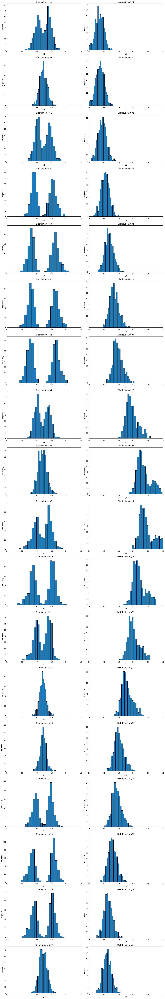

In [22]:
columns_to_plot = df_test_orig.columns[:]
num_columns = len(columns_to_plot)
fig_rows = (num_columns + 1) // 2
fig, axes = plt.subplots(fig_rows, 2, figsize=(15, 5 * fig_rows))
axes = axes.ravel()

for i, column in enumerate(columns_to_plot):
    axes[i].hist(df_test_orig[column], bins=20, edgecolor='black')
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')
    axes[i].set_xlim(0, 1)

plt.tight_layout()
plt.show()

The testing dataset exhibits the same bimodal distribution as in the training set.

### Scatter Plot

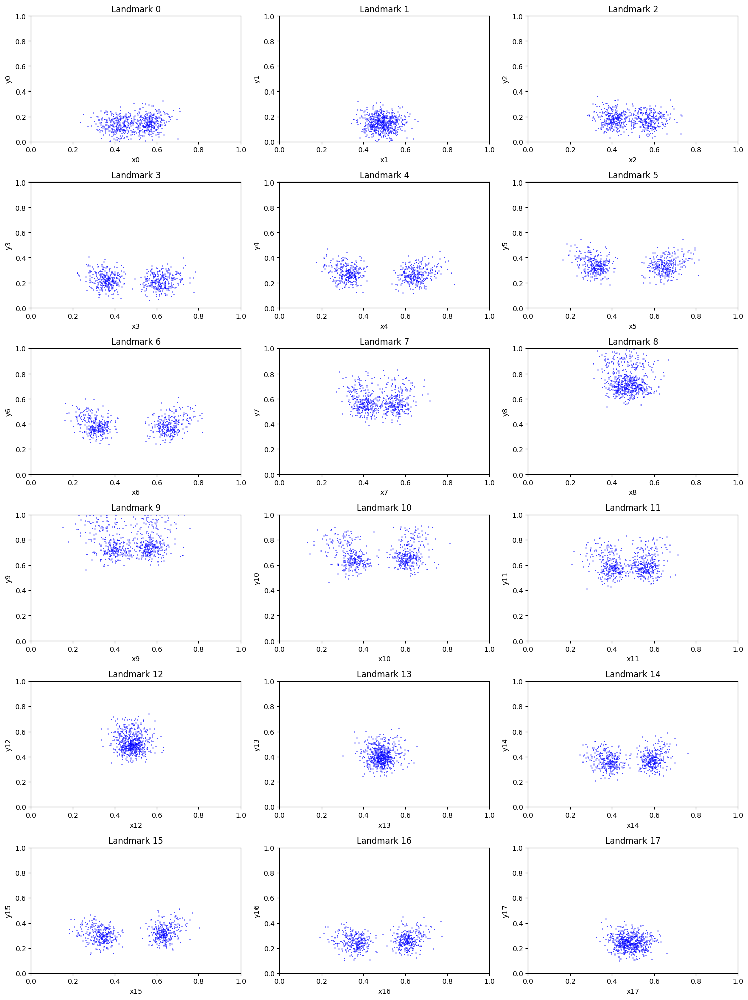

In [23]:
num_landmarks = 18

fig, axes = plt.subplots(6, 3, figsize=(15, 20))
axes = axes.flatten()

for i in range(num_landmarks):
    x_column = f'x{i}'
    y_column = f'y{i}'

    axes[i].scatter(df_test_orig[x_column],
                    df_test_orig[y_column],
                    color='blue', alpha=0.5, s=1)

    axes[i].set_title(f'Landmark {i}')
    axes[i].set_xlabel(f'{x_column}')
    axes[i].set_ylabel(f'{y_column}')
    axes[i].set_xlim(0, 1)
    axes[i].set_ylim(0, 1)

plt.tight_layout()
plt.show()

The histogram and scatter plots for the testing data show the same trends as in the training data.

### Plot Foot

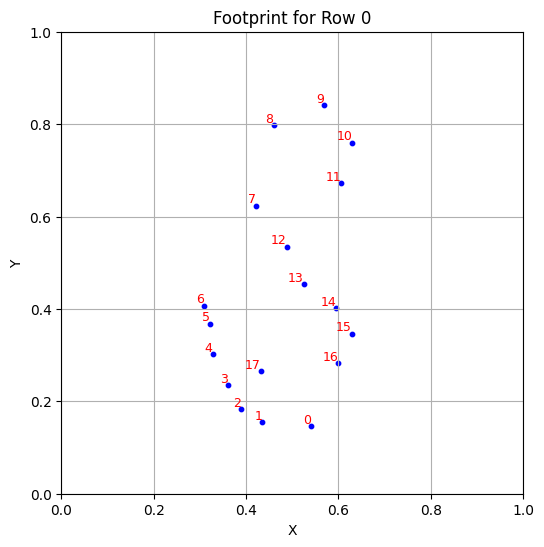

In [24]:
plot_footprint(df_test_orig, 0, norm=True)

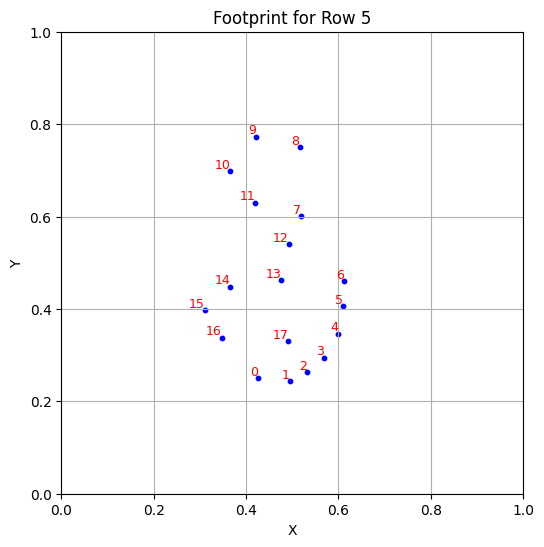

In [25]:
plot_footprint(df_test_orig, 5, norm=True)

The footprints in the testing set were oriented in the same direction as those in the training set and included both left and right prints.

### Outliers

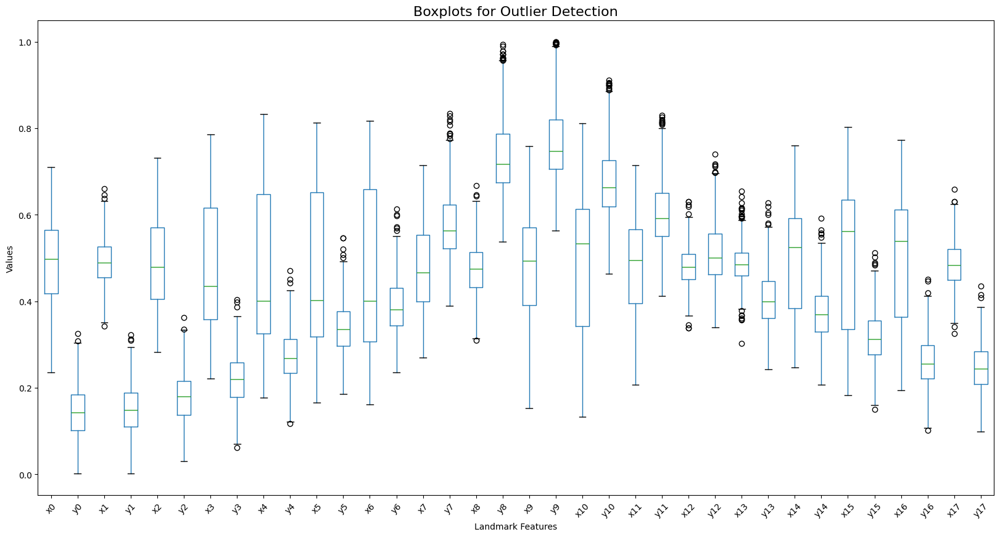

In [26]:
columns_pairs = [(f'x{i}', f'y{i}') for i in range(18)]
columns_to_plot = [col for pair in columns_pairs for col in pair]
data_to_plot = df_test_orig[columns_to_plot]

# Set up the figure and axis
plt.figure(figsize=(20, 10))

# Create boxplots
data_to_plot.boxplot(rot=45, grid=False)

# Add a title and labels for better readability
plt.title('Boxplots for Outlier Detection', fontsize=16)
plt.ylabel('Values')
plt.xlabel('Landmark Features')
plt.show()


Similar to the training dataset, the boxplots highlight wide variance across the features and IQR, but with less extreme/anomalous outliers compared to the training set.

# Data Preparation and Modelling

## Unormalize

The data is unnormalized to start with to give a clearer view of the scale and distribution as well as to get optimum performance from the feature engineering methods.

In [27]:
def unnormalize_landmarks(df):
    unorm_df = df.copy()
    w,h = 2240, 3200
    for i in range(18):
        unorm_df[f'x{i}'] = unorm_df[f'x{i}']*w
        unorm_df[f'y{i}'] = unorm_df[f'y{i}']*h
    return unorm_df

In [28]:
df_train_raw = unnormalize_landmarks(df_train_orig)
df_train_raw.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
0,0,1246.947634,206.773651,1029.517689,266.973574,885.437605,376.903869,809.468107,502.538493,736.118246,649.112220,736.118246,895.146690,728.259332,1015.546537,977.124931,1654.189205,1060.953344,2159.345085,1338.634960,2256.188440,1430.322286,1991.832254,1307.199305,1719.623904,1126.444291,1426.476450,1110.726464,1080.981237,1325.536770,952.729225,1404.125907,777.364231,1325.536770,581.060132,1037.376603,578.442744
1,0,1348.249031,548.918608,1163.250203,487.305294,967.039326,534.915582,877.342924,683.347654,768.025435,898.994250,745.601335,1092.236005,695.147109,1251.870498,868.933887,1870.804234,992.266438,2428.124657,1286.582755,2498.139786,1370.673131,2184.472010,1213.704429,1980.027835,1051.129702,1643.955218,1087.568865,1274.275339,1351.052043,1249.069893,1465.975557,1086.634795,1412.718319,915.797881,1059.538739,826.178517
2,1,733.608903,625.363825,979.332273,612.058212,1171.637520,691.891892,1289.157393,828.274428,1367.503975,1014.553015,1381.748808,1290.644491,1395.993641,1466.943867,1217.933227,2168.814969,1168.076312,2730.977131,840.445151,2887.318087,694.435612,2508.108108,787.027027,2202.079002,965.087440,1909.355509,986.454690,1516.839917,730.047695,1443.659044,534.181240,1264.033264,527.058824,1031.185031,1054.117647,974.636175
3,1,1331.670233,356.635973,1116.589474,386.355637,1027.353839,491.517527,933.542019,612.682312,864.899223,752.136122,910.661087,928.167980,896.932528,1040.188254,1128.029939,1598.003493,1242.434599,2039.226203,1452.939171,2105.523916,1517.005781,1881.483369,1452.939171,1643.726054,1251.586971,1362.532306,1233.282226,1051.618894,1418.617774,992.179565,1498.701035,839.008987,1446.074892,665.263257,1155.487058,649.260361
4,1,1381.743783,740.879420,1219.185691,711.825325,1097.267122,833.852524,1010.182429,923.920218,920.194914,1101.150197,902.777976,1292.907224,867.944099,1426.556060,1068.238891,1958.245997,1085.655829,2489.935934,1303.367560,2617.773952,1393.355075,2347.570869,1306.270383,2179.057118,1094.364299,1839.124208,1103.072768,1505.002116,1294.659091,1374.258689,1486.245413,1281.285586,1471.731298,1106.961016,1169.837698,1031.420369


## Handling Missing Values

### Dropping Missing Values

Rows with missing data account for only 0.85% of the dataset so their impact on the overall data integrity is small, therefore the decision was made to drop these rows as opposed to imputing. This maintains the integrity of the dataset and avoids biases that could have come with imputation.

In [29]:
df_train_dna = df_train_raw.copy().dropna()
df_train_dna.info()
print(df_train_dna['sex'].value_counts())

<class 'pandas.core.frame.DataFrame'>
Index: 1983 entries, 0 to 1999
Data columns (total 37 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   sex     1983 non-null   int64  
 1   x0      1983 non-null   float64
 2   y0      1983 non-null   float64
 3   x1      1983 non-null   float64
 4   y1      1983 non-null   float64
 5   x2      1983 non-null   float64
 6   y2      1983 non-null   float64
 7   x3      1983 non-null   float64
 8   y3      1983 non-null   float64
 9   x4      1983 non-null   float64
 10  y4      1983 non-null   float64
 11  x5      1983 non-null   float64
 12  y5      1983 non-null   float64
 13  x6      1983 non-null   float64
 14  y6      1983 non-null   float64
 15  x7      1983 non-null   float64
 16  y7      1983 non-null   float64
 17  x8      1983 non-null   float64
 18  y8      1983 non-null   float64
 19  x9      1983 non-null   float64
 20  y9      1983 non-null   float64
 21  x10     1983 non-null   float64
 22  y10  

### KNN Imputation of missing values

A separate dataset was also made where missing values were imputed using K-Nearest Neighbors (KNN), due to the small size of the dataset it may be important to maintain as many rows to utilize all the data.

In [30]:
df_train_kna = df_train_raw.copy()

columns_to_imp = [col for col in df_train_kna.columns if col.startswith('x') or col.startswith('y')]

# Apply KNN Imputation
imputer = KNNImputer(n_neighbors=5)
df_train_kna[columns_to_imp] = imputer.fit_transform(df_train_kna[columns_to_imp])

# Check if missing values are handled
print(f"Missing values: {df_train_kna.isnull().sum().sum()}")
df_train_kna.info()

Missing values: 0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 37 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   sex     2000 non-null   int64  
 1   x0      2000 non-null   float64
 2   y0      2000 non-null   float64
 3   x1      2000 non-null   float64
 4   y1      2000 non-null   float64
 5   x2      2000 non-null   float64
 6   y2      2000 non-null   float64
 7   x3      2000 non-null   float64
 8   y3      2000 non-null   float64
 9   x4      2000 non-null   float64
 10  y4      2000 non-null   float64
 11  x5      2000 non-null   float64
 12  y5      2000 non-null   float64
 13  x6      2000 non-null   float64
 14  y6      2000 non-null   float64
 15  x7      2000 non-null   float64
 16  y7      2000 non-null   float64
 17  x8      2000 non-null   float64
 18  y8      2000 non-null   float64
 19  x9      2000 non-null   float64
 20  y9      2000 non-null   float64
 21  x10     2000 non-nu

## Flipping Footprints

Footprints were mirrored to all be the same foot-type (left or right), this maintained consistency in the dataset and reduced variance caused by the differences in left and right feet. By making this a standard, the models could more effectively identify the patterns relevant to sex classification.

**Landmarks:**
- **Landmark 0:** Tip of the big toe
- **Landmark 4:** Tip of the little toe
- **Landmark 9:** Bottom of the heel

---

**Logical Conditions for foot-type classification:**

$Left Foot: (x0 < x4 ∧ y0 < y9) ∨ (x0 > x4 ∧ y0 > y9)$

$Right Foot: (x0 > x4 ∧ y0 < y9) ∨ (x0 < x4 ∧ y0 > y9)$

These conditions account for the anatomical differences between left and right feet, relative to the alignment of the big toe, little toe and heel. This method of classifying foot type is robust as the logic is not reliant on the orientation of the footprint within the dataset. Although all data in the testing and training datasets are oriented the same way, were this processing method to be used in deployment, it would not be dependent on ensuring the same orientation as the original datasets, reducing preprocessing requirements.

Flipping improved model performance slightly for some models example, improving SVM by 2% and Decision Tree by 1%. But others such as Random Forest it had very minimal difference.

In [31]:
def get_foot_type(x0,x4,y0,y9):
    foot_type = ""
    if (x0 < x4 and y0 < y9) or (x0 > x4 and y0 > y9):
        foot_type = "left"
    elif (x0 > x4 and y0 < y9) or (x0 < x4 and y0 > y9):
        foot_type = "right"
    else:
        foot_type = None
    return foot_type

def add_foot_type(df):
    df['foot_type'] = df.apply(
        lambda row: get_foot_type(row['x0'], row['x4'], row['y0'], row['y9']),
        axis=1
    )
    return df

def flip_footprint_horizontal(footprint, norm_in):
    flipped = footprint.copy()
    for i in range(18):
        x_column = f'x{i}'
        if norm_in == True:
            flipped[x_column] = 1-flipped[x_column]
        else:
            flipped[x_column] = 2240-flipped[x_column]
    return flipped

def flip_footprints(df, norm_in, mode):
    foot_flip_test = df.copy()

    if mode == "left":
        foot_flip_test.loc[foot_flip_test['foot_type'] == 'right', :] = foot_flip_test.loc[foot_flip_test['foot_type'] == 'right', :].apply(flip_footprint_horizontal, axis=1, args=(norm_in,))
        foot_flip_test.loc[foot_flip_test['foot_type'] == 'right', 'foot_type'] = 'left'
    elif mode == "right":
        foot_flip_test.loc[foot_flip_test['foot_type'] == 'left', :] = foot_flip_test.loc[foot_flip_test['foot_type'] == 'left', :].apply(flip_footprint_horizontal, axis=1, args=(norm_in,))
        foot_flip_test.loc[foot_flip_test['foot_type'] == 'left', 'foot_type'] = 'right'    
    elif mode == "mirror":
        foot_flip_test = foot_flip_test.apply(lambda row: flip_footprint_horizontal(row, norm_in), axis=1)
        foot_flip_test['foot_type'] = foot_flip_test['foot_type'].apply(lambda ft: 'right' if ft == 'left' else 'left')
    else:
        raise ValueError("Invalid mode. Mode must be 'left', 'right', or 'mirror'.")

    return foot_flip_test


def binary_foot_type(df):
    
    if 'foot_type' not in df.columns:
        raise ValueError("The DataFrame does not have a 'foot_type' column.")
    
    df['foot_type_binary'] = df['foot_type'].map({
        'left': 0,
        'right': 1
    })
    df.drop(columns=['foot_type'], inplace=True)

    return df

In [32]:
df_train_dna_flip = df_train_dna.copy()
add_foot_type(df_train_dna_flip)
df_train_dna_flip.head()

foot_type_counts = df_train_dna_flip.value_counts(['foot_type'])
print(foot_type_counts)

foot_type
left         1006
right         977
Name: count, dtype: int64


The decision to mirror right feet to left feet was made due to the smaller number of right-foot samples in the dataset, ensuring the dataset remains closer to the true distribution of values.

In [33]:
df_train_dna_flip=flip_footprints(df_train_dna_flip, False, 'left')
df_train_dna_flip.drop('foot_type', axis=1, inplace=True)
df_train_dna_flip.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
0,0,993.052366,206.773651,1210.482311,266.973574,1354.562395,376.903869,1430.531893,502.538493,1503.881754,649.112220,1503.881754,895.146690,1511.740668,1015.546537,1262.875069,1654.189205,1179.046656,2159.345085,901.365040,2256.188440,809.677714,1991.832254,932.800695,1719.623904,1113.555709,1426.476450,1129.273536,1080.981237,914.463230,952.729225,835.874093,777.364231,914.463230,581.060132,1202.623397,578.442744
1,0,891.750969,548.918608,1076.749797,487.305294,1272.960674,534.915582,1362.657076,683.347654,1471.974565,898.994250,1494.398665,1092.236005,1544.852891,1251.870498,1371.066113,1870.804234,1247.733562,2428.124657,953.417245,2498.139786,869.326869,2184.472010,1026.295571,1980.027835,1188.870298,1643.955218,1152.431135,1274.275339,888.947957,1249.069893,774.024443,1086.634795,827.281681,915.797881,1180.461261,826.178517
2,1,733.608903,625.363825,979.332273,612.058212,1171.637520,691.891892,1289.157393,828.274428,1367.503975,1014.553015,1381.748808,1290.644491,1395.993641,1466.943867,1217.933227,2168.814969,1168.076312,2730.977131,840.445151,2887.318087,694.435612,2508.108108,787.027027,2202.079002,965.087440,1909.355509,986.454690,1516.839917,730.047695,1443.659044,534.181240,1264.033264,527.058824,1031.185031,1054.117647,974.636175
3,1,908.329767,356.635973,1123.410526,386.355637,1212.646161,491.517527,1306.457981,612.682312,1375.100777,752.136122,1329.338913,928.167980,1343.067472,1040.188254,1111.970061,1598.003493,997.565401,2039.226203,787.060829,2105.523916,722.994219,1881.483369,787.060829,1643.726054,988.413029,1362.532306,1006.717774,1051.618894,821.382226,992.179565,741.298965,839.008987,793.925108,665.263257,1084.512942,649.260361
4,1,858.256217,740.879420,1020.814309,711.825325,1142.732878,833.852524,1229.817571,923.920218,1319.805086,1101.150197,1337.222024,1292.907224,1372.055901,1426.556060,1171.761109,1958.245997,1154.344171,2489.935934,936.632440,2617.773952,846.644925,2347.570869,933.729617,2179.057118,1145.635701,1839.124208,1136.927232,1505.002116,945.340909,1374.258689,753.754587,1281.285586,768.268702,1106.961016,1070.162302,1031.420369


### Visualising After flipping

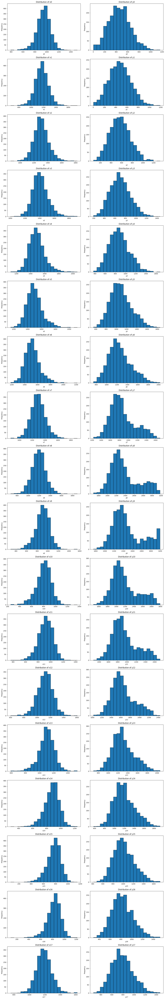

In [34]:
columns_to_plot = df_train_dna_flip.columns[1:37]
num_columns = len(columns_to_plot)
fig_rows = (num_columns + 1) // 2
fig, axes = plt.subplots(fig_rows, 2, figsize=(15, 5 * fig_rows))
axes = axes.ravel()

for i, column in enumerate(columns_to_plot):
    axes[i].hist(df_train_dna_flip[column], bins=20, edgecolor='black')
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

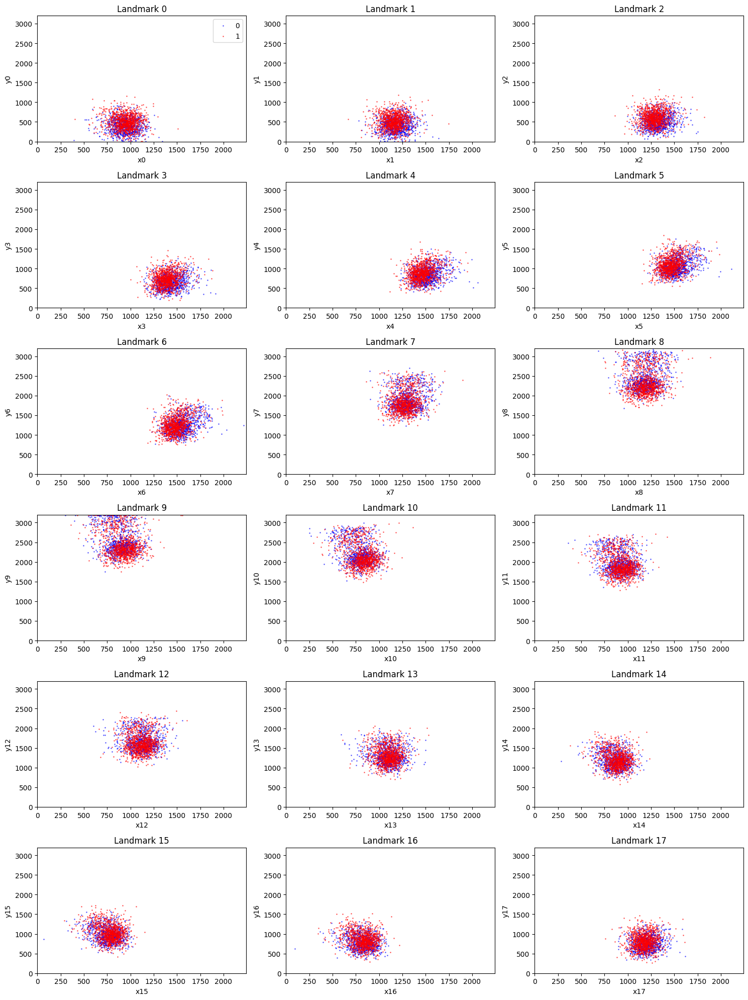

In [35]:
# Number of landmarks
num_landmarks = 18

fig, axes = plt.subplots(6, 3, figsize=(15, 20))
axes = axes.flatten()

for i in range(num_landmarks):
    x_column = f'x{i}'
    y_column = f'y{i}'

    axes[i].scatter(df_train_dna_flip[df_train_dna_flip['sex'] == 0][x_column],
                    df_train_dna_flip[df_train_dna_flip['sex'] == 0][y_column],
                    color='blue', label=0, alpha=0.5, s=1)

    axes[i].scatter(df_train_dna_flip[df_train_dna_flip['sex'] == 1][x_column],
                    df_train_dna_flip[df_train_dna_flip['sex'] == 1][y_column],
                    color='red', label=1, alpha=0.5, s=1)

    axes[i].set_title(f'Landmark {i}')
    axes[i].set_xlabel(f'{x_column}')
    axes[i].set_ylabel(f'{y_column}')
    axes[i].set_xlim(0, 2244)
    axes[i].set_ylim(0, 3200)

    if i == 0:
        axes[i].legend()

plt.tight_layout()
plt.show()

The new visualization of the landmarks distribution shows that the previously observed bimodal distribution from the data understanding phase has disappeared, leaving the values with a normal distribution. This supports the earlier theory that the variation was due to the distribution of right and left feet.
What did not change though is the skew in the y axis in landmarks 7-11.

## Calculate Lengths and Widths

This function calculates the lengths and widths of the footprints by computing pairwise distances between the following landmarks.

Length measurements:
- length_0: distance between landmarks 0 and 9
- length_1: distance between landmarks 1 and 9
- length_2: distance between landmarks 2 and 9
- length_3: distance between landmarks 3 and 9
- length_4: distance between landmarks 4 and 9

Width measurements:
- width_ball_0: distance between landmarks 5 and 16
- width_ball_1: distance between landmarks 5 and 15
- width_ball_2: distance between landmarks 6 and 15
- width_ball_3: distance between landmarks 6 and 16

- width_heel_0: distance between landmarks 8 and 10

The choice was made to use these landmarks based on the research from the studies made by Abledu et al. (2015), Awais et al. (2018), and Dayarathne et al (2021) for footprint sex classification. By focusing on these distances that have already been well defined, unnecessary complexity is reduced while still retaining important information.

In [36]:
def calculate_lengths_widths(df):

    length_0 = np.sqrt((df['x0'] - df['x9'])**2 + (df['y0'] - df['y9'])**2)
    length_1 = np.sqrt((df['x1'] - df['x9'])**2 + (df['y1'] - df['y9'])**2)
    length_2 = np.sqrt((df['x2'] - df['x9'])**2 + (df['y2'] - df['y9'])**2)
    length_3 = np.sqrt((df['x3'] - df['x9'])**2 + (df['y3'] - df['y9'])**2)
    length_4 = np.sqrt((df['x4'] - df['x9'])**2 + (df['y4'] - df['y9'])**2)

    width_ball_0 = np.sqrt((df['x5'] - df['x16'])**2 + (df['y5'] - df['y16'])**2)
    width_ball_1 = np.sqrt((df['x5'] - df['x15'])**2 + (df['y5'] - df['y15'])**2)
    width_ball_2 = np.sqrt((df['x6'] - df['x15'])**2 + (df['y6'] - df['y15'])**2)
    width_ball_3 = np.sqrt((df['x6'] - df['x16'])**2 + (df['y6'] - df['y16'])**2)

    width_heel_0 = np.sqrt((df['x8'] - df['x10'])**2 + (df['y8'] - df['y10'])**2)

    df['length_0'] = length_0
    df['length_1'] = length_1
    df['length_2'] = length_2
    df['length_3'] = length_3
    df['length_4'] = length_4

    df['width_ball_0'] = width_ball_0
    df['width_ball_1'] = width_ball_1
    df['width_ball_2'] = width_ball_2
    df['width_ball_3'] = width_ball_3

    df['width_heel_0'] = width_heel_0

    return df

In [37]:
df_train_dna_lw = calculate_lengths_widths(df_train_dna.copy())
add_foot_type(df_train_dna_lw)
binary_foot_type(df_train_dna_lw)
df_train_dna_lw.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,foot_type_binary
0,0,1246.947634,206.773651,1029.517689,266.973574,885.437605,376.903869,809.468107,502.538493,736.118246,649.112220,736.118246,895.146690,728.259332,1015.546537,977.124931,1654.189205,1060.953344,2159.345085,1338.634960,2256.188440,1430.322286,1991.832254,1307.199305,1719.623904,1126.444291,1426.476450,1110.726464,1080.981237,1325.536770,952.729225,1404.125907,777.364231,1325.536770,581.060132,1037.376603,578.442744,2051.464732,2013.089484,1933.157609,1831.749355,1716.310103,667.880650,678.311833,716.607590,738.592428,405.578554,1
1,0,1348.249031,548.918608,1163.250203,487.305294,967.039326,534.915582,877.342924,683.347654,768.025435,898.994250,745.601335,1092.236005,695.147109,1251.870498,868.933887,1870.804234,992.266438,2428.124657,1286.582755,2498.139786,1370.673131,2184.472010,1213.704429,1980.027835,1051.129702,1643.955218,1087.568865,1274.275339,1351.052043,1249.069893,1465.975557,1086.634795,1412.718319,915.797881,1059.538739,826.178517,1950.196382,2014.613181,1989.059395,1860.362255,1681.121095,690.054695,720.395998,788.339606,792.371911,450.064704,1
2,1,733.608903,625.363825,979.332273,612.058212,1171.637520,691.891892,1289.157393,828.274428,1367.503975,1014.553015,1381.748808,1290.644491,1395.993641,1466.943867,1217.933227,2168.814969,1168.076312,2730.977131,840.445151,2887.318087,694.435612,2508.108108,787.027027,2202.079002,965.087440,1909.355509,986.454690,1516.839917,730.047695,1443.659044,534.181240,1264.033264,527.058824,1031.185031,1054.117647,974.636175,2264.475892,2279.494929,2220.266778,2107.368849,1945.517931,893.204445,847.985223,885.377505,972.076890,523.455933,0
3,1,1331.670233,356.635973,1116.589474,386.355637,1027.353839,491.517527,933.542019,612.682312,864.899223,752.136122,910.661087,928.167980,896.932528,1040.188254,1128.029939,1598.003493,1242.434599,2039.226203,1452.939171,2105.523916,1517.005781,1881.483369,1452.939171,1643.726054,1251.586971,1362.532306,1233.282226,1051.618894,1418.617774,992.179565,1498.701035,839.008987,1446.074892,665.263257,1155.487058,649.260361,1753.087332,1751.762167,1669.173298,1580.616796,1475.618345,596.478697,594.760714,634.506449,664.925627,316.657758,1
4,1,1381.743783,740.879420,1219.185691,711.825325,1097.267122,833.852524,1010.182429,923.920218,920.194914,1101.150197,902.777976,1292.907224,867.944099,1426.556060,1068.238891,1958.245997,1085.655829,2489.935934,1303.367560,2617.773952,1393.355075,2347.570869,1306.270383,2179.057118,1094.364299,1839.124208,1103.072768,1505.002116,1294.659091,1374.258689,1486.245413,1281.285586,1471.731298,1106.961016,1169.837698,1031.420369,1878.530254,1907.806791,1795.787585,1719.039846,1564.279032,598.568187,583.583167,635.137801,683.154429,339.037811,1


In [38]:
df_train_dna_flip_lw = calculate_lengths_widths(df_train_dna_flip.copy())
df_train_dna_flip_lw.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0
0,0,993.052366,206.773651,1210.482311,266.973574,1354.562395,376.903869,1430.531893,502.538493,1503.881754,649.112220,1503.881754,895.146690,1511.740668,1015.546537,1262.875069,1654.189205,1179.046656,2159.345085,901.365040,2256.188440,809.677714,1991.832254,932.800695,1719.623904,1113.555709,1426.476450,1129.273536,1080.981237,914.463230,952.729225,835.874093,777.364231,914.463230,581.060132,1202.623397,578.442744,2051.464732,2013.089484,1933.157609,1831.749355,1716.310103,667.880650,678.311833,716.607590,738.592428,405.578554
1,0,891.750969,548.918608,1076.749797,487.305294,1272.960674,534.915582,1362.657076,683.347654,1471.974565,898.994250,1494.398665,1092.236005,1544.852891,1251.870498,1371.066113,1870.804234,1247.733562,2428.124657,953.417245,2498.139786,869.326869,2184.472010,1026.295571,1980.027835,1188.870298,1643.955218,1152.431135,1274.275339,888.947957,1249.069893,774.024443,1086.634795,827.281681,915.797881,1180.461261,826.178517,1950.196382,2014.613181,1989.059395,1860.362255,1681.121095,690.054695,720.395998,788.339606,792.371911,450.064704
2,1,733.608903,625.363825,979.332273,612.058212,1171.637520,691.891892,1289.157393,828.274428,1367.503975,1014.553015,1381.748808,1290.644491,1395.993641,1466.943867,1217.933227,2168.814969,1168.076312,2730.977131,840.445151,2887.318087,694.435612,2508.108108,787.027027,2202.079002,965.087440,1909.355509,986.454690,1516.839917,730.047695,1443.659044,534.181240,1264.033264,527.058824,1031.185031,1054.117647,974.636175,2264.475892,2279.494929,2220.266778,2107.368849,1945.517931,893.204445,847.985223,885.377505,972.076890,523.455933
3,1,908.329767,356.635973,1123.410526,386.355637,1212.646161,491.517527,1306.457981,612.682312,1375.100777,752.136122,1329.338913,928.167980,1343.067472,1040.188254,1111.970061,1598.003493,997.565401,2039.226203,787.060829,2105.523916,722.994219,1881.483369,787.060829,1643.726054,988.413029,1362.532306,1006.717774,1051.618894,821.382226,992.179565,741.298965,839.008987,793.925108,665.263257,1084.512942,649.260361,1753.087332,1751.762167,1669.173298,1580.616796,1475.618345,596.478697,594.760714,634.506449,664.925627,316.657758
4,1,858.256217,740.879420,1020.814309,711.825325,1142.732878,833.852524,1229.817571,923.920218,1319.805086,1101.150197,1337.222024,1292.907224,1372.055901,1426.556060,1171.761109,1958.245997,1154.344171,2489.935934,936.632440,2617.773952,846.644925,2347.570869,933.729617,2179.057118,1145.635701,1839.124208,1136.927232,1505.002116,945.340909,1374.258689,753.754587,1281.285586,768.268702,1106.961016,1070.162302,1031.420369,1878.530254,1907.806791,1795.787585,1719.039846,1564.279032,598.568187,583.583167,635.137801,683.154429,339.037811


### Lengths/Widths Histogram

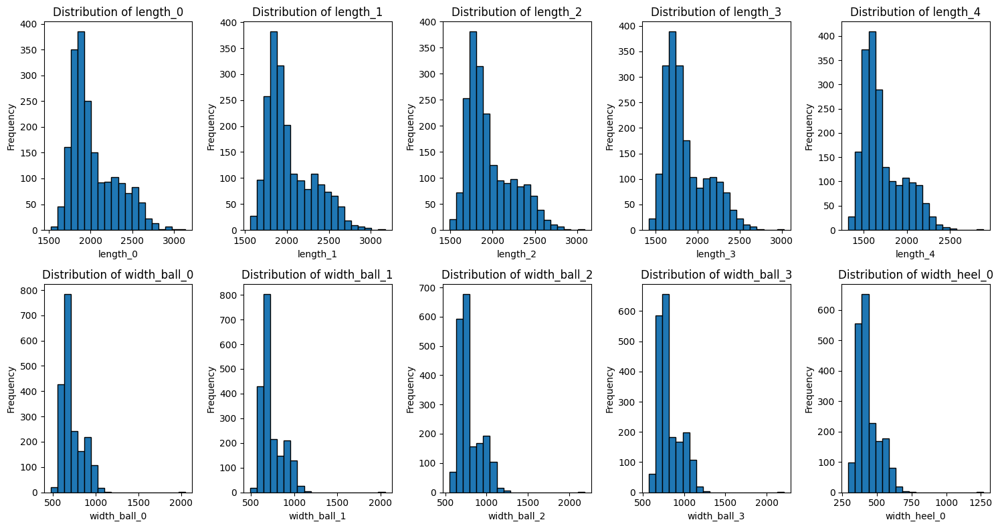

In [39]:
length_columns = ['length_0', 'length_1', 'length_2', 'length_3', 'length_4']
width_columns = ['width_ball_0', 'width_ball_1', 'width_ball_2', 'width_ball_3', 'width_heel_0']

fig, axes = plt.subplots(2, len(length_columns), figsize=(15, 8), sharey=False)

for i, length_col in enumerate(length_columns):
    axes[0, i].hist(df_train_dna_lw[length_col], bins=20, edgecolor='black')
    axes[0, i].set_title(f'Distribution of {length_col}')
    axes[0, i].set_xlabel(length_col)
    axes[0, i].set_ylabel('Frequency')

for i, width_col in enumerate(width_columns):
    axes[1, i].hist(df_train_dna_lw[width_col], bins=20, edgecolor='black')
    axes[1, i].set_title(f'Distribution of {width_col}')
    axes[1, i].set_xlabel(width_col)
    axes[1, i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

Skew in the distribution above further identifies the presence of extreme outliers in the dataset.

### Lengths/Widths Scatter

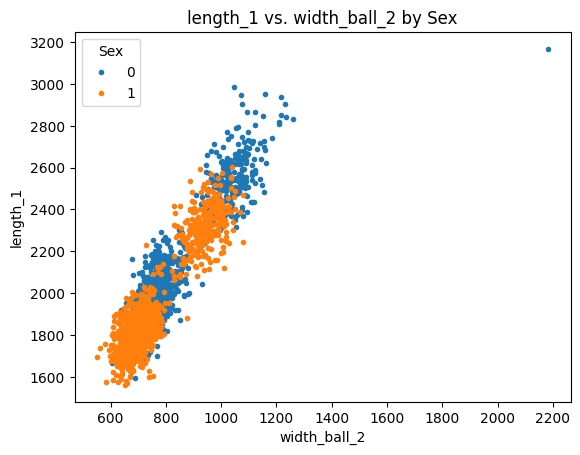

In [40]:
for name, group in df_train_dna_lw.groupby('sex'):
    plt.plot(group.width_ball_2, group.length_1, '.', label=name)

plt.xlabel('width_ball_2')
plt.ylabel('length_1')
plt.title('length_1 vs. width_ball_2 by Sex')
plt.legend(title='Sex')
plt.show()

Two insights are gathered from the figure above, the first being that there is an extreme outlier present in the dataset, possibly the anomaly that was seen earlier in the boxplots of the data understanding phase.
Also, that there seem to be two distinct clusters of data with an upper cluster and lower cluster.

## Calculate Pairwise Distances

In addition to the lengths and widths datasets, a separate branch of datasets was created containing all 153 pairwise distances between the 18 landmarks. The rationale behind this approach was to create a more exhaustive dataset that captures a broader range of information, which may have been missed in the lengths and widths dataset.

Furthermore, more powerful machine learning models, such as ensemble methods or neural networks, are well-suited to handling large datasets. These models can effectively process high-dimensional data and may uncover complex patterns and interactions that are not detectable in the more limited feature set of the lengths and widths datasets.

Due to the small sample size and large number of features of this dataset, there is the risk of overfitting, so that must be considered when building the models.

Random Forest and AdaBoost Classfiers performed the best with the pairwise datasets whereas MLP and Naive Bayes performed the worst.

In [41]:
def all_pairwise_distances(df):
    distances = {}

    for i in range(18):
        for j in range(i + 1, 18):
            # Calculate Euclidean distance between landmark i and landmark j
            distances[f'distance_{i}_{j}'] = np.sqrt((df[f'x{i}'] - df[f'x{j}'])**2 + (df[f'y{i}'] - df[f'y{j}'])**2)

    distance_df = pd.DataFrame(distances)
    df = pd.concat([df, distance_df], axis=1)

    return df

In [42]:
df_train_dna_pairwise = all_pairwise_distances(df_train_dna.copy())

distance_columns_count = df_train_dna_pairwise.filter(like='distance_').shape[1]
print("Number of distance columns:", distance_columns_count)

add_foot_type(df_train_dna_pairwise)
binary_foot_type(df_train_dna_pairwise)

df_train_dna_pairwise.head()

Number of distance columns: 153


,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,foot_type_binary
0,0,1246.947634,206.773651,1029.517689,266.973574,885.437605,376.903869,809.468107,502.538493,736.118246,649.112220,736.118246,895.146690,728.259332,1015.546537,977.124931,1654.189205,1060.953344,2159.345085,1338.634960,2256.188440,1430.322286,1991.832254,1307.199305,1719.623904,1126.444291,1426.476450,1110.726464,1080.981237,1325.536770,952.729225,1404.125907,777.364231,1325.536770,581.060132,1037.376603,578.442744,225.609866,399.541978,528.076868,675.729290,857.207154,960.807544,1472.350528,1961.409973,2051.464732,1794.452697,1514.049588,1225.641047,884.757091,750.083977,591.843408,382.448196,426.682472,181.228420,322.354850,481.781255,693.314284,806.918880,1388.204670,1892.632594,2013.089484,1770.813878,1478.952353,1163.547028,818.048495,746.919078,633.111316,431.598960,311.568301,146.817653,310.473279,539.325405,657.700134,1280.571901,1791.061825,1933.157609,1704.374666,1407.401870,1076.887564,739.242862,724.749692,655.290817,485.146426,252.395279,163.902592,399.401300,519.395917,1163.790434,1675.784267,1831.749355,1613.522798,1314.927087,976.798470,652.190621,684.834696,655.093188,522.008154,240.216024,246.034470,366.518583,1033.568560,1544.772200,1716.310103,1511.560895,1213.313168,869.856062,571.701115,663.021480,680.207919,593.334040,309.436217,120.656064,796.385435,1305.264503,1488.442487,1297.936237,1002.943794,659.291844,418.169577,592.224573,678.311833,667.880650,437.101804,685.418517,1191.201253,1382.660746,1202.508292,911.535206,572.201586,388.024234,600.571688,716.607590,738.592428,535.362693,512.064123,702.205512,565.146592,336.497834,272.303819,588.571783,783.222134,975.270151,1128.271606,1077.432463,294.084538,405.578554,503.975982,735.789032,1079.511905,1235.283863,1423.951716,1600

## Calculate areas

Areas were calculate to add a new type of feature to the dataset, this may improve model performance by capturing patterns in the data not found in the other features.

Broken down into 4 quadrants:
-  **Hindfoot area** - within landmarks 7-8-9-10-11-7
-  **Ball area** - within landmarks 5-6-13-14-15-16-17-5
-  **Midfoot area** - within landmarks 6-7-11-12-13-6
-  **Toes area** - within landmarks 0-1-2-3-4-5-17-16-0

Using Polygon module from Shapely package to calculate the area of polygon between points.

In [43]:
def calculate_footprint_area(footprint):

    # Hindfoot area: landmarks 7-8-9-10-11-7
    hindfoot_coordinates = [
        (footprint['x7'], footprint['y7']),
        (footprint['x8'], footprint['y8']),
        (footprint['x9'], footprint['y9']),
        (footprint['x10'], footprint['y10']),
        (footprint['x11'], footprint['y11'])
    ]

    # Midfoot area: landmarks 6-7-11-12-13-6
    midfoot_coordinates = [
        (footprint['x6'], footprint['y6']),
        (footprint['x7'], footprint['y7']),
        (footprint['x11'], footprint['y11']),
        (footprint['x12'], footprint['y12']),
        (footprint['x13'], footprint['y13'])
    ]

    # Ball area: landmarks 5-6-13-14-15-16-17-5
    ball_coordinates = [
        (footprint['x5'], footprint['y5']),
        (footprint['x6'], footprint['y6']),
        (footprint['x13'], footprint['y13']),
        (footprint['x14'], footprint['y14']),
        (footprint['x15'], footprint['y15']),
        (footprint['x16'], footprint['y16']),
        (footprint['x17'], footprint['y17'])
    ]

    # Toes area: landmarks 0-1-2-3-4-5-17-16-0
    toes_coordinates = [
        (footprint['x0'], footprint['y0']),
        (footprint['x1'], footprint['y1']),
        (footprint['x2'], footprint['y2']),
        (footprint['x3'], footprint['y3']),
        (footprint['x4'], footprint['y4']),
        (footprint['x5'], footprint['y5']),
        (footprint['x17'], footprint['y17']),
        (footprint['x16'], footprint['y16'])
    ]

    toes_area = Polygon(toes_coordinates).area
    ball_area = Polygon(ball_coordinates).area
    midfoot_area = Polygon(midfoot_coordinates).area
    hindfoot_area = Polygon(hindfoot_coordinates).area
    total_area = toes_area + ball_area + midfoot_area + hindfoot_area

    return toes_area, ball_area, midfoot_area, hindfoot_area, total_area


def add_areas(df):

    new_df = df.copy()
    new_df['toes_area'] = 0.0
    new_df['ball_area'] = 0.0
    new_df['midfoot_area'] = 0.0
    new_df['hindfoot_area'] = 0.0
    new_df['total_area'] = 0.0

    for i, footprint in new_df.iterrows():
        toes_area, ball_area, midfoot_area, hindfoot_area, total_area = calculate_footprint_area(footprint)

        new_df.at[i, 'toes_area'] = toes_area
        new_df.at[i, 'ball_area'] = ball_area
        new_df.at[i, 'midfoot_area'] = midfoot_area
        new_df.at[i, 'hindfoot_area'] = hindfoot_area
        new_df.at[i, 'total_area'] = total_area

    return new_df

In [44]:
df_train_dna_lw_a = add_areas(df_train_dna_lw.copy())
df_train_dna_lw_a.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,foot_type_binary,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,1246.947634,206.773651,1029.517689,266.973574,885.437605,376.903869,809.468107,502.538493,736.118246,649.112220,736.118246,895.146690,728.259332,1015.546537,977.124931,1654.189205,1060.953344,2159.345085,1338.634960,2256.188440,1430.322286,1991.832254,1307.199305,1719.623904,1126.444291,1426.476450,1110.726464,1080.981237,1325.536770,952.729225,1404.125907,777.364231,1325.536770,581.060132,1037.376603,578.442744,2051.464732,2013.089484,1933.157609,1831.749355,1716.310103,667.880650,678.311833,716.607590,738.592428,405.578554,1,184538.767072,237427.218428,184038.234635,182354.937195,7.883592e+05
1,0,1348.249031,548.918608,1163.250203,487.305294,967.039326,534.915582,877.342924,683.347654,768.025435,898.994250,745.601335,1092.236005,695.147109,1251.870498,868.933887,1870.804234,992.266438,2428.124657,1286.582755,2498.139786,1370.673131,2184.472010,1213.704429,1980.027835,1051.129702,1643.955218,1087.568865,1274.275339,1351.052043,1249.069893,1465.975557,1086.634795,1412.718319,915.797881,1059.538739,826.178517,1950.196382,2014.613181,1989.059395,1860.362255,1681.121095,690.054695,720.395998,788.339606,792.371911,450.064704,1,201944.628278,241097.158250,198094.138864,196245.432938,8.373814e+05
2,1,733.608903,625.363825,979.332273,612.058212,1171.637520,691.891892,1289.157393,828.274428,1367.503975,1014.553015,1381.748808,1290.644491,1395.993641,1466.943867,1217.933227,2168.814969,1168.076312,2730.977131,840.445151,2887.318087,694.435612,2508.108108,787.027027,2202.079002,965.087440,1909.355509,986.454690,1516.839917,730.047695,1443.659044,534.181240,1264.033264,527.058824,1031.185031,1054.117647,974.636175,2264.475892,2279.494929,2220.266778,2107.368849,1945.517931,893.204445,847.985223,885.377505,972.076890,523.455933,0,273257.951605,344559.116044,251781.126363,276616.296864,1.146214e+06
3,1,1331.670233,356.635973,1116.589474,386.355637,1027.353839,491.517527,933.542019,612.682312,864.899223,752.136122,910.661087,928.167980,896.932528,1040.188254,1128.029939,1598.003493,1242.434599,2039.226203,1452.939171,2105.523916,1517.005781,1881.483369,1452.939171,1643.726054,1251.586971,1362.532306,1233.282226,1051.618894,1418.617774,992.179565,1498.701035,839.008987,1446.074892,665.263257,1155.487058,649.260361,1753.087332,1751.762167,1669.173298,1580.616796,1475.618345,596.478697,594.760714,634.506449,664.925627,316.657758,1,146375.546103,177324.011904,154930.640469,132461.421361,6.110916e+05
4,1,1381.743783,740.879420,1219.185691,711.825325,1097.267122,833.852524,1010.182429,923.920218,920.194914,1101.150197,902.777976,1292.907224,867.944099,1426.556060,1068.238891,1958.245997,1085.655829,2489.935934,1303.367560,2617.773952,1393.355075,2347.570869,1306.270383,2179.057118,1094.364299,1839.124208,1103.072768,1505.002116,1294.659091,1374.258689,1486.245413,1281.285586,1471.731298,1106.961016,1169.837698,1031.420369,1878.530254,1907.806791,1795.787585,1719.039846,1564.279032,598.568187,583.583167,635.137801,683.154429,339.037811,1,149208.159768,176997.826356,75559.217894,128646.336660,5.304115e+05


In [45]:
df_train_dna_flip_lw_a = add_areas(df_train_dna_flip_lw.copy())
df_train_dna_flip_lw_a.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,993.052366,206.773651,1210.482311,266.973574,1354.562395,376.903869,1430.531893,502.538493,1503.881754,649.112220,1503.881754,895.146690,1511.740668,1015.546537,1262.875069,1654.189205,1179.046656,2159.345085,901.365040,2256.188440,809.677714,1991.832254,932.800695,1719.623904,1113.555709,1426.476450,1129.273536,1080.981237,914.463230,952.729225,835.874093,777.364231,914.463230,581.060132,1202.623397,578.442744,2051.464732,2013.089484,1933.157609,1831.749355,1716.310103,667.880650,678.311833,716.607590,738.592428,405.578554,184538.767072,237427.218428,184038.234635,182354.937195,7.883592e+05
1,0,891.750969,548.918608,1076.749797,487.305294,1272.960674,534.915582,1362.657076,683.347654,1471.974565,898.994250,1494.398665,1092.236005,1544.852891,1251.870498,1371.066113,1870.804234,1247.733562,2428.124657,953.417245,2498.139786,869.326869,2184.472010,1026.295571,1980.027835,1188.870298,1643.955218,1152.431135,1274.275339,888.947957,1249.069893,774.024443,1086.634795,827.281681,915.797881,1180.461261,826.178517,1950.196382,2014.613181,1989.059395,1860.362255,1681.121095,690.054695,720.395998,788.339606,792.371911,450.064704,201944.628278,241097.158250,198094.138864,196245.432938,8.373814e+05
2,1,733.608903,625.363825,979.332273,612.058212,1171.637520,691.891892,1289.157393,828.274428,1367.503975,1014.553015,1381.748808,1290.644491,1395.993641,1466.943867,1217.933227,2168.814969,1168.076312,2730.977131,840.445151,2887.318087,694.435612,2508.108108,787.027027,2202.079002,965.087440,1909.355509,986.454690,1516.839917,730.047695,1443.659044,534.181240,1264.033264,527.058824,1031.185031,1054.117647,974.636175,2264.475892,2279.494929,2220.266778,2107.368849,1945.517931,893.204445,847.985223,885.377505,972.076890,523.455933,273257.951605,344559.116044,251781.126363,276616.296864,1.146214e+06
3,1,908.329767,356.635973,1123.410526,386.355637,1212.646161,491.517527,1306.457981,612.682312,1375.100777,752.136122,1329.338913,928.167980,1343.067472,1040.188254,1111.970061,1598.003493,997.565401,2039.226203,787.060829,2105.523916,722.994219,1881.483369,787.060829,1643.726054,988.413029,1362.532306,1006.717774,1051.618894,821.382226,992.179565,741.298965,839.008987,793.925108,665.263257,1084.512942,649.260361,1753.087332,1751.762167,1669.173298,1580.616796,1475.618345,596.478697,594.760714,634.506449,664.925627,316.657758,146375.546103,177324.011904,154930.640469,132461.421361,6.110916e+05
4,1,858.256217,740.879420,1020.814309,711.825325,1142.732878,833.852524,1229.817571,923.920218,1319.805086,1101.150197,1337.222024,1292.907224,1372.055901,1426.556060,1171.761109,1958.245997,1154.344171,2489.935934,936.632440,2617.773952,846.644925,2347.570869,933.729617,2179.057118,1145.635701,1839.124208,1136.927232,1505.002116,945.340909,1374.258689,753.754587,1281.285586,768.268702,1106.961016,1070.162302,1031.420369,1878.530254,1907.806791,1795.787585,1719.039846,1564.279032,598.568187,583.583167,635.137801,683.154429,339.037811,149208.159768,176997.826356,75559.217894,128646.336660,5.304115e+05


In [46]:
df_train_dna_pairwise_a = add_areas(df_train_dna_pairwise.copy())
df_train_dna_pairwise_a.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,foot_type_binary,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,1246.947634,206.773651,1029.517689,266.973574,885.437605,376.903869,809.468107,502.538493,736.118246,649.112220,736.118246,895.146690,728.259332,1015.546537,977.124931,1654.189205,1060.953344,2159.345085,1338.634960,2256.188440,1430.322286,1991.832254,1307.199305,1719.623904,1126.444291,1426.476450,1110.726464,1080.981237,1325.536770,952.729225,1404.125907,777.364231,1325.536770,581.060132,1037.376603,578.442744,225.609866,399.541978,528.076868,675.729290,857.207154,960.807544,1472.350528,1961.409973,2051.464732,1794.452697,1514.049588,1225.641047,884.757091,750.083977,591.843408,382.448196,426.682472,181.228420,322.354850,481.781255,693.314284,806.918880,1388.204670,1892.632594,2013.089484,1770.813878,1478.952353,1163.547028,818.048495,746.919078,633.111316,431.598960,311.568301,146.817653,310.473279,539.325405,657.700134,1280.571901,1791.061825,1933.157609,1704.374666,1407.401870,1076.887564,739.242862,724.749692,655.290817,485.146426,252.395279,163.902592,399.401300,519.395917,1163.790434,1675.784267,1831.749355,1613.522798,1314.927087,976.798470,652.190621,684.834696,655.093188,522.008154,240.216024,246.034470,366.518583,1033.568560,1544.772200,1716.310103,1511.560895,1213.313168,869.856062,571.701115,663.021480,680.207919,593.334040,309.436217,120.656064,796.385435,1305.264503,1488.442487,1297.936237,1002.943794,659.291844,418.169577,592.224573,678.311833,667.880650,437.101804,685.418517,1191.201253,1382.660746,1202.508292,911.535206,572.201586,388.024234,600.571688,716.607590,738.592428,535.362693,512.064123,702.205512,565.146592,336.497834,272.303819,588.571783,783.222134,975.270151,1128.271606,1077.432463,294.084538,405.578554,503.

### Area Histograms

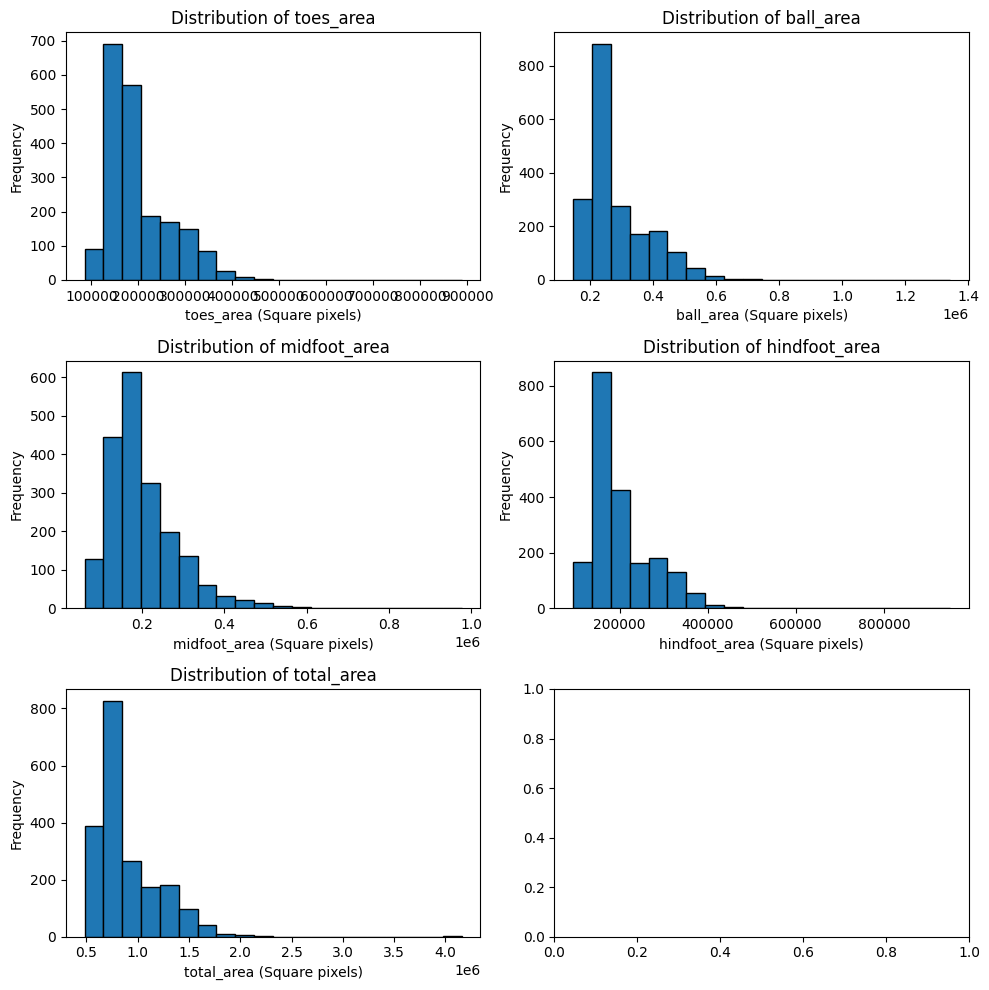

In [47]:
columns_to_plot = ["toes_area", "ball_area", "midfoot_area", "hindfoot_area", "total_area"]

fig, axes = plt.subplots(3, 2, figsize=(10, 10))
axes = axes.ravel()

for i, column in enumerate(columns_to_plot):
    axes[i].hist(df_train_dna_flip_lw_a[column], bins=20, edgecolor='black')
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(f'{column} (Square pixels)')
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

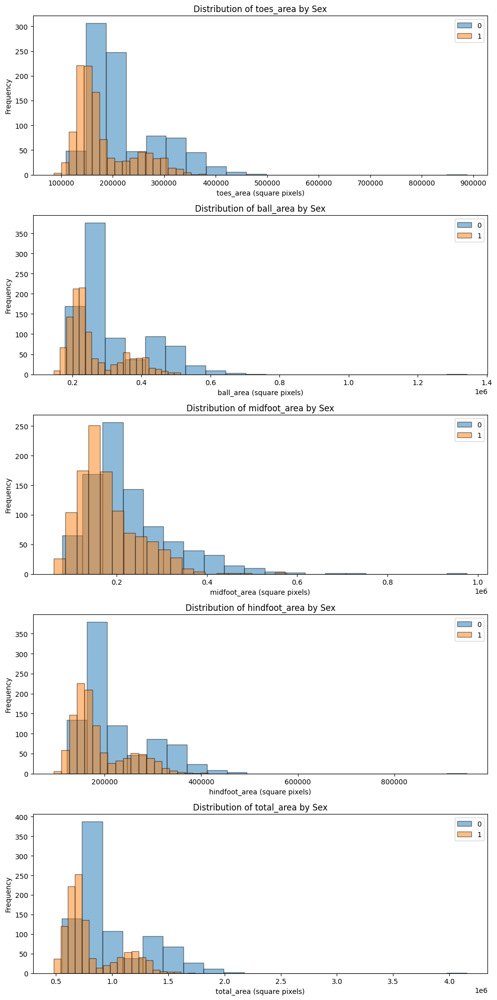

In [48]:
columns_to_plot = ["toes_area", "ball_area", "midfoot_area", "hindfoot_area", "total_area"]

sex_1_data = df_train_dna_flip_lw_a[df_train_dna_flip_lw_a["sex"] == 1]
sex_0_data = df_train_dna_flip_lw_a[df_train_dna_flip_lw_a["sex"] == 0]

fig, axes = plt.subplots(5, 1, figsize=(10, 20))
axes = axes.ravel()

for i, column in enumerate(columns_to_plot):
    axes[i].hist(sex_0_data[column], bins=20, alpha=0.5, label='0', edgecolor='black')
    axes[i].hist(sex_1_data[column], bins=20, alpha=0.5, label='1', edgecolor='black')
    axes[i].set_title(f'Distribution of {column} by Sex')
    axes[i].set_xlabel(f'{column} (square pixels)')
    axes[i].set_ylabel('Frequency')
    axes[i].legend(loc='upper right')

plt.tight_layout()
plt.show()

Again, observed is the skew in the distribution of the data, likely caused by outliers that will be dealt with next. There is also an offset between the two sexes which will be useful in distinguishing between classes during modelling.

## Handling Outliers

Outliers are found and dealt with to reduce their negative impact on the models. It was found while evaluating that the better performing models used a dataset that had been cleaned, including all the top ten, and that models performed much worse when they had not been cleaned, for example increasing MLP accuracy by 3%.

### Boxplot Pre-Processing

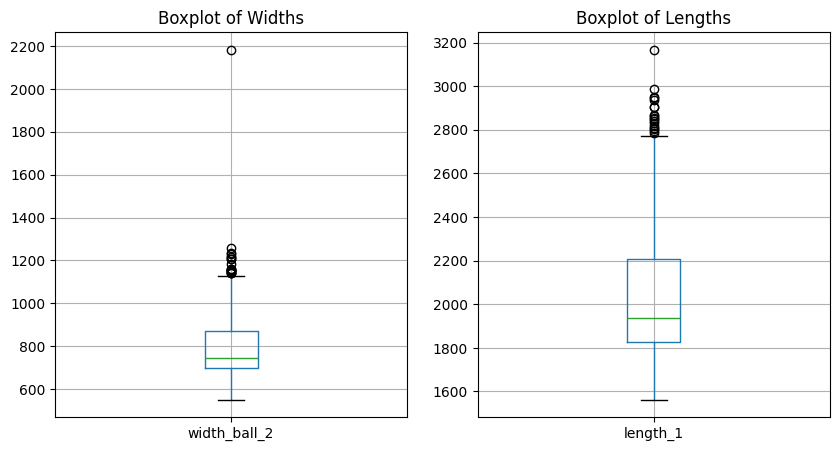

In [49]:
# Boxplot for width
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
df_train_dna_flip_lw_a.boxplot(column=['width_ball_2'])
plt.title('Boxplot of Widths')

# Boxplot for height
plt.subplot(1, 2, 2)
df_train_dna_flip_lw_a.boxplot(column=['length_1'])
plt.title('Boxplot of Lengths')

plt.show()

### Finding Outliers

In [50]:
Q1_width = df_train_dna_flip_lw_a['width_ball_2'].quantile(0.25)
Q3_width = df_train_dna_flip_lw_a['width_ball_2'].quantile(0.75)
IQR_width = Q3_width - Q1_width

width_outliers = df_train_dna_flip_lw_a[(df_train_dna_flip_lw_a['width_ball_2'] < Q1_width - 1.5 * IQR_width) | (df_train_dna_flip_lw_a['width_ball_2'] > Q3_width + 1.5 * IQR_width)]

Q1_length = df_train_dna_flip_lw_a['length_1'].quantile(0.25)
Q3_length = df_train_dna_flip_lw_a['length_1'].quantile(0.75)
IQR_length = Q3_length - Q1_length

length_outliers = df_train_dna_flip_lw_a[(df_train_dna_flip_lw_a['length_1'] < Q1_length - 1.5 * IQR_length) | (df_train_dna_flip_lw_a['length_1'] > Q3_length + 1.5 * IQR_length)]

combined_outliers = df_train_dna_flip_lw_a[((df_train_dna_flip_lw_a['width_ball_2'] < Q1_width - 1.5 * IQR_width) | (df_train_dna_flip_lw_a['width_ball_2'] > Q3_width + 1.5 * IQR_width)) |
                       ((df_train_dna_flip_lw_a['length_1'] < Q1_length - 1.5 * IQR_length) | (df_train_dna_flip_lw_a['length_1'] > Q3_length + 1.5 * IQR_length))]

print(combined_outliers)

      sex           x0          y0           x1          y1           x2  \
25      0   608.098160  218.036072   955.092025  250.100200  1192.147239   
130     0   989.447853  195.591182  1315.828221  307.815631  1511.656442   
394     0   865.766871  185.971944  1113.128834  211.623246  1329.570552   
492     0   979.332273   93.139293  1324.769475   49.896050  1467.217806   
540     0   644.578696  206.237006   954.403816  299.376299  1139.586645   
651     0  1007.821940  555.509356  1349.697933  535.550936  1570.492846   
661     0  1046.995231  129.729730  1431.605723  239.501040  1606.104928   
713     0   715.180723   44.094488  1015.421687   25.196850  1241.445783   
855     0   950.842607  369.230769  1225.055644  482.328482  1413.799682   
896     0   943.720191  176.299376  1264.228935  236.174636  1456.534181   
918     0   669.507154  246.153846  1043.434022  199.584200  1228.616852   
1030    0  1018.795181  655.118110  1315.662651  740.157480  1460.722892   
1054    0   

In [51]:
df_filtered = df_train_dna_pairwise[df_train_dna_pairwise['distance_6_15'] >= 2000]
df_filtered.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,foot_type_binary
1981,0,393.191489,35.270541,1090.212766,22.44489,1435.744681,173.146293,1787.234043,352.705411,2061.276596,638.076152,2114.893617,990.781563,2216.170213,1244.088176,1656.170213,2250.901804,1507.234043,2927.45491,667.234043,3161.523046,268.085106,2664.529058,536.170213,2215.631263,994.893617,1843.687375,780.425532,1436.472946,285.957447,1160.721443,65.531915,872.144289,95.319149,628.456914,1179.574468,503.406814,697.139267,1051.630581,1429.727085,1773.663589,1969.075806,2187.348052,2550.320989,3099.325932,3138.240597,2632.233264,2185.043659,1905.890053,1453.72569,1130.548041,898.731587,663.775567,915.177447,376.965804,771.304526,1149.768156,1409.839267,1661.382705,2299.201611,2934.789594,3167.447343,2767.038605,2262.085236,1823.735159,1447.56467,1393.736033,1331.149847,1164.930849,489.193097,394.697667,779.390756,1062.906728,1325.134155,2089.415081,2755.236231,3085.612455,2751.439072,2231.810717,1727.731799,1423.178632,1515.689731,1538.207145,1415.644153,417.965536,395.64603,717.287929,989.216595,1902.715763,2589.929532,3023.881034,2766.286693,2244.026166,1688.440276,1479.261791,1704.910943,1798.353404,1714.238869,626.067945,356.757469,625.49389,1662.924461,2355.465611,2882.904588,2705.92814,2194.226425,1609.556174,1509.31007,1850.652907,2009.423978,1965.98098,891.927392,272.802473,1341.018338,2029.766935,2609.183173,2492.414964,1998.155243,1407.781348,1406.927816,1836.814383,2052.792778,2051.81875,1054.682918,1152.073643,1826.55798,2464.905625,2410.951654,1940.694713,1360.527737,1448.57678,1932.01225,2182.564396,2208.395591,1274.024968,692.752545,1344.330985,1448.401798,1120.555224,776.601782,1195.919358,1750.992931,2105.018404,2251.351475,1811.32058,872.002232,1266.735998,1204.017386,1198.768027,165

In [52]:
df_filtered = df_train_dna_flip_lw_a[df_train_dna_flip_lw_a['width_ball_2'] >= 2000]
df_filtered.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
1981,0,393.191489,35.270541,1090.212766,22.44489,1435.744681,173.146293,1787.234043,352.705411,2061.276596,638.076152,2114.893617,990.781563,2216.170213,1244.088176,1656.170213,2250.901804,1507.234043,2927.45491,667.234043,3161.523046,268.085106,2664.529058,536.170213,2215.631263,994.893617,1843.687375,780.425532,1436.472946,285.957447,1160.721443,65.531915,872.144289,95.319149,628.456914,1179.574468,503.406814,3138.240597,3167.447343,3085.612455,3023.881034,2882.904588,2051.81875,2052.792778,2182.564396,2208.395591,1266.735998,887786.125442,1.342558e+06,976247.644225,950316.633267,4.156908e+06


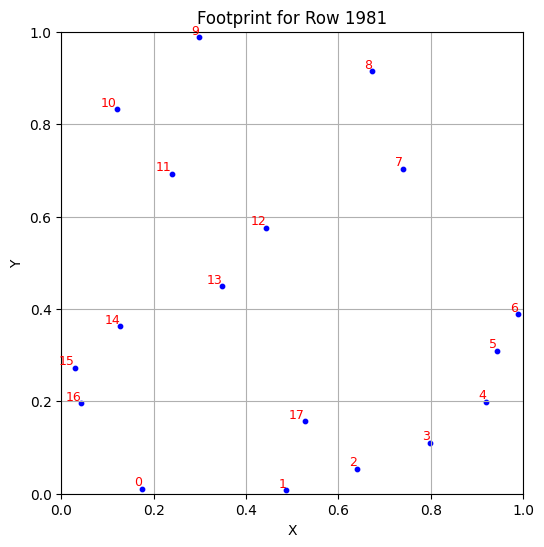

In [53]:
plot_footprint(df_train_orig, 1981, norm=True)

Seen here is the one extreme outlier that is an anomalous datapoint, keeping this in the dataset can have a negative impact on the performance of certain models such as Support Vector Machines and Logistic Regression. Therefore this outlier will be removed on the the condition of distance between landmark 6 and 15 being greater than 2000, this threshold was decided on based on observations from the boxplot above.

### Dropping Outliers

In [54]:
df_train_dna_flip_lw_a_clean = df_train_dna_flip_lw_a[df_train_dna_flip_lw_a['width_ball_2'] <= 2000]
df_train_dna_flip_lw_clean = df_train_dna_flip_lw[df_train_dna_flip_lw['width_ball_2'] <= 2000]
df_train_dna_lw_clean = df_train_dna_lw[df_train_dna_lw['width_ball_2'] <= 2000]
df_train_dna_lw_a_clean = df_train_dna_lw_a[df_train_dna_lw_a['width_ball_2'] <= 2000]
df_train_dna_pairwise_clean = df_train_dna_pairwise[df_train_dna_pairwise['distance_6_15'] <= 2000]
df_train_dna_pairwise_a_clean = df_train_dna_pairwise_a[df_train_dna_pairwise_a['distance_6_15'] <= 2000]

### Boxplot Post-processing

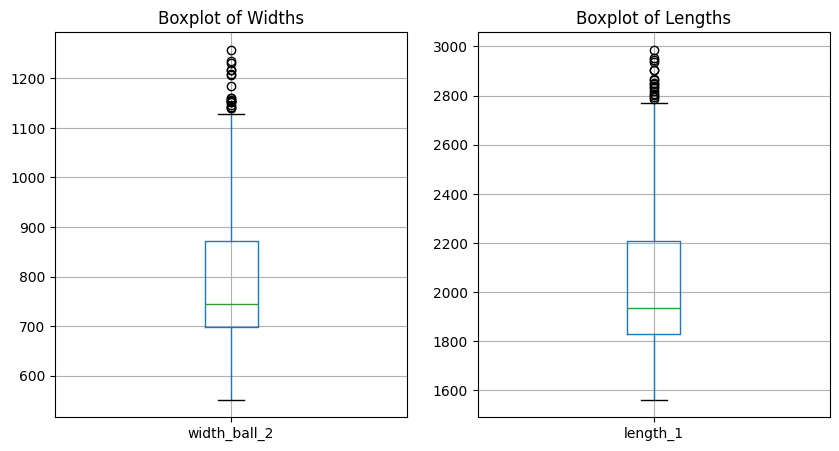

In [55]:
# Boxplot for width
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
df_train_dna_flip_lw_a_clean.boxplot(column=['width_ball_2'])
plt.title('Boxplot of Widths')

# Boxplot for length
plt.subplot(1, 2, 2)
df_train_dna_flip_lw_a_clean.boxplot(column=['length_1'])
plt.title('Boxplot of Lengths')

plt.show()

### Visualizing dataset after cleaning

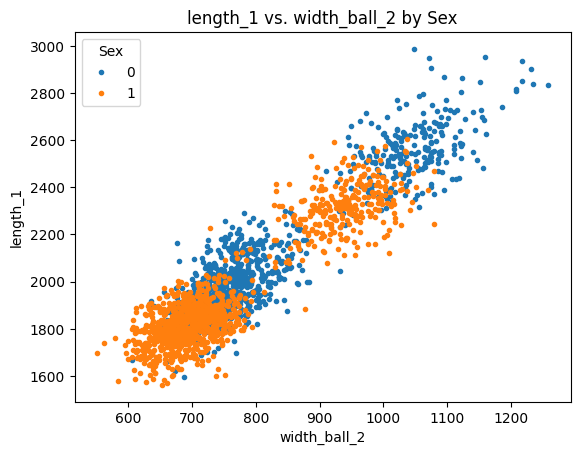

In [56]:
for name, group in df_train_dna_flip_lw_a_clean.groupby('sex'):
    plt.plot(group.width_ball_2, group.length_1, '.', label=name)

plt.xlabel('width_ball_2')
plt.ylabel('length_1')
plt.title('length_1 vs. width_ball_2 by Sex')
plt.legend(title='Sex')
plt.show()

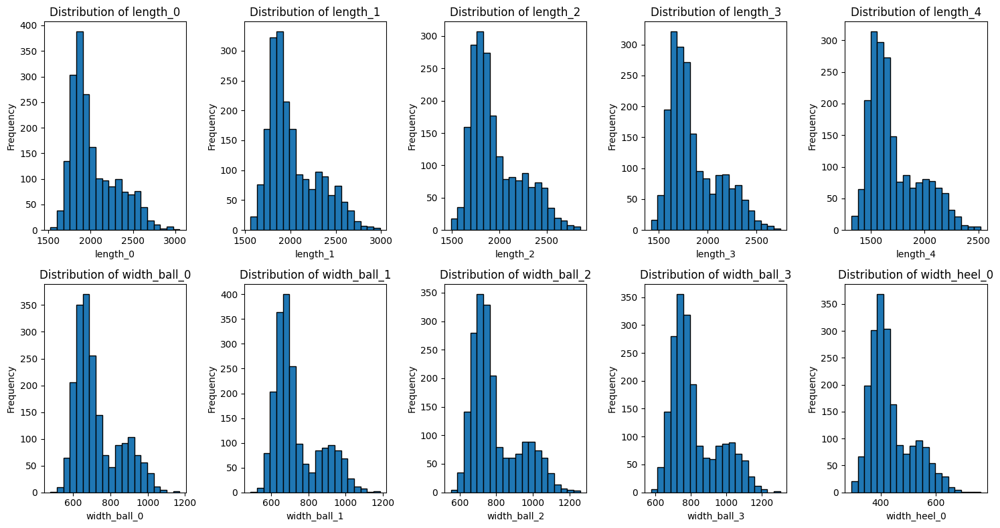

In [57]:
length_columns = ['length_0', 'length_1', 'length_2', 'length_3', 'length_4']
width_columns = ['width_ball_0', 'width_ball_1', 'width_ball_2', 'width_ball_3', 'width_heel_0']

fig, axes = plt.subplots(2, len(length_columns), figsize=(15, 8), sharey=False)

# Plot histograms for lengths
for i, length_col in enumerate(length_columns):
    axes[0, i].hist(df_train_dna_flip_lw_a_clean[length_col], bins=20, edgecolor='black')
    axes[0, i].set_title(f'Distribution of {length_col}')
    axes[0, i].set_xlabel(length_col)
    axes[0, i].set_ylabel('Frequency')

# Plot histograms for widths
for i, width_col in enumerate(width_columns):
    axes[1, i].hist(df_train_dna_flip_lw_a_clean[width_col], bins=20, edgecolor='black')
    axes[1, i].set_title(f'Distribution of {width_col}')
    axes[1, i].set_xlabel(width_col)
    axes[1, i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

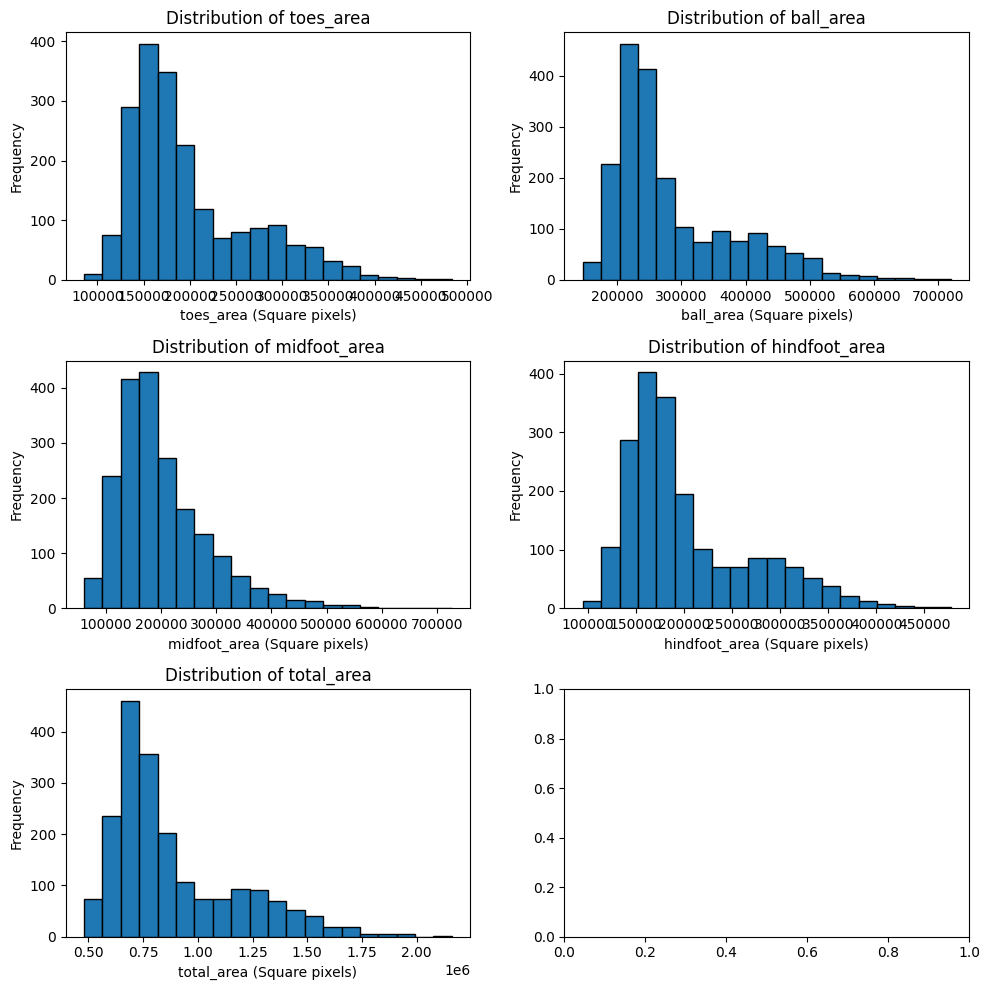

In [58]:
columns_to_plot = ["toes_area", "ball_area", "midfoot_area", "hindfoot_area", "total_area"]

fig, axes = plt.subplots(3, 2, figsize=(10, 10))
axes = axes.ravel()

for i, column in enumerate(columns_to_plot):
    axes[i].hist(df_train_dna_flip_lw_a_clean[column], bins=20, edgecolor='black')
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel(f'{column} (Square pixels)')
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

## Dropping Coordinate columns

The addition of new features led to overfitting in some models such as MLP and the larger ensemble models.
As well as this, the training and testing times were becoming too computationally expensive.
To mitigate these problems, the choice was made to cull some features from the larger datasets and try modelling again with new, smaller datasets.

The features dropped here were the original coordinate columns, as the idea was that the more important patterns in the data would taken from the newly engineered distances and areas, and that the coordinates may be introducing redundancy and complexity in the data.

The usefulness of this method varied between models, it increased the accuracy of some, such as SVC Bagging Classifier and Decision Tree but decreased the accuracy of Random Forest and MLP. Although these difference were all very small at less than 1%.

In [59]:
df_train_dna_lw_a_clean_shrunk = df_train_dna_lw_a_clean.copy()

for i in range(18):
    df_train_dna_lw_a_clean_shrunk = df_train_dna_lw_a_clean_shrunk.drop([f"x{i}", f"y{i}"], axis=1)

print(f"number of features before shrinking: {df_train_dna_lw_a_clean.shape[1]}")
print(f"number of features after shrinking: {df_train_dna_lw_a_clean_shrunk.shape[1]}")

df_train_dna_lw_a_clean_shrunk.head()

number of features before shrinking: 53
number of features after shrinking: 17


,sex,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,foot_type_binary,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,2051.464732,2013.089484,1933.157609,1831.749355,1716.310103,667.880650,678.311833,716.607590,738.592428,405.578554,1,184538.767072,237427.218428,184038.234635,182354.937195,7.883592e+05
1,0,1950.196382,2014.613181,1989.059395,1860.362255,1681.121095,690.054695,720.395998,788.339606,792.371911,450.064704,1,201944.628278,241097.158250,198094.138864,196245.432938,8.373814e+05
2,1,2264.475892,2279.494929,2220.266778,2107.368849,1945.517931,893.204445,847.985223,885.377505,972.076890,523.455933,0,273257.951605,344559.116044,251781.126363,276616.296864,1.146214e+06
3,1,1753.087332,1751.762167,1669.173298,1580.616796,1475.618345,596.478697,594.760714,634.506449,664.925627,316.657758,1,146375.546103,177324.011904,154930.640469,132461.421361,6.110916e+05
4,1,1878.530254,1907.806791,1795.787585,1719.039846,1564.279032,598.568187,583.583167,635.137801,683.154429,339.037811,1,149208.159768,176997.826356,75559.217894,128646.336660,5.304115e+05


In [60]:
df_train_dna_pairwise_a_clean_shrunk = df_train_dna_pairwise_a_clean.copy()

for i in range(18):
    df_train_dna_pairwise_a_clean_shrunk = df_train_dna_pairwise_a_clean_shrunk.drop([f"x{i}", f"y{i}"], axis=1)

print(f"number of features before shrinking: {df_train_dna_pairwise_a_clean.shape[1]}")
print(f"number of features after shrinking: {df_train_dna_pairwise_a_clean_shrunk.shape[1]}")
df_train_dna_pairwise_a_clean_shrunk.head()

number of features before shrinking: 196
number of features after shrinking: 160


,sex,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,foot_type_binary,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,225.609866,399.541978,528.076868,675.729290,857.207154,960.807544,1472.350528,1961.409973,2051.464732,1794.452697,1514.049588,1225.641047,884.757091,750.083977,591.843408,382.448196,426.682472,181.228420,322.354850,481.781255,693.314284,806.918880,1388.204670,1892.632594,2013.089484,1770.813878,1478.952353,1163.547028,818.048495,746.919078,633.111316,431.598960,311.568301,146.817653,310.473279,539.325405,657.700134,1280.571901,1791.061825,1933.157609,1704.374666,1407.401870,1076.887564,739.242862,724.749692,655.290817,485.146426,252.395279,163.902592,399.401300,519.395917,1163.790434,1675.784267,1831.749355,1613.522798,1314.927087,976.798470,652.190621,684.834696,655.093188,522.008154,240.216024,246.034470,366.518583,1033.568560,1544.772200,1716.310103,1511.560895,1213.313168,869.856062,571.701115,663.021480,680.207919,593.334040,309.436217,120.656064,796.385435,1305.264503,1488.442487,1297.936237,1002.943794,659.291844,418.169577,592.224573,678.311833,667.880650,437.101804,685.418517,1191.201253,1382.660746,1202.508292,911.535206,572.201586,388.024234,600.571688,716.607590,738.592428,535.362693,512.064123,702.205512,565.146592,336.497834,272.303819,588.571783,783.222134,975.270151,1128.271606,1077.432463,294.084538,405.578554,503.975982,735.789032,1079.511905,1235.283863,1423.951716,1600.308652,1581.078137,279.804859,537.484606,856.415125,1197.102441,1303.525024,1480.273660,1675.179516,1704.578311,298.758522,641.848129,965.293254,1044.373070,1214.750522,1414.658257,1466.995643,344.394839,668.181139,767.113884,947.231787,1138.711432,1172.646038,345.852559,513.881551,706.012573,868.542783,852.698200,250.184025,422.216200,544.118166,507.863307,192.169544,371.669093,472.362840,211.451062,417.222734,288.172054,1,184538.767072,237427.218428,184038.234635,182354.9371

## Scaling

Features were scaled to increase performance of the models, they were both normalized and standardized and evaluated on each.
In general Normalization got the best results, with some of the higher performing models using a normalized dataset. But, standardization was still able to get to over 91% on the training set with many models, even beating normalized datasets in some instances.

Whereas, datasets that had not been scaled performed significantly worse than the ones that had been.

### Normalizing

In [61]:
scaler = MinMaxScaler()

df_train_dna_flip_lw_a_clean_norm = df_train_dna_flip_lw_a_clean.copy()
columns_to_normalize = df_train_dna_flip_lw_a_clean_norm.columns.difference(['sex'])
df_train_dna_flip_lw_a_clean_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_flip_lw_a_clean_norm[columns_to_normalize])

df_train_dna_flip_lw_clean_norm = df_train_dna_flip_lw_clean.copy()
columns_to_normalize = df_train_dna_flip_lw_clean_norm.columns.difference(['sex'])
df_train_dna_flip_lw_clean_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_flip_lw_clean_norm[columns_to_normalize])

df_train_dna_lw_a_clean_shrunk_norm = df_train_dna_lw_a_clean_shrunk.copy()
columns_to_normalize = df_train_dna_lw_a_clean_shrunk_norm.columns.difference(['sex', 'foot_type_binary'])
df_train_dna_lw_a_clean_shrunk_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_lw_a_clean_shrunk_norm[columns_to_normalize])

df_train_dna_lw_a_clean_norm = df_train_dna_lw_a_clean.copy()
columns_to_normalize = df_train_dna_lw_a_clean_norm.columns.difference(['sex', 'foot_type_binary'])
df_train_dna_lw_a_clean_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_lw_a_clean_norm[columns_to_normalize])

df_train_dna_pairwise_a_clean_shrunk_norm = df_train_dna_pairwise_a_clean_shrunk.copy()
columns_to_normalize = df_train_dna_pairwise_a_clean_shrunk_norm.columns.difference(['sex', 'foot_type_binary'])
df_train_dna_pairwise_a_clean_shrunk_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_pairwise_a_clean_shrunk_norm[columns_to_normalize])

df_train_dna_pairwise_a_clean_norm = df_train_dna_pairwise_a_clean.copy()
columns_to_normalize = df_train_dna_pairwise_a_clean_norm.columns.difference(['sex', 'foot_type_binary'])
df_train_dna_pairwise_a_clean_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_pairwise_a_clean_norm[columns_to_normalize])


### Standardizing

In [62]:
scaler = StandardScaler()

df_train_dna_flip_lw_a_clean_stan = df_train_dna_flip_lw_a_clean.copy()
columns_to_standardize = df_train_dna_flip_lw_a_clean_stan.columns.difference(['sex'])
df_train_dna_flip_lw_a_clean_stan[columns_to_standardize] = scaler.fit_transform(df_train_dna_flip_lw_a_clean_stan[columns_to_standardize])

df_train_dna_flip_lw_clean_stan = df_train_dna_flip_lw_clean.copy()
columns_to_standardize = df_train_dna_flip_lw_clean_stan.columns.difference(['sex'])
df_train_dna_flip_lw_clean_stan[columns_to_standardize] = scaler.fit_transform(df_train_dna_flip_lw_clean_stan[columns_to_standardize])

df_train_dna_lw_a_clean_shrunk_stan = df_train_dna_lw_a_clean_shrunk.copy()
columns_to_standardize = df_train_dna_lw_a_clean_shrunk_stan.columns.difference(['sex', 'foot_type_binary'])
df_train_dna_lw_a_clean_shrunk_stan[columns_to_standardize] = scaler.fit_transform(df_train_dna_lw_a_clean_shrunk_stan[columns_to_standardize])

df_train_dna_lw_a_clean_stan = df_train_dna_lw_a_clean.copy()
columns_to_standardize = df_train_dna_lw_a_clean_stan.columns.difference(['sex', 'foot_type_binary'])
df_train_dna_lw_a_clean_stan[columns_to_standardize] = scaler.fit_transform(df_train_dna_lw_a_clean_stan[columns_to_standardize])

df_train_dna_pairwise_a_clean_shrunk_stan = df_train_dna_pairwise_a_clean_shrunk.copy()
columns_to_standardize = df_train_dna_pairwise_a_clean_shrunk_stan.columns.difference(['sex', 'foot_type_binary'])
df_train_dna_pairwise_a_clean_shrunk_stan[columns_to_standardize] = scaler.fit_transform(df_train_dna_pairwise_a_clean_shrunk_stan[columns_to_standardize])

df_train_dna_pairwise_a_clean_stan = df_train_dna_pairwise_a_clean.copy()
columns_to_standardize = df_train_dna_pairwise_a_clean_stan.columns.difference(['sex', 'foot_type_binary'])
df_train_dna_pairwise_a_clean_stan[columns_to_standardize] = scaler.fit_transform(df_train_dna_pairwise_a_clean_stan[columns_to_standardize])


## Handling Class Imbalance

After multiple rounds of processing and modelling the choice was made to apply Synthetic Minority Over-sampling Technique (SMOTE), as observed in the data understanding phase there was slight class imbalance with 44.2% and 55.8 for sex 0 and 1 respectively. This class imbalance can lead to overfitting on the holdout set as the minority class is underrepresented.
SMOTE will balance the class distribution by generating synthetic data for the minority class, and hopefully make the models able to generalize better on unseen data.

SMOTE increased the accuracy of most models by about 1%, with all the top ten including SMOTE.

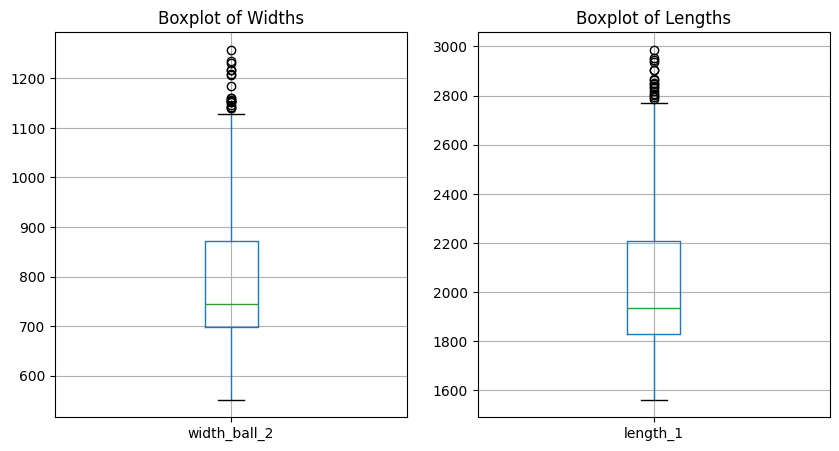

In [63]:
df_train_dna_smote = df_train_dna.copy()

# First finding and then dropping outliers
df_train_dna_smote = calculate_lengths_widths(df_train_dna_smote)
df_train_dna_smote = df_train_dna_smote[df_train_dna_smote['width_ball_2'] <= 2000]

# Boxplot to check extreme outlier has been dropped
# Boxplot for width
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
df_train_dna_smote.boxplot(column=['width_ball_2'])
plt.title('Boxplot of Widths')

# Boxplot for length
plt.subplot(1, 2, 2)
df_train_dna_smote.boxplot(column=['length_1'])
plt.title('Boxplot of Lengths')

plt.show()

# Dropping lengths and widths as they were only needed to clean the dataset for the time being
df_train_dna_smote = df_train_dna_smote.drop(["length_0", "length_1", "length_2", "length_3", "length_4", "width_ball_0", "width_ball_1", "width_ball_2", "width_ball_3", "width_heel_0"], axis=1)

In [64]:
X = df_train_dna_smote.drop('sex', axis=1)
y = df_train_dna_smote['sex']

# Applying SMOTE
smote = SMOTE(random_state=1)
X_smote, y_smote = smote.fit_resample(X, y)
df_train_dna_smote = pd.concat([y_smote, X_smote], axis=1)

print(df_train_dna_smote["sex"].value_counts())

sex
0    1110
1    1110
Name: count, dtype: int64


In [65]:
df_train_dna_smote.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
0,0,1246.947634,206.773651,1029.517689,266.973574,885.437605,376.903869,809.468107,502.538493,736.118246,649.112220,736.118246,895.146690,728.259332,1015.546537,977.124931,1654.189205,1060.953344,2159.345085,1338.634960,2256.188440,1430.322286,1991.832254,1307.199305,1719.623904,1126.444291,1426.476450,1110.726464,1080.981237,1325.536770,952.729225,1404.125907,777.364231,1325.536770,581.060132,1037.376603,578.442744
1,0,1348.249031,548.918608,1163.250203,487.305294,967.039326,534.915582,877.342924,683.347654,768.025435,898.994250,745.601335,1092.236005,695.147109,1251.870498,868.933887,1870.804234,992.266438,2428.124657,1286.582755,2498.139786,1370.673131,2184.472010,1213.704429,1980.027835,1051.129702,1643.955218,1087.568865,1274.275339,1351.052043,1249.069893,1465.975557,1086.634795,1412.718319,915.797881,1059.538739,826.178517
2,1,733.608903,625.363825,979.332273,612.058212,1171.637520,691.891892,1289.157393,828.274428,1367.503975,1014.553015,1381.748808,1290.644491,1395.993641,1466.943867,1217.933227,2168.814969,1168.076312,2730.977131,840.445151,2887.318087,694.435612,2508.108108,787.027027,2202.079002,965.087440,1909.355509,986.454690,1516.839917,730.047695,1443.659044,534.181240,1264.033264,527.058824,1031.185031,1054.117647,974.636175
3,1,1331.670233,356.635973,1116.589474,386.355637,1027.353839,491.517527,933.542019,612.682312,864.899223,752.136122,910.661087,928.167980,896.932528,1040.188254,1128.029939,1598.003493,1242.434599,2039.226203,1452.939171,2105.523916,1517.005781,1881.483369,1452.939171,1643.726054,1251.586971,1362.532306,1233.282226,1051.618894,1418.617774,992.179565,1498.701035,839.008987,1446.074892,665.263257,1155.487058,649.260361
4,1,1381.743783,740.879420,1219.185691,711.825325,1097.267122,833.852524,1010.182429,923.920218,920.194914,1101.150197,902.777976,1292.907224,867.944099,1426.556060,1068.238891,1958.245997,1085.655829,2489.935934,1303.367560,2617.773952,1393.355075,2347.570869,1306.270383,2179.057118,1094.364299,1839.124208,1103.072768,1505.002116,1294.659091,1374.258689,1486.245413,1281.285586,1471.731298,1106.961016,1169.837698,1031.420369


In [66]:
df_train_dna_clean_smote_lw_a_norm = df_train_dna_smote.copy()

df_train_dna_clean_smote_lw_a_norm = add_foot_type(df_train_dna_clean_smote_lw_a_norm)
df_train_dna_clean_smote_lw_a_norm = binary_foot_type(df_train_dna_clean_smote_lw_a_norm)
df_train_dna_clean_smote_lw_a_norm = calculate_lengths_widths(df_train_dna_clean_smote_lw_a_norm)
df_train_dna_clean_smote_lw_a_norm = add_areas(df_train_dna_clean_smote_lw_a_norm)
scaler = MinMaxScaler()
columns_to_normalize = df_train_dna_clean_smote_lw_a_norm.columns.difference(['sex'])
df_train_dna_clean_smote_lw_a_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_clean_smote_lw_a_norm[columns_to_normalize])

df_train_dna_clean_smote_lw_a_norm.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,foot_type_binary,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.643969,0.175333,0.467153,0.222716,0.350936,0.245497,0.290695,0.244936,0.278067,0.214095,0.283896,0.263692,0.294443,0.210618,0.488960,0.289659,0.582057,0.318390,0.619033,0.349836,0.679853,0.339412,0.652816,0.308353,0.546506,0.287459,0.481866,0.281100,0.676329,0.279552,0.679473,0.277779,0.641133,0.234858,0.414588,0.260083,1.0,0.345220,0.316344,0.325946,0.309629,0.329243,0.274699,0.272492,0.233597,0.223460,0.239084,0.248731,0.158985,0.185668,0.229221,0.183229
1,0,0.721366,0.470022,0.583971,0.408757,0.411901,0.371832,0.334331,0.387977,0.296093,0.405242,0.289354,0.415226,0.275782,0.394672,0.405913,0.436900,0.525516,0.498465,0.586118,0.517068,0.645473,0.466700,0.588329,0.489417,0.468139,0.441123,0.459578,0.423176,0.694620,0.500128,0.717159,0.513962,0.697892,0.506625,0.436884,0.466390,1.0,0.279059,0.317413,0.367029,0.331305,0.299860,0.306667,0.333014,0.335138,0.297408,0.334404,0.292470,0.165390,0.206741,0.265518,0.212416
2,1,0.251766,0.535865,0.423315,0.514094,0.564756,0.497340,0.599084,0.502632,0.634772,0.493639,0.655514,0.567775,0.670746,0.562176,0.673804,0.639469,0.670238,0.701368,0.304007,0.786059,0.255704,0.680543,0.294031,0.643813,0.378609,0.628647,0.362261,0.601467,0.249441,0.644967,0.149407,0.649438,0.121290,0.600305,0.431430,0.590021,0.0,0.484386,0.503311,0.536950,0.518425,0.520631,0.599549,0.516500,0.472501,0.544505,0.491658,0.471671,0.345962,0.287230,0.475530,0.396290
3,1,0.708700,0.304409,0.543212,0.323518,0.456962,0.337134,0.370461,0.332073,0.350822,0.292903,0.384361,0.289081,0.389499,0.229810,0.604794,0.251467,0.731448,0.237914,0.691313,0.245701,0.729816,0.266499,0.753339,0.255580,0.676722,0.242278,0.599819,0.259518,0.743056,0.308916,0.737099,0.324855,0.719608,0.303221,0.533411,0.319058,1.0,0.150282,0.132940,0.131937,0.119384,0.128265,0.171758,0.152337,0.117378,0.122168,0.048555,0.152832,0.054087,0.142030,0.098848,0.077687
4,1,0.746957,0.635358,0.632831,0.598334,0.509194,0.610843,0.419733,0.578299,0.382062,0.559881,0.379824,0.569515,0.373162,0.530721,0.558899,0.496337,0.602391,0.539877,0.596732,0.599756,0.658546,0.574468,0.652175,0.627805,0.513126,0.579023,0.474500,0.592766,0.654194,0.593310,0.729509,0.662613,0.736312,0.661826,0.547848,0.637309,1.0,0.232237,0.242455,0.224989,0.224246,0.202297,0.174770,0.136262,0.118272,0.147233,0.096508,0.159950,0.053518,0.023034,0.088879,0.029652


In [67]:
# Adding Lengths, widths and areas
df_train_dna_clean_smote_flip_lw_a_norm = df_train_dna_smote.copy()

df_train_dna_clean_smote_flip_lw_a_norm = add_foot_type(df_train_dna_clean_smote_flip_lw_a_norm)
df_train_dna_clean_smote_flip_lw_a_norm = flip_footprints(df_train_dna_clean_smote_flip_lw_a_norm, False, "left")
df_train_dna_clean_smote_flip_lw_a_norm = df_train_dna_clean_smote_flip_lw_a_norm.drop(['foot_type'], axis=1)
df_train_dna_clean_smote_flip_lw_a_norm = calculate_lengths_widths(df_train_dna_clean_smote_flip_lw_a_norm)
df_train_dna_clean_smote_flip_lw_a_norm = add_areas(df_train_dna_clean_smote_flip_lw_a_norm)
scaler = MinMaxScaler()
columns_to_normalize = df_train_dna_clean_smote_flip_lw_a_norm.columns.difference(['sex'])
df_train_dna_clean_smote_flip_lw_a_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_clean_smote_flip_lw_a_norm[columns_to_normalize])

df_train_dna_clean_smote_flip_lw_a_norm.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.533420,0.175333,0.504288,0.222716,0.511636,0.245497,0.469247,0.244936,0.430577,0.214095,0.413990,0.263692,0.387220,0.210618,0.385231,0.289659,0.411962,0.318390,0.479130,0.349836,0.502080,0.339412,0.537134,0.308353,0.510699,0.287459,0.571895,0.281100,0.623937,0.279552,0.634276,0.277779,0.655335,0.234858,0.516853,0.260083,0.345220,0.316344,0.325946,0.309629,0.329243,0.274699,0.272492,0.233597,0.223460,0.239084,0.248731,0.158985,0.185668,0.229221,0.183229
1,0,0.441673,0.470022,0.380329,0.408757,0.426797,0.371832,0.394544,0.387977,0.394958,0.405242,0.402723,0.415226,0.426056,0.394672,0.489646,0.436900,0.469085,0.498465,0.520526,0.517068,0.555667,0.466700,0.624920,0.489417,0.585775,0.441123,0.596496,0.423176,0.594034,0.500128,0.562545,0.513962,0.555749,0.506625,0.491154,0.466390,0.279059,0.317413,0.367029,0.331305,0.299860,0.306667,0.333014,0.335138,0.297408,0.334404,0.292470,0.165390,0.206741,0.265518,0.212416
2,1,0.298446,0.535865,0.290030,0.514094,0.321455,0.497340,0.313650,0.502632,0.278337,0.493639,0.268881,0.567775,0.251468,0.562176,0.341858,0.639469,0.402839,0.701368,0.430682,0.786059,0.398551,0.680543,0.400262,0.643813,0.362703,0.628647,0.420178,0.601467,0.407805,0.644967,0.284383,0.649438,0.212810,0.600305,0.344647,0.590021,0.484386,0.503311,0.536950,0.518425,0.520631,0.599549,0.516500,0.472501,0.544505,0.491658,0.471671,0.345962,0.287230,0.475530,0.396290
3,1,0.456688,0.304409,0.423580,0.323518,0.364090,0.337134,0.332691,0.332073,0.286817,0.292903,0.206612,0.289081,0.189394,0.229810,0.239593,0.251467,0.261037,0.237914,0.388227,0.245701,0.424207,0.266499,0.400293,0.255580,0.385955,0.242278,0.441704,0.259518,0.514848,0.308916,0.524591,0.324855,0.517647,0.303221,0.379894,0.319058,0.150282,0.132940,0.131937,0.119384,0.128265,0.171758,0.152337,0.117378,0.122168,0.048555,0.152832,0.054087,0.142030,0.098848,0.077687
4,1,0.411337,0.635358,0.328481,0.598334,0.291404,0.610843,0.248340,0.578299,0.225090,0.559881,0.215978,0.569515,0.223393,0.530721,0.297297,0.496337,0.391419,0.539877,0.507177,0.599756,0.535291,0.574468,0.538006,0.627805,0.542677,0.579023,0.580026,0.592766,0.660126,0.593310,0.539037,0.662613,0.488340,0.661826,0.363253,0.637309,0.232237,0.242455,0.224989,0.224246,0.202297,0.174770,0.136262,0.118272,0.147233,0.096508,0.159950,0.053518,0.023034,0.088879,0.029652


In [68]:
df_train_dna_clean_smote_flip_pairwise_a_norm = df_train_dna_smote.copy()

df_train_dna_clean_smote_flip_pairwise_a_norm = add_foot_type(df_train_dna_clean_smote_flip_pairwise_a_norm)
df_train_dna_clean_smote_flip_pairwise_a_norm = flip_footprints(df_train_dna_clean_smote_flip_pairwise_a_norm, False, "left")
df_train_dna_clean_smote_flip_pairwise_a_norm = df_train_dna_clean_smote_flip_pairwise_a_norm.drop(['foot_type'], axis=1)
df_train_dna_clean_smote_flip_pairwise_a_norm = all_pairwise_distances(df_train_dna_clean_smote_flip_pairwise_a_norm)
df_train_dna_clean_smote_flip_pairwise_a_norm = add_areas(df_train_dna_clean_smote_flip_pairwise_a_norm)
scaler = MinMaxScaler()
columns_to_normalize = df_train_dna_clean_smote_flip_pairwise_a_norm.columns.difference(['sex'])
df_train_dna_clean_smote_flip_pairwise_a_norm[columns_to_normalize] = scaler.fit_transform(df_train_dna_clean_smote_flip_pairwise_a_norm[columns_to_normalize])

df_train_dna_clean_smote_flip_pairwise_a_norm.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.533420,0.175333,0.504288,0.222716,0.511636,0.245497,0.469247,0.244936,0.430577,0.214095,0.413990,0.263692,0.387220,0.210618,0.385231,0.289659,0.411962,0.318390,0.479130,0.349836,0.502080,0.339412,0.537134,0.308353,0.510699,0.287459,0.571895,0.281100,0.623937,0.279552,0.634276,0.277779,0.655335,0.234858,0.516853,0.260083,0.418559,0.448752,0.380336,0.316164,0.382504,0.329061,0.350948,0.348904,0.345220,0.384513,0.338903,0.358463,0.337646,0.344157,0.362089,0.388640,0.396131,0.390902,0.349695,0.266557,0.339028,0.285019,0.349176,0.319988,0.316344,0.362517,0.319532,0.359701,0.257992,0.326269,0.337485,0.338675,0.365737,0.227094,0.235970,0.342210,0.276129,0.354168,0.328761,0.325946,0.362243,0.324069,0.365387,0.243203,0.289631,0.334814,0.294856,0.434123,0.330675,0.367074,0.255657,0.358233,0.310905,0.309629,0.349077,0.307031,0.340230,0.222901,0.263036,0.308828,0.268857,0.370404,0.457182,0.317350,0.343952,0.332856,0.329243,0.354148,0.316159,0.337120,0.239895,0.287135,0.304288,0.260438,0.358522,0.179188,0.352186,0.310191,0.311535,0.344584,0.315322,0.300604,0.209571,0.290983,0.272492,0.274699,0.454749,0.403345,0.359119,0.329939,0.406774,0.367332,0.359822,0.199594,0.254407,0.233597,0.223460,0.258891,0.380048,0.337800,0.317956,0.301004,0.311900,0.360521,0.301799,0.275434,0.299105,0.358153,0.215159,0.239084,0.301606,0.417651,0.342847,0.337151,0.320831,0.332719,0.318810,0.253683,0.361445,0.410419,0.357988,0.346270,0.338880,0.346338,0.316317,0.388922,0.397020,0.428128,0.415240,0.401855,0.401344,0.361898,0.358666,0.376032,0.384076,0.341071,0.337897,0.324443,0.383025,0.325517,0.297299,0.334149,0.339810,0.383160,0.372552,0.324779,0.224807,0.318309,0.357001,0.264685,0.421179,0

In [69]:
df_train_dna_clean_smote_flip_pairwise_a_norm_shrunk = df_train_dna_clean_smote_flip_pairwise_a_norm.copy()

for i in range(18):
    df_train_dna_clean_smote_flip_pairwise_a_norm_shrunk = df_train_dna_clean_smote_flip_pairwise_a_norm_shrunk.drop([f"x{i}", f"y{i}"], axis=1)

df_train_dna_clean_smote_flip_pairwise_a_norm_shrunk.head()

,sex,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.418559,0.448752,0.380336,0.316164,0.382504,0.329061,0.350948,0.348904,0.345220,0.384513,0.338903,0.358463,0.337646,0.344157,0.362089,0.388640,0.396131,0.390902,0.349695,0.266557,0.339028,0.285019,0.349176,0.319988,0.316344,0.362517,0.319532,0.359701,0.257992,0.326269,0.337485,0.338675,0.365737,0.227094,0.235970,0.342210,0.276129,0.354168,0.328761,0.325946,0.362243,0.324069,0.365387,0.243203,0.289631,0.334814,0.294856,0.434123,0.330675,0.367074,0.255657,0.358233,0.310905,0.309629,0.349077,0.307031,0.340230,0.222901,0.263036,0.308828,0.268857,0.370404,0.457182,0.317350,0.343952,0.332856,0.329243,0.354148,0.316159,0.337120,0.239895,0.287135,0.304288,0.260438,0.358522,0.179188,0.352186,0.310191,0.311535,0.344584,0.315322,0.300604,0.209571,0.290983,0.272492,0.274699,0.454749,0.403345,0.359119,0.329939,0.406774,0.367332,0.359822,0.199594,0.254407,0.233597,0.223460,0.258891,0.380048,0.337800,0.317956,0.301004,0.311900,0.360521,0.301799,0.275434,0.299105,0.358153,0.215159,0.239084,0.301606,0.417651,0.342847,0.337151,0.320831,0.332719,0.318810,0.253683,0.361445,0.410419,0.357988,0.346270,0.338880,0.346338,0.316317,0.388922,0.397020,0.428128,0.415240,0.401855,0.401344,0.361898,0.358666,0.376032,0.384076,0.341071,0.337897,0.324443,0.383025,0.325517,0.297299,0.334149,0.339810,0.383160,0.372552,0.324779,0.224807,0.318309,0.357001,0.264685,0.421179,0.260207,0.217211,0.248731,0.158985,0.185668,0.229221,0.183229
1,0,0.337460,0.412109,0.307334,0.318877,0.323165,0.327430,0.304027,0.313157,0.279059,0.265230,0.276715,0.264965,0.206472,0.264185,0.280246,0.363502,0.340812,0.464764,0.414128,0.427259,0.405708,0.409839,0.367509,0.361655,0.317413,0.317235,0.331322,0.358245,0.228535,0.378585,0.398604,0.453635,0.463071,0.349200,0.484454,0.456586,0.445698,0.397635,0.408565,0.367029,0.357304,0.372949,0.40

In [70]:
df_train_dna_clean_smote_flip_pairwise_a_stan = df_train_dna_smote.copy()

df_train_dna_clean_smote_flip_pairwise_a_stan = add_foot_type(df_train_dna_clean_smote_flip_pairwise_a_stan)
df_train_dna_clean_smote_flip_pairwise_a_stan = flip_footprints(df_train_dna_clean_smote_flip_pairwise_a_stan, False, "left")
df_train_dna_clean_smote_flip_pairwise_a_stan = df_train_dna_clean_smote_flip_pairwise_a_stan.drop(['foot_type'], axis=1)
df_train_dna_clean_smote_flip_pairwise_a_stan = all_pairwise_distances(df_train_dna_clean_smote_flip_pairwise_a_stan)
df_train_dna_clean_smote_flip_pairwise_a_stan = add_areas(df_train_dna_clean_smote_flip_pairwise_a_stan)
scaler = StandardScaler()
columns_to_standardize = df_train_dna_clean_smote_flip_pairwise_a_stan.columns.difference(['sex'])
df_train_dna_clean_smote_flip_pairwise_a_stan[columns_to_standardize] = scaler.fit_transform(df_train_dna_clean_smote_flip_pairwise_a_stan[columns_to_standardize])

df_train_dna_clean_smote_flip_pairwise_a_stan.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.459753,-1.290497,0.379592,-1.057410,0.454535,-0.974190,0.184588,-1.000425,0.123432,-1.113014,0.031295,-0.906609,-0.087787,-1.076129,-0.256834,-0.768633,-0.081354,-0.701074,0.015622,-0.707765,0.062710,-0.653442,0.130421,-0.833331,-0.055913,-0.906996,0.274848,-0.998950,0.408785,-1.146164,0.623604,-1.139859,0.838486,-1.248754,0.130991,-1.068525,-0.150396,0.196276,-0.038243,-0.155050,0.071171,-0.210019,0.045017,0.027289,0.030995,0.194255,0.047436,0.043496,0.082325,-0.032086,0.022198,-0.182071,0.119694,0.365480,-0.170501,-0.388225,-0.069012,-0.410255,-0.087555,-0.103453,-0.105706,0.031414,-0.129587,-0.137164,-0.193480,-0.367790,-0.423351,-0.801806,-0.100683,-0.702549,-0.752968,-0.205145,-0.584942,-0.132098,-0.149720,-0.145152,-0.006827,-0.177230,-0.185173,-0.274960,-0.392713,-0.421794,-0.697347,-0.004944,-0.707994,-0.037475,-0.562438,-0.097813,-0.138486,-0.150146,-0.018956,-0.195491,-0.177966,-0.312932,-0.474378,-0.551278,-0.797264,-0.042962,0.717294,-0.296167,0.093083,-0.013330,-0.046257,0.094733,-0.072665,0.012610,-0.150970,-0.342488,-0.481579,-0.683676,-0.105671,-1.320282,-0.119755,-0.187187,-0.203425,-0.068526,-0.281352,-0.229942,-0.422293,-0.440742,-0.495141,-0.504962,0.035470,0.233196,0.046585,-0.029356,0.096448,-0.106119,0.017836,-0.426254,-0.469016,-0.596438,-0.636223,-0.458590,-0.225775,-0.331833,-0.269217,-0.636313,-0.144452,-0.110661,-0.077688,-0.204441,-0.112431,-0.083721,-0.264994,-0.414003,-0.150548,-0.057820,-0.053509,0.018941,-0.085324,-0.034109,-0.110646,-0.734868,-0.064878,-0.126415,-0.046044,0.050847,-0.035580,0.018452,-0.128124,0.604538,0.113379,0.208338,0.337909,0.203608,0.242726,0.025722,-0.322782,-0.048369,0.087079,-0.054958,0.025760,-0

In [71]:
df_train_kna_smote = df_train_kna.copy()
df_train_kna_smote = calculate_lengths_widths(df_train_kna_smote)
df_train_kna_smote = df_train_kna_smote[df_train_kna_smote['width_ball_2'] <= 2000]
df_train_kna_smote = df_train_kna_smote.drop(["length_0", "length_1", "length_2", "length_3", "length_4", "width_ball_0", "width_ball_1", "width_ball_2", "width_ball_3", "width_heel_0"], axis=1)

X = df_train_kna_smote.drop('sex', axis=1)
y = df_train_kna_smote['sex']

smote = SMOTE(random_state=1)
X_smote, y_smote = smote.fit_resample(X, y)
df_train_kna_smote = pd.concat([y_smote, X_smote], axis=1)

print(df_train_kna_smote["sex"].value_counts())
df_train_kna_smote.head()

sex
0    1117
1    1117
Name: count, dtype: int64


,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
0,0,1246.947634,206.773651,1029.517689,266.973574,885.437605,376.903869,809.468107,502.538493,736.118246,649.112220,736.118246,895.146690,728.259332,1015.546537,977.124931,1654.189205,1060.953344,2159.345085,1338.634960,2256.188440,1430.322286,1991.832254,1307.199305,1719.623904,1126.444291,1426.476450,1110.726464,1080.981237,1325.536770,952.729225,1404.125907,777.364231,1325.536770,581.060132,1037.376603,578.442744
1,0,1348.249031,548.918608,1163.250203,487.305294,967.039326,534.915582,877.342924,683.347654,768.025435,898.994250,745.601335,1092.236005,695.147109,1251.870498,868.933887,1870.804234,992.266438,2428.124657,1286.582755,2498.139786,1370.673131,2184.472010,1213.704429,1980.027835,1051.129702,1643.955218,1087.568865,1274.275339,1351.052043,1249.069893,1465.975557,1086.634795,1412.718319,915.797881,1059.538739,826.178517
2,1,733.608903,625.363825,979.332273,612.058212,1171.637520,691.891892,1289.157393,828.274428,1367.503975,1014.553015,1381.748808,1290.644491,1395.993641,1466.943867,1217.933227,2168.814969,1168.076312,2730.977131,840.445151,2887.318087,694.435612,2508.108108,787.027027,2202.079002,965.087440,1909.355509,986.454690,1516.839917,730.047695,1443.659044,534.181240,1264.033264,527.058824,1031.185031,1054.117647,974.636175
3,1,1331.670233,356.635973,1116.589474,386.355637,1027.353839,491.517527,933.542019,612.682312,864.899223,752.136122,910.661087,928.167980,896.932528,1040.188254,1128.029939,1598.003493,1242.434599,2039.226203,1452.939171,2105.523916,1517.005781,1881.483369,1452.939171,1643.726054,1251.586971,1362.532306,1233.282226,1051.618894,1418.617774,992.179565,1498.701035,839.008987,1446.074892,665.263257,1155.487058,649.260361
4,1,1381.743783,740.879420,1219.185691,711.825325,1097.267122,833.852524,1010.182429,923.920218,920.194914,1101.150197,902.777976,1292.907224,867.944099,1426.556060,1068.238891,1958.245997,1085.655829,2489.935934,1303.367560,2617.773952,1393.355075,2347.570869,1306.270383,2179.057118,1094.364299,1839.124208,1103.072768,1505.002116,1294.659091,1374.258689,1486.245413,1281.285586,1471.731298,1106.961016,1169.837698,1031.420369


In [72]:
df_train_kna_clean_smote_flip_lw_a_norm = df_train_kna_smote.copy()

df_train_kna_clean_smote_flip_lw_a_norm = add_foot_type(df_train_kna_clean_smote_flip_lw_a_norm)
df_train_kna_clean_smote_flip_lw_a_norm = flip_footprints(df_train_kna_clean_smote_flip_lw_a_norm, False, "left")
df_train_kna_clean_smote_flip_lw_a_norm = df_train_kna_clean_smote_flip_lw_a_norm.drop(['foot_type'], axis=1)
df_train_kna_clean_smote_flip_lw_a_norm = calculate_lengths_widths(df_train_kna_clean_smote_flip_lw_a_norm)
df_train_kna_clean_smote_flip_lw_a_norm = add_areas(df_train_kna_clean_smote_flip_lw_a_norm)
scaler = MinMaxScaler()
columns_to_normalize = df_train_kna_clean_smote_flip_lw_a_norm.columns.difference(['sex'])
df_train_kna_clean_smote_flip_lw_a_norm[columns_to_normalize] = scaler.fit_transform(df_train_kna_clean_smote_flip_lw_a_norm[columns_to_normalize])

df_train_kna_clean_smote_flip_lw_a_norm.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.533420,0.156258,0.504288,0.222716,0.511636,0.245497,0.469247,0.244936,0.430577,0.214095,0.413990,0.263692,0.387220,0.210618,0.385231,0.289659,0.411962,0.318390,0.479130,0.349836,0.502080,0.339412,0.537134,0.308353,0.510699,0.287459,0.571895,0.281100,0.623937,0.279552,0.634276,0.277779,0.655335,0.234858,0.516853,0.260083,0.345220,0.316344,0.325946,0.309629,0.329243,0.388190,0.272492,0.233597,0.328275,0.239084,0.253899,0.158985,0.185668,0.229221,0.183229
1,0,0.441673,0.418889,0.380329,0.408757,0.426797,0.371832,0.394544,0.387977,0.394958,0.405242,0.402723,0.415226,0.426056,0.394672,0.489646,0.436900,0.469085,0.498465,0.520526,0.517068,0.555667,0.466700,0.624920,0.489417,0.585775,0.441123,0.596496,0.423176,0.594034,0.500128,0.562545,0.513962,0.555749,0.506625,0.491154,0.466390,0.279059,0.317413,0.367029,0.331305,0.299860,0.415156,0.333014,0.335138,0.392241,0.334404,0.297337,0.165390,0.206741,0.265518,0.212416
2,1,0.298446,0.477568,0.290030,0.514094,0.321455,0.497340,0.313650,0.502632,0.278337,0.493639,0.268881,0.567775,0.251468,0.562176,0.341858,0.639469,0.402839,0.701368,0.430682,0.786059,0.398551,0.680543,0.400262,0.643813,0.362703,0.628647,0.420178,0.601467,0.407805,0.644967,0.284383,0.649438,0.212810,0.600305,0.344647,0.590021,0.484386,0.503311,0.536950,0.518425,0.520631,0.662210,0.516500,0.472501,0.605986,0.491658,0.475305,0.345962,0.287230,0.475530,0.396290
3,1,0.456688,0.271293,0.423580,0.323518,0.364090,0.337134,0.332691,0.332073,0.286817,0.292903,0.206612,0.289081,0.189394,0.229810,0.239593,0.251467,0.261037,0.237914,0.388227,0.245701,0.424207,0.266499,0.400293,0.255580,0.385955,0.242278,0.441704,0.259518,0.514848,0.308916,0.524591,0.324855,0.517647,0.303221,0.379894,0.319058,0.150282,0.132940,0.131937,0.119384,0.128265,0.301356,0.152337,0.117378,0.240655,0.048555,0.158659,0.054087,0.142030,0.098848,0.077687
4,1,0.411337,0.566238,0.328481,0.598334,0.291404,0.610843,0.248340,0.578299,0.225090,0.559881,0.215978,0.569515,0.223393,0.530721,0.297297,0.496337,0.391419,0.539877,0.507177,0.599756,0.535291,0.574468,0.538006,0.627805,0.542677,0.579023,0.580026,0.592766,0.660126,0.593310,0.539037,0.662613,0.488340,0.661826,0.363253,0.637309,0.232237,0.242455,0.224989,0.224246,0.202297,0.303898,0.136262,0.118272,0.262336,0.096508,0.165728,0.053518,0.023034,0.088879,0.029652


## Upper/Lower Cluster

Based on the distinct clusters of data that were observed when plotting the lengths and widths, a new dataset was made that split dataframe into upper and lower clusters based on length and widths using a linear equation. The same linear split will be used on the holdout dataset, then, training and testing will be done on the respective **upper** or **lower** cluster of the dataset. The rationale for this approach is that it will allow the models to focus more effectively on the relationships and patterns within each cluster, rather than attempting to generalize across the whole dataset where the two clusters may introduce additional variability. The hope is this method will improve the performance of models.

Equation:
$$y=mx+c$$

Where:
- $m$ = -0.8
- $c$ = 0.78
- $y$ = width_ball_2
- $x$ = length_1

The values for $m$ and $c$ were decided based off the visualization of width_ball_2 plotted against length_1 with the sex labels overlaid. A visual inspection was conducted after adjusting the values of $m$ and $c$ until the line best separates the two clusters.

The classification of a cluster is defined as follows:
$$
\text{cluster} =
\begin{cases} 
\text{'upper'} & \text{if } \text{width\_ball\_2} > -0.8 \cdot \text{length\_1} + 0.78, \\
\text{'lower'} & \text{otherwise.}
\end{cases}
$$

Evaluating on the upper and lower cluster got very high training AUC at 96% and 93% respectively using SVC, but when applied to the testing set it only got 89% which at the time was lower than some of the other models.

In [73]:
def classify_footprint_cluster_line(df, m=-0.8, c=0.78):
    df['cluster'] = np.where(df['width_ball_2'] > (m * df['length_1'] + c), 'upper', 'lower')
    return df

def plot_clusters_with_sex(df, m=-0.8, c=0.78):
    colors = {
    ('upper', 0): 'midnightblue',
    ('upper', 1): 'goldenrod',
    ('lower', 0): 'blue',
    ('lower', 1): 'orange'
    }

    for (cluster, sex), group in df.groupby(['cluster', 'sex']):
        plt.scatter(
            group['length_1'], 
            group['width_ball_2'], 
            color=colors[(cluster, sex)],  
            label=f'{cluster}, sex={sex}',
            alpha=0.8
        )

    x_vals = np.linspace(df['length_1'].min(), df['length_1'].max(), 100)
    y_vals = m * x_vals + c
    plt.plot(x_vals, y_vals, '--', color='black', label='Boundary Line')

    plt.xlabel('length_1')
    plt.ylabel('width_ball_2')
    plt.title("Cluster and Sex Plot with Boundary Line")
    plt.legend()
    plt.show()

def plot_cluster(df, m=-0.8, c=0.78):
    colors = {
        'upper': 'midnightblue',
        'lower': 'orange'
    }

    for cluster, group in df.groupby('cluster'):
        plt.scatter(
            group['length_1'], 
            group['width_ball_2'], 
            color=colors[cluster],  
            label=f'{cluster}',
            alpha=0.8
        )

    x_vals = np.linspace(df['length_1'].min(), df['length_1'].max(), 100)
    y_vals = m * x_vals + c
    plt.plot(x_vals, y_vals, '--', color='black', label='Boundary Line')
    
    plt.xlabel('length_1')
    plt.ylabel('width_ball_2')
    plt.title("Cluster Plot with Boundary Line")
    plt.legend()
    plt.show()

def split_df_on_cluster(df, m=-0.8, c=0.78):
    df_copy = df.copy()
    df_copy = classify_footprint_cluster_line(df_copy, m=m, c=c)
    
    cluster_lower = df_copy[df_copy['cluster'] == 'lower']
    cluster_upper = df_copy[df_copy['cluster'] == 'upper']
    
    return cluster_lower, cluster_upper

In [74]:
df_test_cluster = df_train_dna_clean_smote_flip_lw_a_norm.copy()
df_test_cluster = classify_footprint_cluster_line(df_test_cluster)
df_test_cluster.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area,cluster
0,0,0.533420,0.175333,0.504288,0.222716,0.511636,0.245497,0.469247,0.244936,0.430577,0.214095,0.413990,0.263692,0.387220,0.210618,0.385231,0.289659,0.411962,0.318390,0.479130,0.349836,0.502080,0.339412,0.537134,0.308353,0.510699,0.287459,0.571895,0.281100,0.623937,0.279552,0.634276,0.277779,0.655335,0.234858,0.516853,0.260083,0.345220,0.316344,0.325946,0.309629,0.329243,0.274699,0.272492,0.233597,0.223460,0.239084,0.248731,0.158985,0.185668,0.229221,0.183229,lower
1,0,0.441673,0.470022,0.380329,0.408757,0.426797,0.371832,0.394544,0.387977,0.394958,0.405242,0.402723,0.415226,0.426056,0.394672,0.489646,0.436900,0.469085,0.498465,0.520526,0.517068,0.555667,0.466700,0.624920,0.489417,0.585775,0.441123,0.596496,0.423176,0.594034,0.500128,0.562545,0.513962,0.555749,0.506625,0.491154,0.466390,0.279059,0.317413,0.367029,0.331305,0.299860,0.306667,0.333014,0.335138,0.297408,0.334404,0.292470,0.165390,0.206741,0.265518,0.212416,lower
2,1,0.298446,0.535865,0.290030,0.514094,0.321455,0.497340,0.313650,0.502632,0.278337,0.493639,0.268881,0.567775,0.251468,0.562176,0.341858,0.639469,0.402839,0.701368,0.430682,0.786059,0.398551,0.680543,0.400262,0.643813,0.362703,0.628647,0.420178,0.601467,0.407805,0.644967,0.284383,0.649438,0.212810,0.600305,0.344647,0.590021,0.484386,0.503311,0.536950,0.518425,0.520631,0.599549,0.516500,0.472501,0.544505,0.491658,0.471671,0.345962,0.287230,0.475530,0.396290,upper
3,1,0.456688,0.304409,0.423580,0.323518,0.364090,0.337134,0.332691,0.332073,0.286817,0.292903,0.206612,0.289081,0.189394,0.229810,0.239593,0.251467,0.261037,0.237914,0.388227,0.245701,0.424207,0.266499,0.400293,0.255580,0.385955,0.242278,0.441704,0.259518,0.514848,0.308916,0.524591,0.324855,0.517647,0.303221,0.379894,0.319058,0.150282,0.132940,0.131937,0.119384,0.128265,0.171758,0.152337,0.117378,0.122168,0.048555,0.152832,0.054087,0.142030,0.098848,0.077687,lower
4,1,0.411337,0.635358,0.328481,0.598334,0.291404,0.610843,0.248340,0.578299,0.225090,0.559881,0.215978,0.569515,0.223393,0.530721,0.297297,0.496337,0.391419,0.539877,0.507177,0.599756,0.535291,0.574468,0.538006,0.627805,0.542677,0.579023,0.580026,0.592766,0.660126,0.593310,0.539037,0.662613,0.488340,0.661826,0.363253,0.637309,0.232237,0.242455,0.224989,0.224246,0.202297,0.174770,0.136262,0.118272,0.147233,0.096508,0.159950,0.053518,0.023034,0.088879,0.029652,lower


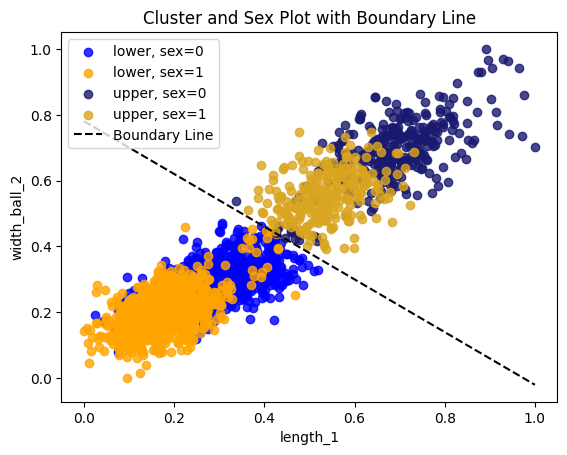

In [75]:
plot_clusters_with_sex(df_test_cluster)

In [76]:
df_lower, df_upper = split_df_on_cluster(df_test_cluster)
df_lower = df_lower.drop('cluster', axis=1)
df_upper = df_upper.drop('cluster', axis=1)

In [77]:
# Get info
df_lower.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1637 entries, 0 to 2218
Data columns (total 52 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   sex            1637 non-null   int64  
 1   x0             1637 non-null   float64
 2   y0             1637 non-null   float64
 3   x1             1637 non-null   float64
 4   y1             1637 non-null   float64
 5   x2             1637 non-null   float64
 6   y2             1637 non-null   float64
 7   x3             1637 non-null   float64
 8   y3             1637 non-null   float64
 9   x4             1637 non-null   float64
 10  y4             1637 non-null   float64
 11  x5             1637 non-null   float64
 12  y5             1637 non-null   float64
 13  x6             1637 non-null   float64
 14  y6             1637 non-null   float64
 15  x7             1637 non-null   float64
 16  y7             1637 non-null   float64
 17  x8             1637 non-null   float64
 18  y8           

In [78]:
df_upper.info()

<class 'pandas.core.frame.DataFrame'>
Index: 583 entries, 2 to 2219
Data columns (total 52 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   sex            583 non-null    int64  
 1   x0             583 non-null    float64
 2   y0             583 non-null    float64
 3   x1             583 non-null    float64
 4   y1             583 non-null    float64
 5   x2             583 non-null    float64
 6   y2             583 non-null    float64
 7   x3             583 non-null    float64
 8   y3             583 non-null    float64
 9   x4             583 non-null    float64
 10  y4             583 non-null    float64
 11  x5             583 non-null    float64
 12  y5             583 non-null    float64
 13  x6             583 non-null    float64
 14  y6             583 non-null    float64
 15  x7             583 non-null    float64
 16  y7             583 non-null    float64
 17  x8             583 non-null    float64
 18  y8            

## Principal Component Analysis

The large size of the datasets that included all pairwise distances were becoming very computationally expensive to run, as well as causing models to overfit:
- Random Forest having 0.9176 AUC on training data but 0.6599 on testing set.
- SVM having 0.9274 AUC on training data but 0.7128  on testing set.

These results show poor generalization, therefore, Principal Component Analysis (PCA) (Scikit-learn 2024) was applied to the large datasets in an effort to reduce the dimensionality, removing redundant and highly correlating features and hopefully enhance generalization of the models and mitigate overfitting.

PCA was very successful, with the best performing models using this dataset with LightGBM getting 89.95% and SVM reaching 91.35%.

In [79]:
print(f"Number of features in df_train_dna_clean_smote_flip_pairwise_a_stan: {df_train_dna_clean_smote_flip_pairwise_a_stan.shape[1]}")
df_train_dna_clean_smote_flip_pairwise_a_stan.head()

Number of features in df_train_dna_clean_smote_flip_pairwise_a_stan: 195


,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.459753,-1.290497,0.379592,-1.057410,0.454535,-0.974190,0.184588,-1.000425,0.123432,-1.113014,0.031295,-0.906609,-0.087787,-1.076129,-0.256834,-0.768633,-0.081354,-0.701074,0.015622,-0.707765,0.062710,-0.653442,0.130421,-0.833331,-0.055913,-0.906996,0.274848,-0.998950,0.408785,-1.146164,0.623604,-1.139859,0.838486,-1.248754,0.130991,-1.068525,-0.150396,0.196276,-0.038243,-0.155050,0.071171,-0.210019,0.045017,0.027289,0.030995,0.194255,0.047436,0.043496,0.082325,-0.032086,0.022198,-0.182071,0.119694,0.365480,-0.170501,-0.388225,-0.069012,-0.410255,-0.087555,-0.103453,-0.105706,0.031414,-0.129587,-0.137164,-0.193480,-0.367790,-0.423351,-0.801806,-0.100683,-0.702549,-0.752968,-0.205145,-0.584942,-0.132098,-0.149720,-0.145152,-0.006827,-0.177230,-0.185173,-0.274960,-0.392713,-0.421794,-0.697347,-0.004944,-0.707994,-0.037475,-0.562438,-0.097813,-0.138486,-0.150146,-0.018956,-0.195491,-0.177966,-0.312932,-0.474378,-0.551278,-0.797264,-0.042962,0.717294,-0.296167,0.093083,-0.013330,-0.046257,0.094733,-0.072665,0.012610,-0.150970,-0.342488,-0.481579,-0.683676,-0.105671,-1.320282,-0.119755,-0.187187,-0.203425,-0.068526,-0.281352,-0.229942,-0.422293,-0.440742,-0.495141,-0.504962,0.035470,0.233196,0.046585,-0.029356,0.096448,-0.106119,0.017836,-0.426254,-0.469016,-0.596438,-0.636223,-0.458590,-0.225775,-0.331833,-0.269217,-0.636313,-0.144452,-0.110661,-0.077688,-0.204441,-0.112431,-0.083721,-0.264994,-0.414003,-0.150548,-0.057820,-0.053509,0.018941,-0.085324,-0.034109,-0.110646,-0.734868,-0.064878,-0.126415,-0.046044,0.050847,-0.035580,0.018452,-0.128124,0.604538,0.113379,0.208338,0.337909,0.203608,0.242726,0.025722,-0.322782,-0.048369,0.087079,-0.054958,0.025760,-0

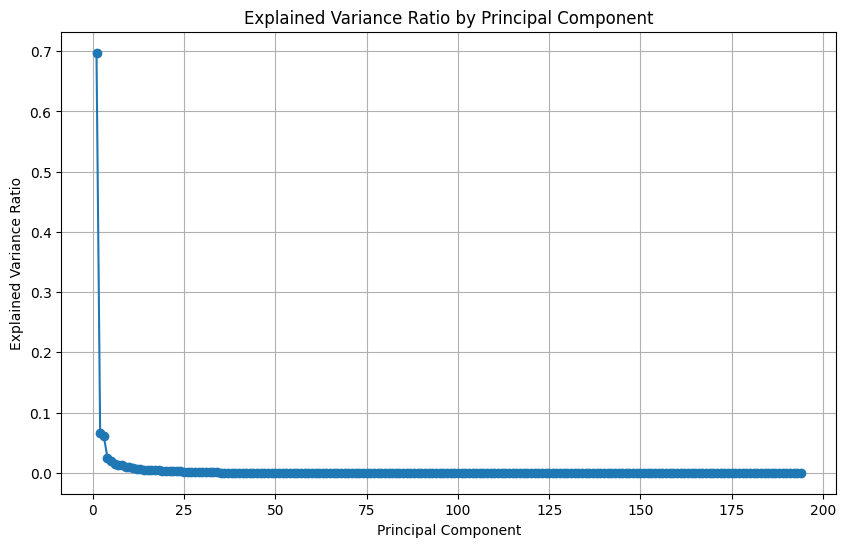

In [80]:
X = df_train_dna_clean_smote_flip_pairwise_a_stan.drop(columns=['sex'])
pca = PCA()
principal_components = pca.fit(X)

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Explained Variance Ratio by Principal Component')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid()
plt.show()

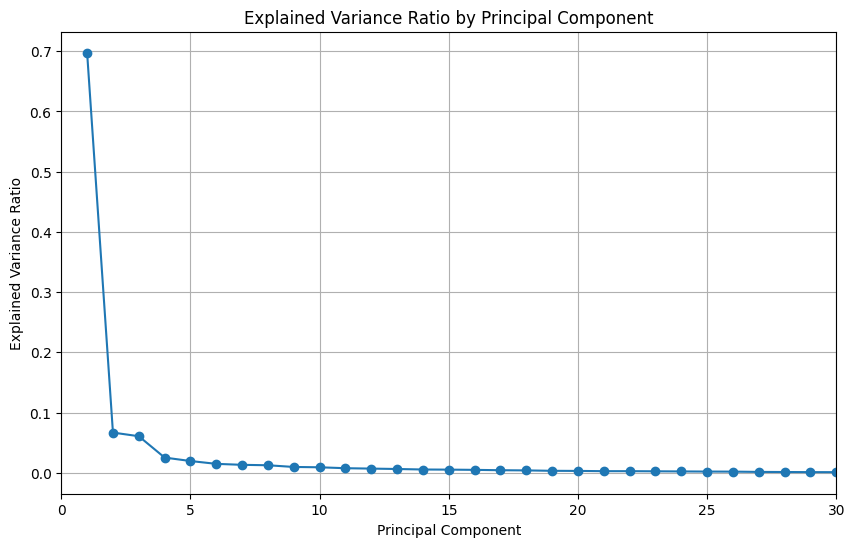

In [81]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Explained Variance Ratio by Principal Component')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.xlim(0, 30)
plt.grid()
plt.show()

In [82]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

num_components = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Number of components to explain 95% variance: {num_components}")

Number of components to explain 95% variance: 14


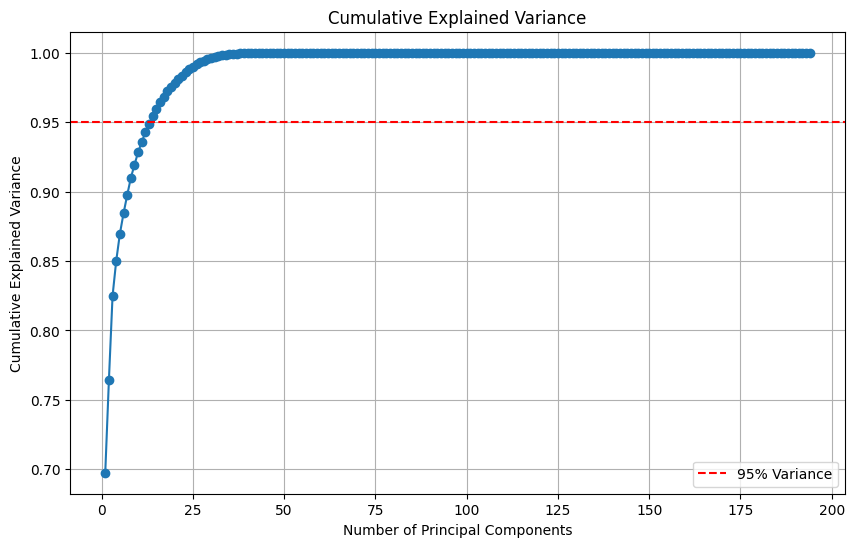

In [83]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.legend()
plt.grid()
plt.show()

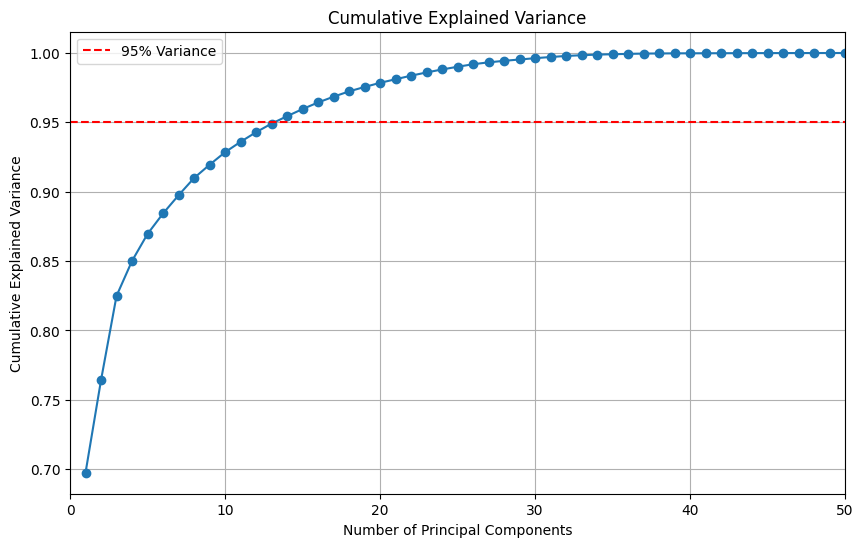

In [84]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Variance')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.xlim(0,50)
plt.legend()
plt.grid()
plt.show()

The choice was made to keep the first 20 components, which together account for approximately 97.5% of the variance from the original dataset. This ensures that as much of the important information form the original dataset is retained while reducing the dimensionality by a large degree.

In [85]:
pca = PCA(n_components=20)

X_train = df_train_dna_clean_smote_flip_pairwise_a_stan.drop(columns=["sex"])
y_train = df_train_dna_clean_smote_flip_pairwise_a_stan["sex"]

X_train_pca = pca.fit_transform(X_train)
print(f"Original shape: {df_train_dna_clean_smote_flip_pairwise_a_stan.shape}")
print(f"Reduced shape: {X_train_pca.shape}")

Original shape: (2220, 195)
Reduced shape: (2220, 20)


In [86]:
df_train_pca = pd.DataFrame(X_train_pca, columns=[f'PC{i+1}' for i in range(20)])
df_train_pca = pd.concat([y_train.reset_index(drop=True), df_train_pca], axis=1)
df_train_pca.head()

,sex,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,0,-2.985137,-2.901741,2.839934,-0.751621,1.337235,-0.280787,-0.955931,0.684818,-0.758042,-0.286198,0.822139,-1.325844,0.697402,1.098152,-0.805683,-1.112182,0.688553,-0.584689,0.127976,-0.240512
1,0,-1.389676,0.864056,0.143649,-1.935430,-0.868228,0.371154,2.468970,1.281791,-0.665985,-0.440408,-0.431066,1.036166,-0.792938,-0.995822,1.129379,-0.402935,-0.255606,0.735679,-1.109332,-0.281133
2,1,9.727887,-0.230610,-5.929157,-0.807700,-1.875507,1.625910,0.908772,-0.043357,0.041479,1.525511,1.485789,1.159237,1.389824,-1.043943,0.747059,-1.129884,1.063768,-0.047151,-1.050052,0.824950
3,1,-12.713252,-3.051907,-2.645804,-0.396858,0.276735,-0.133610,-1.505604,1.774750,-0.464814,-1.467537,0.987300,-0.559309,-0.740856,-0.697750,-0.703976,-0.795380,0.089910,0.103452,0.586796,-0.069743
4,1,-8.910948,3.375963,-4.878637,-4.307527,1.980991,0.128265,1.427646,-1.981840,-1.173207,-0.639182,-0.822295,-1.585581,-0.544057,0.391606,-0.389644,0.358409,-0.076615,1.015993,-1.341611,0.993892


In [87]:
df_train_pca_norm = df_train_pca.copy()
scaler = MinMaxScaler()
columns_to_normalize = df_train_pca_norm.columns.difference(['sex'])
df_train_pca_norm[columns_to_normalize] = scaler.fit_transform(df_train_pca_norm[columns_to_normalize])
df_train_pca_norm.head()

,sex,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,0,0.267742,0.308002,0.586781,0.342338,0.626130,0.487584,0.445401,0.573061,0.381395,0.554115,0.615947,0.332193,0.614233,0.430357,0.355593,0.266841,0.588944,0.450006,0.596366,0.478448
1,0,0.295041,0.445976,0.504783,0.271971,0.470546,0.537077,0.727179,0.620407,0.390627,0.542032,0.470709,0.593742,0.433687,0.226668,0.597877,0.357866,0.465884,0.652375,0.403926,0.471866
2,1,0.485265,0.405869,0.320100,0.339005,0.399487,0.632333,0.598817,0.515309,0.461577,0.696068,0.692860,0.607370,0.698116,0.221987,0.550008,0.264570,0.637848,0.532393,0.413146,0.651101
3,1,0.101292,0.302500,0.419952,0.363426,0.551317,0.498758,0.400178,0.659503,0.410802,0.461553,0.635088,0.417073,0.439996,0.255663,0.368327,0.307500,0.510918,0.555475,0.667727,0.506120
4,1,0.166351,0.538010,0.352048,0.130971,0.671544,0.518638,0.641506,0.361568,0.339760,0.526458,0.425368,0.303432,0.463837,0.361629,0.407684,0.455577,0.489214,0.695337,0.367799,0.678477


## Final list of dataframes

A record is kept of all dataframes for reference, this was iteratively added to throught the project as new data was generated.

In [88]:
dataframes = [df_train_dna,
              
              df_train_dna_smote,
              df_train_dna_clean_smote_lw_a_norm,
              df_train_dna_clean_smote_flip_lw_a_norm,
              df_train_dna_clean_smote_flip_pairwise_a_norm,
              df_train_dna_clean_smote_flip_pairwise_a_stan,
              df_train_dna_clean_smote_flip_pairwise_a_norm_shrunk,

              df_train_pca,
              df_train_pca_norm,
              
              df_train_kna,
              df_train_kna_smote,
              df_train_kna_clean_smote_flip_lw_a_norm,

              df_lower,
              df_upper,
              
              df_train_dna_lw,
              df_train_dna_lw_clean,
              df_train_dna_lw_a,
              df_train_dna_lw_a_clean,
              df_train_dna_lw_a_clean_norm,
              df_train_dna_lw_a_clean_stan,
              
              df_train_dna_flip,
              df_train_dna_flip_lw,
              df_train_dna_flip_lw_clean,
              df_train_dna_flip_lw_clean_norm,
              df_train_dna_flip_lw_clean_stan,
              df_train_dna_flip_lw_a,
              df_train_dna_flip_lw_a_clean,
              df_train_dna_flip_lw_a_clean_norm,
              df_train_dna_flip_lw_a_clean_stan,

              df_train_dna_pairwise,
              df_train_dna_pairwise_clean,
              df_train_dna_pairwise_a_clean_shrunk,
              df_train_dna_pairwise_a_clean_shrunk_norm,
              df_train_dna_pairwise_a_clean_shrunk_stan,
              
              df_train_dna_pairwise_a,
              df_train_dna_pairwise_a_clean,
              df_train_dna_pairwise_a_clean_norm,
              df_train_dna_pairwise_a_clean_stan,
              
              df_train_dna_lw_a_clean_shrunk,
              df_train_dna_lw_a_clean_shrunk_norm,
              df_train_dna_lw_a_clean_shrunk_stan
              ]

### Visualise Dataframe Processing

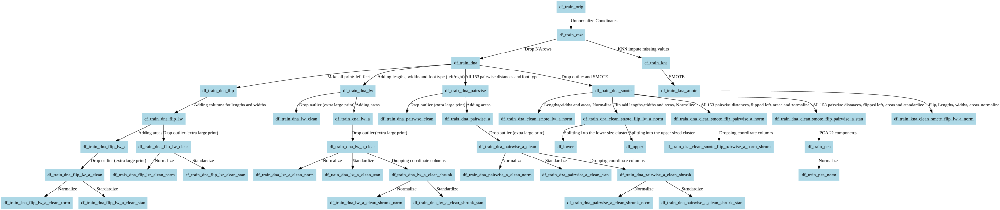

In [89]:
dot_code = """
digraph DataFlow {
    rankdir=TB;
    node [shape=box, style=filled, color=lightblue];

    // Define initial dataframe
    df_train_orig [label="df_train_orig"]
    df_train_orig -> df_train_raw [label="Unnormalize Coordinates"]
    df_train_raw -> df_train_dna [label="Drop NA rows"]
    
    // Flip path
    df_train_dna -> df_train_dna_flip [label="Make all prints left feet"]
    df_train_dna_flip -> df_train_dna_flip_lw [label="Adding columns for lengths and widths"]
    df_train_dna_flip_lw -> df_train_dna_flip_lw_a [label="Adding areas"]
    df_train_dna_flip_lw_a -> df_train_dna_flip_lw_a_clean [label="Drop outlier (extra large print)"]
    df_train_dna_flip_lw_a_clean -> df_train_dna_flip_lw_a_clean_norm [label="Normalize"]
    df_train_dna_flip_lw_a_clean -> df_train_dna_flip_lw_a_clean_stan [label="Standardize"]

    df_train_dna_flip_lw -> df_train_dna_flip_lw_clean [label="Drop outlier (extra large print)"]
    df_train_dna_flip_lw_clean -> df_train_dna_flip_lw_clean_norm [label="Normalize"]
    df_train_dna_flip_lw_clean -> df_train_dna_flip_lw_clean_stan [label="Standardize"]

    // Non-flipped path
    df_train_dna -> df_train_dna_lw [label="Adding lengths, widths and foot type (left/right)"]
    df_train_dna_lw -> df_train_dna_lw_clean [label="Drop outlier (extra large print)"]

    df_train_dna_lw -> df_train_dna_lw_a [label="Adding areas"]
    df_train_dna_lw_a -> df_train_dna_lw_a_clean [label="Drop outlier (extra large print)"]
    df_train_dna_lw_a_clean -> df_train_dna_lw_a_clean_norm [label="Normalize"]
    df_train_dna_lw_a_clean -> df_train_dna_lw_a_clean_stan [label="Standardize"]

    df_train_dna_lw_a_clean -> df_train_dna_lw_a_clean_shrunk [label="Dropping coordinate columns"]
    df_train_dna_lw_a_clean_shrunk -> df_train_dna_lw_a_clean_shrunk_norm [label="Normalize"]
    df_train_dna_lw_a_clean_shrunk -> df_train_dna_lw_a_clean_shrunk_stan [label="Standardize"]

    // Pairwise path
    df_train_dna -> df_train_dna_pairwise [label="All 153 pairwise distances and foot type"]
    df_train_dna_pairwise -> df_train_dna_pairwise_clean [label="Drop outlier (extra large print)"]
    df_train_dna_pairwise -> df_train_dna_pairwise_a [label="Adding areas"]
    df_train_dna_pairwise_a -> df_train_dna_pairwise_a_clean [label="Drop outlier (extra large print)"]
    df_train_dna_pairwise_a_clean -> df_train_dna_pairwise_a_clean_norm [label="Normalize"]
    df_train_dna_pairwise_a_clean -> df_train_dna_pairwise_a_clean_stan [label="Standardize"]
    df_train_dna_pairwise_a_clean -> df_train_dna_pairwise_a_clean_shrunk [label="Dropping coordinate columns"]
    df_train_dna_pairwise_a_clean_shrunk -> df_train_dna_pairwise_a_clean_shrunk_norm [label="Normalize"]
    df_train_dna_pairwise_a_clean_shrunk -> df_train_dna_pairwise_a_clean_shrunk_stan [label="Standardize"]

    // SMOTE Path
    df_train_dna -> df_train_dna_smote [label="Drop outlier and SMOTE"]
    df_train_dna_smote -> df_train_dna_clean_smote_lw_a_norm [label="Lengths,widths and areas, Normalize"]
    df_train_dna_smote -> df_train_dna_clean_smote_flip_lw_a_norm [label="Flip add lengths,widths and areas, Normalize"]
    df_train_dna_smote -> df_train_dna_clean_smote_flip_pairwise_a_norm [label="All 153 pairwise distances, flipped left, areas and normalize"]
    df_train_dna_smote -> df_train_dna_clean_smote_flip_pairwise_a_stan [label="All 153 pairwise distances, flipped left, areas and standardize"]
    df_train_dna_clean_smote_flip_pairwise_a_norm -> df_train_dna_clean_smote_flip_pairwise_a_norm_shrunk [label="Dropping coordinate columns"]
    df_train_dna_clean_smote_flip_lw_a_norm -> df_lower [label="Splitting into the lower size cluster"]
    df_train_dna_clean_smote_flip_lw_a_norm -> df_upper [label="Splitting into the upper sized cluster"]

    df_train_raw -> df_train_kna [label="KNN impute missing values"]
    df_train_kna -> df_train_kna_smote [label="SMOTE"]
    df_train_kna_smote -> df_train_kna_clean_smote_flip_lw_a_norm [label="Flip, Lengths, widths, areas, normalize"]

    df_train_dna_clean_smote_flip_pairwise_a_stan -> df_train_pca [label="PCA 20 components"]
    df_train_pca -> df_train_pca_norm [label="Normalize"]
}
"""

# Render the Dot code
Source(dot_code, format="png")


## Cross Validating on Training Set

### Helper Function

In [90]:
def get_var_name(variable):
    frame = inspect.currentframe().f_back
    variables = {k: v for k, v in frame.f_globals.items() if v is variable}
    variables.update({k: v for k, v in frame.f_locals.items() if v is variable})
    for name in variables:
        return name
    return None

df_name = get_var_name(df_train_orig)
print(df_name)

df_train_orig


The following function was used to speed up evaluation on the training set. The function takes in a dataframe, model and parameter list and runs 5 fold cross validation, returning a series of the evaluation metrics.

In [91]:
def cross_validate(df, model, model_params, n_splits = 5):
    X = df.drop(['sex'], axis=1)
    y = df[['sex']]

    dataframe_name = get_var_name(df)
    model_name = model.__class__.__name__

    # StratifiedKFold to maintain class balance in each split
    k_fold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=0)
    
    accuracy_scores = []
    auc_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    cumulative_confusion_matrix = np.zeros((2, 2))

    for train_index, test_index in k_fold.split(X, y):
        # Prep data
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        # Train model
        model.fit(X_train, y_train.squeeze())
        # Make predictions
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        # Evaluate predictions
        accuracy = metrics.accuracy_score(y_test, y_pred)
        auc = metrics.roc_auc_score(y_test, y_pred_proba)
        precision = metrics.precision_score(y_test, y_pred)
        recall = metrics.recall_score(y_test, y_pred)
        f1 = metrics.f1_score(y_test, y_pred)
        
        accuracy_scores.append(accuracy)
        auc_scores.append(auc)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)
        fold_confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
        cumulative_confusion_matrix += fold_confusion_matrix

    evaluation_series = pd.Series({
        "dataframe": dataframe_name,
        "model": model_name,
        "params": model_params,
        "mean_accuracy": round(float(np.mean(accuracy_scores)), 4),
        "mean_AUC": round(float(np.mean(auc_scores)), 4),
        "mean_precision": round(float(np.mean(precision_scores)), 4),
        "mean_recall": round(float(np.mean(recall_scores)), 4),
        "mean_f1": round(float(np.mean(f1_scores)), 4),
        "sex_0_misclassified": round(float((cumulative_confusion_matrix[0].sum() - cumulative_confusion_matrix[0, 0]) / cumulative_confusion_matrix[0].sum()), 4),
        "sex_1_misclassified": round(float((cumulative_confusion_matrix[1].sum() - cumulative_confusion_matrix[1, 1]) / cumulative_confusion_matrix[1].sum()), 4)
    })

    return evaluation_series

### Logistic Regression

Logistic Regression (Scikit-learn 2024) was selected due to its ease of interpreting, simplicity to implement, and being fast to train.

The first model that was built used the minimally processed dataset *df_train_dna* using Logistic Regression (LR) achieving 77.52% CV score on training set and 69.66% public kaggle score on test set. This served as a baseline to assess the performance of subsequent models.

LR had the best performance on the simpler datafames but the performance capped out at around 83.45% AUC on the training set and 78.42% on test set, this was much less than the other models and so was dropped in favour of the more powerful models early on in the project.

In [92]:
lr_params = {"max_iter":100}

lr = LogisticRegression(**lr_params)
lr_eval = cross_validate(df_train_dna_clean_smote_flip_lw_a_norm, lr, lr_params)
print(lr_eval)

dataframe              df_train_dna_clean_smote_flip_lw_a_norm
model                                       LogisticRegression
params                                       {'max_iter': 100}
mean_accuracy                                           0.7374
mean_AUC                                                0.7975
mean_precision                                          0.7269
mean_recall                                             0.7622
mean_f1                                                 0.7439
sex_0_misclassified                                     0.2874
sex_1_misclassified                                     0.2378
dtype: object


### Decision Tree

Decision Tree (Scikit-learn 2024) was selected, again, due to its interpretability, simplicity to implement and computational efficiency.

Decision Tree was similar to LR in that it performed better on the smaller dataframes, but it capped out 79.86% AUC on training set and 77.54% on the testing set. Therefore, later on the more powerful models were favoured.

In [93]:
dt_params = {"random_state": 1}

decision_tree = tree.DecisionTreeClassifier(**dt_params)
decision_tree_eval = cross_validate(df_train_pca, decision_tree, dt_params)
print(decision_tree_eval)

dataframe                        df_train_pca
model                  DecisionTreeClassifier
params                    {'random_state': 1}
mean_accuracy                          0.7883
mean_AUC                               0.7883
mean_precision                          0.799
mean_recall                            0.7703
mean_f1                                0.7843
sex_0_misclassified                    0.1937
sex_1_misclassified                    0.2297
dtype: object


### Multi-Layer Perceptron

Multi-Layer Perceptron (MLP) (Scikit-learn 2024) was chosen as it is effective at modelling complex non-linear relationships that are difficult for the simpler models such as DT and LR to handle.

MLP was one of the best performing models, with the highest scores being 93.13% AUC and 91.35% on the training set and testing set respectively.
It did appear to be overfitting on some datasets early on, this led to the choice to apply SMOTE, increasing the AUC of MLP from 81.33% to 91.35%.
Grid search (Scikit-learn 2024) was also run to further optimize hyper-parameters, but the improvement was minimal at only +0.28% on the training set and considering the compute time to run these, it wasn't feasible to do it often.

In [94]:
mlp_params = {'activation': 'relu','alpha': 0.01,'hidden_layer_sizes': (50, 50),'learning_rate': 'adaptive','solver': 'adam','max_iter': 400}

mlp = MLPClassifier(**mlp_params)
mlp_eval = cross_validate(df_train_dna_clean_smote_flip_lw_a_norm, mlp, mlp_params)
print(mlp_eval)

dataframe                        df_train_dna_clean_smote_flip_lw_a_norm
model                                                      MLPClassifier
params                 {'activation': 'relu', 'alpha': 0.01, 'hidden_...
mean_accuracy                                                     0.8676
mean_AUC                                                          0.9297
mean_precision                                                    0.8652
mean_recall                                                       0.8721
mean_f1                                                           0.8682
sex_0_misclassified                                               0.1369
sex_1_misclassified                                               0.1279
dtype: object


In [95]:
mlp_params = {
    'activation': 'relu',
    'alpha': 0.01,
    'hidden_layer_sizes': (50, 50),
    'learning_rate': 'adaptive',
    'solver': 'adam',
    'max_iter': 400
}

mlp = MLPClassifier(**mlp_params)
mlp_eval = cross_validate(df_train_kna_clean_smote_flip_lw_a_norm, mlp, mlp_params)
print(mlp_eval)

dataframe                        df_train_kna_clean_smote_flip_lw_a_norm
model                                                      MLPClassifier
params                 {'activation': 'relu', 'alpha': 0.01, 'hidden_...
mean_accuracy                                                      0.855
mean_AUC                                                          0.9277
mean_precision                                                    0.8358
mean_recall                                                       0.8845
mean_f1                                                           0.8593
sex_0_misclassified                                               0.1746
sex_1_misclassified                                               0.1155
dtype: object


#### Grid Search Parameters

**Commented Out**

In [96]:
param_grid = {
    "hidden_layer_sizes": [(100, 20), (100, 50), (50, 50, 20)],
    "activation": ["relu", "tanh"],
    "alpha": [0.0001, 0.001, 0.01],
    "solver": ["adam", "sgd"],
    "learning_rate": ["constant", "adaptive"]
}

X = df_train_dna_clean_smote_flip_pairwise_a_norm.drop(['sex'], axis=1)
y = df_train_dna_clean_smote_flip_pairwise_a_norm['sex']

# mlp = MLPClassifier()

# grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid, scoring="accuracy", cv=5, n_jobs=-1, verbose=2)

# Fit the grid search to your training data
# grid_search.fit(X, y)  # Assuming y_train is the target variable for training data

# print("Best parameters found:", grid_search.best_params_)
# print("Best cross-validation score:", grid_search.best_score_)

#### Upper/Lower Cluster

In [ ]:
mlp_upper_params = {
    'activation': 'tanh',
    'alpha': 0.01,
    'hidden_layer_sizes': (50, 50),
    'learning_rate': 'adaptive',
    'solver': 'adam',
    'max_iter': 400
}
mlp_lower_params = {
    'activation': 'tanh',
    'alpha': 0.01,
    'hidden_layer_sizes': (50, 50),
    'learning_rate': 'adaptive',
    'solver': 'adam',
    'max_iter': 400
}

mlp_upper = MLPClassifier(**mlp_params)
mlp_upper_eval = cross_validate(df_upper, mlp_upper, mlp_params)
print(f"Evaluation for Upper cluster:\n{mlp_upper_eval}")

mlp_lower = MLPClassifier(**mlp_params)
mlp_lower_eval = cross_validate(df_lower, mlp_lower, mlp_params)
print(f"Evaluation for Lower cluster:\n{mlp_lower_eval}")

c:\Users\jacob\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.
  warnings.warn(


Evaluation for Upper cluster:
dataframe                                                 df_upper
model                                                MLPClassifier
params           {'activation': 'tanh', 'alpha': 0.01, 'hidden_...
mean_accuracy                                               0.8473
mean_AUC                                                    0.9311
dtype: object
Evaluation for Lower cluster:
dataframe                                                 df_lower
model                                                MLPClassifier
params           {'activation': 'tanh', 'alpha': 0.01, 'hidden_...
mean_accuracy                                               0.8485
mean_AUC                                                     0.923
dtype: object


### Support Vector Machine

Support Vector Machine (SVM) was chosen as it can work well with smaller datasets and is more effective at modelling complex, non-linear relationships in data.

Using scikit-learn's (2024) Support Vector Classification (SVC) this was another one of the best performing models. Early on it was getting 90.02% AUC on training set without any hyper-parameter tuning. After rounds of grid searches to find the best hyper-parameters and building better datasets, this was bumped up to 92.45% and 91.35% AUC respectively, on the PCA datasets.
It performed worse on the datasets with all pairwise distances and better on the smaller datasets that had been normalized.

In [ ]:
svm_params = {
    'C': 10,
    'class_weight': None,
    'degree': 2,
    'gamma': 'scale',
    'kernel': 'rbf',
    'probability': True
}

svm_model = svm.SVC(**svm_params)
svm_eval = cross_validate(df_train_pca, svm_model, svm_params)
print(svm_eval)

dataframe                                                   df_train_pca
model                                                                SVC
params                 {'C': 10, 'class_weight': None, 'degree': 2, '...
mean_accuracy                                                     0.8653
mean_AUC                                                          0.9245
mean_precision                                                     0.864
mean_recall                                                       0.8676
mean_f1                                                           0.8657
sex_0_misclassified                                               0.1369
sex_1_misclassified                                               0.1324
dtype: object


In [ ]:
svm_params = {
    'C': 10,
    'class_weight': None,
    'degree': 2,
    'gamma': 'scale',
    'kernel': 'rbf',
    'probability': True
}

svm_model = svm.SVC(**svm_params)
svm_eval = cross_validate(df_train_kna_clean_smote_flip_lw_a_norm, svm_model, svm_params)
print(svm_eval)

dataframe                        df_train_kna_clean_smote_flip_lw_a_norm
model                                                                SVC
params                 {'C': 10, 'class_weight': None, 'degree': 2, '...
mean_accuracy                                                     0.8662
mean_AUC                                                          0.9334
mean_precision                                                    0.8623
mean_recall                                                        0.872
mean_f1                                                           0.8669
sex_0_misclassified                                               0.1397
sex_1_misclassified                                                0.128
dtype: object


#### Grid Search Parameters

**Commented Out**

In [ ]:
param_grid = {
    "C": [10, 15, 20, 25, 30, 35, 40],
    "kernel": ["rbf"],
    "gamma": ["scale", "auto"],
    "class_weight": ["balanced", None]
}

# svm_model = svm.SVC()

X = df_train_dna_clean_smote_flip_lw_a_norm.drop(['sex'], axis=1)
y = df_train_dna_clean_smote_flip_lw_a_norm['sex']

# grid_search = GridSearchCV(estimator=svm_model, param_grid=param_grid, scoring="roc_auc", cv=5, n_jobs=-1, verbose=3)

# grid_search.fit(X, y)

# results = pd.DataFrame(grid_search.cv_results_)
# sorted_results = results.sort_values(by='mean_test_score', ascending=False)

# top_10 = sorted_results[['mean_test_score', 'params']].head(10)
# print(top_10)

Fitting 5 folds for each of 28 candidates, totalling 140 fits
    mean_test_score                                             params
6          0.935289  {'C': 15, 'class_weight': None, 'gamma': 'scal...
4          0.935289  {'C': 15, 'class_weight': 'balanced', 'gamma':...
8          0.934944  {'C': 20, 'class_weight': 'balanced', 'gamma':...
10         0.934944  {'C': 20, 'class_weight': None, 'gamma': 'scal...
2          0.934535  {'C': 10, 'class_weight': None, 'gamma': 'scal...
0          0.934535  {'C': 10, 'class_weight': 'balanced', 'gamma':...
14         0.934360  {'C': 25, 'class_weight': None, 'gamma': 'scal...
12         0.934360  {'C': 25, 'class_weight': 'balanced', 'gamma':...
16         0.933585  {'C': 30, 'class_weight': 'balanced', 'gamma':...
18         0.933585  {'C': 30, 'class_weight': None, 'gamma': 'scal...


In [ ]:
#for i, row in sorted_results.iterrows():
#    print(f"Rank {i+1}")
#    print("Parameters:", row["params"])
#    print("Mean cross-validation score:", row["mean_test_score"])
#    print("Standard deviation:", row["std_test_score"])
#    print("-" * 30)

Rank 7
Parameters: {'C': 15, 'class_weight': None, 'gamma': 'scale', 'kernel': 'rbf'}
Mean cross-validation score: 0.9352893433974515
Standard deviation: 0.0162448282880451
------------------------------
Rank 5
Parameters: {'C': 15, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}
Mean cross-validation score: 0.9352893433974515
Standard deviation: 0.0162448282880451
------------------------------
Rank 9
Parameters: {'C': 20, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}
Mean cross-validation score: 0.9349444038633228
Standard deviation: 0.017007075071363426
------------------------------
Rank 11
Parameters: {'C': 20, 'class_weight': None, 'gamma': 'scale', 'kernel': 'rbf'}
Mean cross-validation score: 0.9349444038633228
Standard deviation: 0.017007075071363426
------------------------------
Rank 3
Parameters: {'C': 10, 'class_weight': None, 'gamma': 'scale', 'kernel': 'rbf'}
Mean cross-validation score: 0.9345345345345345
Standard deviation: 0.01529519971

### KNearest Neighbor Classifier

KNearest Neighbor Classifier (KNN) (Scikit-learn 2024) was chosen due to being effective on small datasets as well as being another model that is easily interpretable.

Capped out at 89.29% on training set and as there were other models at the time outperforming, it was used less. But there could have been hyper-parameter tuning done to improve the scores as its best being 89.29% is still quite high up on the leaderboard.

In [ ]:
knn_params = {
    "n_neighbors": 3,
    "metric": 'euclidean'
}

knn = KNeighborsClassifier(**knn_params)
knn_eval = cross_validate(df_train_dna_clean_smote_flip_lw_a_norm, knn, knn_params)
print(knn_eval)

dataframe                df_train_dna_clean_smote_flip_lw_a_norm
model                                       KNeighborsClassifier
params                 {'n_neighbors': 3, 'metric': 'euclidean'}
mean_accuracy                                             0.8297
mean_AUC                                                  0.8822
mean_precision                                            0.8487
mean_recall                                               0.8027
mean_f1                                                   0.8248
sex_0_misclassified                                       0.1432
sex_1_misclassified                                       0.1973
dtype: object


### Naive Bayes

Naive Bayes was used as these algorithms are simple to use and implement, can work well with smaller datasets and are easily interpretable.

Three different implementations of Naive Bayes were used from the Scikit-learn (2024) library, being Multinomial, Complement and Gaussian. They however were some of the worst performing models, not reaching higher than 76% on the training set and therefore were dropped early on for the better performing models.

#### Multinomial Naive Bayes

In [ ]:
mnb_params = {
    "fit_prior": True
}

mnb = MultinomialNB(**mnb_params)
mnb_eval = cross_validate(df_train_dna_clean_smote_flip_lw_a_norm, mnb, mnb_params)
print(mnb_eval)

dataframe              df_train_dna_clean_smote_flip_lw_a_norm
model                                            MultinomialNB
params                                     {'fit_prior': True}
mean_accuracy                                            0.673
mean_AUC                                                0.7399
mean_precision                                          0.6548
mean_recall                                             0.7342
mean_f1                                                 0.6921
sex_0_misclassified                                     0.3883
sex_1_misclassified                                     0.2658
dtype: object


#### Complement Naive Bayes

In [ ]:
cnb_params = {
    "fit_prior": True
}

cnb = ComplementNB(**cnb_params)
cnb_eval = cross_validate(df_train_dna_clean_smote_flip_lw_a_norm, cnb, cnb_params)
print(cnb_eval)

dataframe              df_train_dna_clean_smote_flip_lw_a_norm
model                                             ComplementNB
params                                     {'fit_prior': True}
mean_accuracy                                            0.673
mean_AUC                                                0.7399
mean_precision                                          0.6548
mean_recall                                             0.7342
mean_f1                                                 0.6921
sex_0_misclassified                                     0.3883
sex_1_misclassified                                     0.2658
dtype: object


#### Gaussian Naive Bayes

In [ ]:
gnb_params = {

}

gnb = GaussianNB(**gnb_params)
gnb_eval = cross_validate(df_train_dna_clean_smote_flip_lw_a_norm, gnb, gnb_params)
print(gnb_eval)

dataframe              df_train_dna_clean_smote_flip_lw_a_norm
model                                               GaussianNB
params                                                      {}
mean_accuracy                                           0.6014
mean_AUC                                                0.7496
mean_precision                                          0.5768
mean_recall                                             0.7694
mean_f1                                                 0.6591
sex_0_misclassified                                     0.5667
sex_1_misclassified                                     0.2306
dtype: object


### Bagging

Bagging models were used as they can reduce overfitting that was encountered in the weaker models, allowing them to be better at generalizing. They also work well with small datasets.

#### Random Forest

Random Forest (Scikit-learn 2024) was one of the best models on the training set but was less generalizable when evaluating on the test data. Despite tuning hyper-parameters and using a combination of different datasets, the best AUC that could be achieved form the test data was 86.37%.

In [ ]:
rf_params = {
    'bootstrap': False,
    'max_depth': 20,
    'max_features': 'sqrt',
    'min_samples_leaf': 2,
    'min_samples_split': 10,
    'n_estimators': 300
}

random_forest = RandomForestClassifier(**rf_params)
random_forest_eval = cross_validate(df_train_pca_norm, random_forest, rf_params)
print(random_forest_eval)

dataframe                                              df_train_pca_norm
model                                             RandomForestClassifier
params                 {'bootstrap': False, 'max_depth': 20, 'max_fea...
mean_accuracy                                                      0.841
mean_AUC                                                          0.9137
mean_precision                                                    0.8584
mean_recall                                                       0.8171
mean_f1                                                           0.8371
sex_0_misclassified                                               0.1351
sex_1_misclassified                                               0.1829
dtype: object


In [ ]:
rf_params = {
    'bootstrap': False,
    'max_depth': 20,
    'max_features': 'sqrt',
    'min_samples_leaf': 2,
    'min_samples_split': 10,
    'n_estimators': 300
}

random_forest = RandomForestClassifier(**rf_params)
random_forest_eval = cross_validate(df_train_dna_clean_smote_flip_pairwise_a_norm, random_forest, rf_params)
print(random_forest_eval)

dataframe                       df_train_dna_clean_smote_pairwise_a_norm
model                                             RandomForestClassifier
params                 {'bootstrap': False, 'max_depth': 20, 'max_fea...
mean_accuracy                                                     0.8685
mean_AUC                                                          0.9389
mean_precision                                                    0.8618
mean_recall                                                       0.8784
mean_f1                                                           0.8696
sex_0_misclassified                                               0.1414
sex_1_misclassified                                               0.1216
dtype: object


#### Grid Search Parameters

In [ ]:
param_grid = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 10, 20, 30],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "max_features": [None , "sqrt", "log2"],
    "bootstrap": [True, False]
}

# random_forest = RandomForestClassifier()

X = df_train_dna_flip_lw_a_clean_norm.drop(['sex'], axis=1)
y = df_train_dna_flip_lw_a_clean_norm['sex']

# grid_search = GridSearchCV(estimator=random_forest, param_grid=param_grid, scoring="accuracy", cv=5, n_jobs=-1, verbose=2)

# print("Best parameters found:", grid_search.best_params_)
# print("Best cross-validation score:", grid_search.best_score_)

Fitting 5 folds for each of 648 candidates, totalling 3240 fits
Best parameters found: {'bootstrap': False, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 300}
Best cross-validation score: 0.8622636948833422


In [ ]:
# results = pd.DataFrame(grid_search.cv_results_)

# top_results = results.sort_values(by="mean_test_score", ascending=False).head(5)

#for i, row in top_results.iterrows():
#    print(f"Rank {i+1}")
#    print("Parameters:", row["params"])
#    print("Mean cross-validation score:", row["mean_test_score"])
#    print("Standard deviation:", row["std_test_score"])
#    print("-" * 30)

Rank 531
Parameters: {'bootstrap': False, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 300}
Mean cross-validation score: 0.8622636948833422
Standard deviation: 0.009999088116987418
------------------------------
Rank 612
Parameters: {'bootstrap': False, 'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 300}
Mean cross-validation score: 0.8617573722107726
Standard deviation: 0.012077421085642115
------------------------------
Rank 447
Parameters: {'bootstrap': False, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
Mean cross-validation score: 0.8617548278757348
Standard deviation: 0.013308060687358937
------------------------------
Rank 618
Parameters: {'bootstrap': False, 'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
Mean cross-validation score: 0.861

In [ ]:
param_grid = {
    "n_estimators": [100, 200, 300],
    "max_depth": [None, 10, 20, 30],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "max_features": ["sqrt"],
    "bootstrap": [False]
}

# random_forest = RandomForestClassifier()

X = df_train_dna_flip_lw_a_clean_norm.drop(['sex'], axis=1)
y = df_train_dna_flip_lw_a_clean_norm['sex']

# grid_search = GridSearchCV(estimator=random_forest, param_grid=param_grid, scoring="accuracy", cv=5, n_jobs=-1, verbose=2)

# print("Best parameters found:", grid_search.best_params_)
# print("Best cross-validation score:", grid_search.best_score_)

#### SVM BaggingClassifier

Based on the success of the SVM, a bagging classifier (Scikit-learn 2024) of SVM's was experimented with. It was another high performer, achieving up to 93.36% on the training set but was less generalizable, getting only 89.19% on the test data, despite experimenting with many different hyper-parameters.

##### SVM

In [ ]:
# From Grid Search
svm_params = {
    'C': 15,
    'class_weight': None,
    'gamma': 'scale',
    'kernel': 'rbf',
    'probability': True
}

base_svm = svm.SVC(**svm_params)

bagging_svm_params = {
    "estimator":base_svm,
    "n_estimators":10,
    "max_samples":1.0,
    "max_features":1.0,
    "bootstrap":False,
    "n_jobs":-1,
    "random_state":1
}

bagging_svm = BaggingClassifier(**bagging_svm_params)
bagging_svm_eval = cross_validate(df_train_kna_clean_smote_flip_lw_a_norm, bagging_svm, bagging_svm_params)
print(bagging_svm_eval)

dataframe                        df_train_kna_clean_smote_flip_lw_a_norm
model                                                  BaggingClassifier
params                 {'estimator': SVC(C=15, probability=True), 'n_...
mean_accuracy                                                     0.8675
mean_AUC                                                          0.9343
mean_precision                                                    0.8626
mean_recall                                                       0.8747
mean_f1                                                           0.8684
sex_0_misclassified                                               0.1397
sex_1_misclassified                                               0.1253
dtype: object


In [ ]:
# From Grid Search
svm_params = {
    'C': 15,
    'class_weight': None,
    'gamma': 'scale',
    'kernel': 'rbf',
    'probability': True
}

base_svm = svm.SVC(**svm_params)

# From Grid Search
bagging_svm_params = {
    "estimator":base_svm,
    "n_estimators":10,
    "max_samples":1.0,
    "max_features":1.0,
    "bootstrap":False,
    "n_jobs":-1,
    "random_state":1
}

bagging_svm = BaggingClassifier(**bagging_svm_params)
bagging_svm_eval = cross_validate(df_train_dna_clean_smote_flip_lw_a_norm, bagging_svm, bagging_svm_params)
print(bagging_svm_eval)

dataframe                        df_train_dna_clean_smote_flip_lw_a_norm
model                                                  BaggingClassifier
params                 {'estimator': SVC(C=15, probability=True), 'n_...
mean_accuracy                                                     0.8748
mean_AUC                                                          0.9336
mean_precision                                                    0.8764
mean_recall                                                        0.873
mean_f1                                                           0.8744
sex_0_misclassified                                               0.1234
sex_1_misclassified                                                0.127
dtype: object


##### Grid Search Parameters

In [ ]:
bagging_param_grid = {
    'n_estimators': [10, 20, 50, 100],
    'max_samples': [0.5, 0.8, 1.0],
    'max_features': [0.5, 0.8, 1.0],
    'bootstrap': [True, False],
}

X = df_train_dna_clean_smote_flip_lw_a_norm.drop(['sex'], axis=1)
y = df_train_dna_clean_smote_flip_lw_a_norm['sex']

base_svm = svm.SVC(
    C=15,
    class_weight=None,
    gamma='scale',
    kernel='rbf',
    probability=True
)

# bagging_svm = BaggingClassifier(estimator=base_svm, random_state=1)

#grid_search = GridSearchCV(
#    estimator=bagging_svm,
#    param_grid=bagging_param_grid,
#    scoring='roc_auc',
#    cv=5,
#    n_jobs=-1,
#    verbose=3
#)

# grid_search.fit(X, y)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


GridSearchCV(cv=5,
             estimator=BaggingClassifier(estimator=SVC(C=15, probability=True),
                                         random_state=1),
             n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'max_features': [0.5, 0.8, 1.0],
                         'max_samples': [0.5, 0.8, 1.0],
                         'n_estimators': [10, 20, 50, 100]},
             scoring='roc_auc', verbose=3)

In [ ]:
# results = pd.DataFrame(grid_search.cv_results_)

# top_results = results.sort_values(by="mean_test_score", ascending=False).head(5)

#for i, row in top_results.iterrows():
#    print(f"Rank {i+1}")
#    print("Parameters:", row["params"])
#    print("Mean cross-validation score:", row["mean_test_score"])
#    print("Standard deviation:", row["std_test_score"])
#    print("-" * 30)

Rank 72
Parameters: {'bootstrap': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 100}
Mean cross-validation score: 0.9352893433974515
Standard deviation: 0.0162448282880451
------------------------------
Rank 71
Parameters: {'bootstrap': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 50}
Mean cross-validation score: 0.9352893433974515
Standard deviation: 0.0162448282880451
------------------------------
Rank 70
Parameters: {'bootstrap': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 20}
Mean cross-validation score: 0.9352893433974515
Standard deviation: 0.0162448282880451
------------------------------
Rank 69
Parameters: {'bootstrap': False, 'max_features': 1.0, 'max_samples': 1.0, 'n_estimators': 10}
Mean cross-validation score: 0.9352893433974515
Standard deviation: 0.0162448282880451
------------------------------
Rank 59
Parameters: {'bootstrap': False, 'max_features': 0.8, 'max_samples': 1.0, 'n_estimators': 50}
Mean cross-valida

In [ ]:
#results = pd.DataFrame(grid_search.cv_results_)
#sorted_results = results.sort_values(by='mean_test_score', ascending=False)

#for i, row in sorted_results.iterrows():
#    print(f"Rank {i+1}")
#    print("Parameters:", row["params"])
#    print("Mean cross-validation score:", row["mean_test_score"])
#    print("Standard deviation:", row["std_test_score"])
#    print("-" * 30)

### Boosting

Boosting models were utilized as they are powerful ensemble models that can achieve very high scores in predictions and are effective at finding complex relationships between features. They can also perform well on smaller datasets which is a concern with this dataset.

#### AdaBoost

AdaBoost (Scikit-learn 2024) was implemented later on, when adding more models to the roster. But, as it was performing 2-3% lower than the other high performing models, it wasn't tested on the holdout data.

In [ ]:
adaboost_params = {
    "n_estimators": 200,
    "algorithm": "SAMME",
    "learning_rate": 0.5
}

adaboost = AdaBoostClassifier(**adaboost_params)
adaboost_eval = cross_validate(df_train_pca, adaboost, adaboost_params)
print(adaboost_eval)

dataframe                                                   df_train_pca
model                                                 AdaBoostClassifier
params                 {'n_estimators': 200, 'algorithm': 'SAMME', 'l...
mean_accuracy                                                     0.8441
mean_AUC                                                          0.9174
mean_precision                                                    0.8396
mean_recall                                                       0.8514
mean_f1                                                           0.8453
sex_0_misclassified                                               0.1631
sex_1_misclassified                                               0.1486
dtype: object


#### XGBoost

XGBoost was implemented later on as well, and achieved strong scores on the training set between 90% and 93% but didn't perform as well on the testing set at only 78.61%.

In [ ]:
# Split the data
X = df_train_pca_norm.drop(['sex'], axis=1)
y = df_train_pca_norm[['sex']]
# Parameters
n = 1000
params = {
    'objective': 'binary:logistic',
    'max_depth': 7,
    'learning_rate': 0.01,
}
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)

accuracy_scores = []
auc_scores = []

for train_index, test_index in k_fold.split(X):

    xgb_train = xgb.DMatrix(X.iloc[train_index], label=y.iloc[train_index], enable_categorical=True)
    xgb_test = xgb.DMatrix(X.iloc[test_index], label=y.iloc[test_index], enable_categorical=True)
    y_test = y.iloc[test_index]

    model = xgb.train(params=params, dtrain=xgb_train, num_boost_round=n)

    preds = model.predict(xgb_test)
    binary_preds = (preds > 0.5).astype(int)
    accuracy = metrics.accuracy_score(y_test, binary_preds)
    auc = metrics.roc_auc_score(y_test, preds)

    accuracy_scores.append(accuracy)
    auc_scores.append(auc)

print('Average Accuracy:', np.mean(accuracy_scores))
print('Average AUC:', np.mean(auc_scores))

Average Accuracy: 0.8711711711711712
Average AUC: 0.9312596849992225


#### LightGBM

LightGBM was one of the most successful models, achieving between 92-93% on the training data but struggled to break over 90% on the test data.

In [ ]:
X = df_train_kna_clean_smote_flip_lw_a_norm.drop(['sex'],axis=1)
y = df_train_kna_clean_smote_flip_lw_a_norm['sex']

lgb_params_orig = {'objective': 'binary','learning_rate': 0.1,'num_leaves': 31,'max_depth': -1,'n_estimators': 100}

lgb_params = {
    'objective': 'binary',
    'learning_rate': 0.01,
    'num_leaves': 25,
    'max_depth': -1,
    'min_child_samples': 20,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'reg_alpha': 0.5,
    'reg_lambda': 0.5,
    'n_estimators': 500
}

lgb_model = lgb.LGBMClassifier(**lgb_params_orig)
k_fold = KFold(n_splits=5, shuffle=True, random_state=0)

accuracy_scores = []
auc_scores = []

for train_index, test_index in k_fold.split(X):

    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    lgb_model.fit(X_train, y_train)

    y_pred = lgb_model.predict(X_test)
    y_pred_proba = lgb_model.predict_proba(X_test)[:, 1]

    accuracy = metrics.accuracy_score(y_test, y_pred)
    auc = metrics.roc_auc_score(y_test, y_pred_proba)

    accuracy_scores.append(accuracy)
    auc_scores.append(auc)

print('Average Accuracy:', np.mean(accuracy_scores))
print('Average AUC:', np.mean(auc_scores))

[LightGBM] [Info] Number of positive: 895, number of negative: 892
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13005
[LightGBM] [Info] Number of data points in the train set: 1787, number of used features: 51
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500839 -> initscore=0.003358
[LightGBM] [Info] Start training from score 0.003358
[LightGBM] [Info] Number of positive: 897, number of negative: 890
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 13005
[LightGBM] [Info] Number of data points in the train set: 1787, number of used features: 51
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501959 -> initscore=0.007834
[LightGBM] [Info] Start training from score 0.007834
[LightGBM] [Info] Number

### Stacking

#### VotingClassifier

Voting classifier (Scikit-learn 2024) was used early on with some of the weaker models (KNN, NB and DT) but was unable to get higher than 89% on the training set. It was used less due to the complex level of hyper-parameter tuning required for optimizing which included not only the VotingClassifier parameters such as weights and types of estimators but also the parameters of each individual model. This made it less practical to use compared to other ensemble models.

In [ ]:
voting_params = {
    "estimators": [('knn', knn), ('svc', svm_model), ('mlp', mlp)],
    "weights": [0.64, 0.61, 0.76],
    "voting": 'soft'
}

voting = VotingClassifier(**voting_params)
voting_eval = cross_validate(df_train_dna_clean_smote_flip_lw_a_norm, voting, voting_params)
print(voting_eval)

dataframe                        df_train_dna_clean_smote_flip_lw_a_norm
model                                                   VotingClassifier
params                 {'estimators': [('knn', KNeighborsClassifier(m...
mean_accuracy                                                     0.8653
mean_AUC                                                          0.9342
mean_precision                                                    0.8634
mean_recall                                                       0.8685
mean_f1                                                           0.8656
sex_0_misclassified                                               0.1378
sex_1_misclassified                                               0.1315
dtype: object


### Evaluate All

This code produces a report as a csv file with the evaluation metrics of a model and its parameters run on a specific dataset. This was used to efficiently evaluate large numbers of datasets on many models at a time.

The top-performing models on the training set were retrained on the full dataset and used to generate predictions on the test set for submission to Kaggle.

Link to full evaluation file:
https://drive.google.com/file/d/1kv0BMpAdpw5OSfy6_dEXs6zHK7c2NmLy/view?usp=drive_link

In [ ]:
def evaluate_all(dataframes, models, model_params_list, n_splits=10):
    results = []
    for df in dataframes:
        dataframe_name = get_var_name(df)
        for model, params in zip(models, model_params_list):
            model_name = model.__class__.__name__
            print(f"Evaluating model: {model_name} on dataframe: {dataframe_name} with params: {params}")
            eval_result = cross_validate(df, model, params, n_splits)
            results.append(eval_result)

    results_df = pd.DataFrame(results)
    return results_df

#### Evaluating all models on all dataframes

**Commented Out**

In [ ]:
models = [lr, decision_tree, mlp, svm_model, knn, mnb, cnb, gnb, voting, random_forest, adaboost, bagging_svm]
model_parameters_list = [lr_params, dt_params, mlp_params, svm_params, knn_params, mnb_params, cnb_params, gnb_params, voting_params, rf_params, adaboost_params, bagging_svm_params]

#evaluate_all_df = evaluate_all(dataframes,  models, model_parameters_list)
#evaluate_all_df.head()

In [ ]:
#evaluate_all_df.to_csv("Supporting Docs/evaluate_all_results.csv", index=False)

#### Evaluate Normalization vs Standardization

Normalized datasets and standardized datasets are evaluated using k-fold cross validation to compare the performance of each.

In [ ]:
models = [lr, decision_tree, mlp, svm_model, knn, random_forest, adaboost, bagging_svm]
model_parameters_list = [lr_params, dt_params, mlp_params, svm_params, knn_params, rf_params, adaboost_params, bagging_svm_params]

scaled_dataframes = [
    df_train_dna_lw_a_clean_norm,
    df_train_dna_lw_a_clean_stan,
    df_train_dna_flip_lw_clean_norm,
    df_train_dna_flip_lw_clean_stan,
    df_train_dna_flip_lw_a_clean_norm,
    df_train_dna_flip_lw_a_clean_stan,
    df_train_dna_pairwise_a_clean_shrunk_norm,
    df_train_dna_pairwise_a_clean_shrunk_stan,
    df_train_dna_pairwise_a_clean_norm,
    df_train_dna_pairwise_a_clean_stan,
    df_train_dna_lw_a_clean_shrunk_norm,
    df_train_dna_lw_a_clean_shrunk_stan
]

# evaluate_all_scaled = evaluate_all(scaled_dataframes,  models, model_parameters_list)
# evaluate_all_scaled.to_csv("Supporting Docs/evaluate_all_scaled_dataframes_results.csv", index=False)

#### Evaluating all models on upper and lower cluster dataframes

In [ ]:
cluster_dataframes = [df_lower, df_upper]

#evaluate_all_cluster = evaluate_all(cluster_dataframes,  models, model_parameters_list)
#evaluate_all_cluster.head()
#evaluate_all_cluster.to_csv("Supporting Docs/evaluate_all_cluster_results.csv", index=False)

Evaluating model: LogisticRegression on dataframe: df_lower with params: {'max_iter': 100}
Evaluating model: DecisionTreeClassifier on dataframe: df_lower with params: {'random_state': 1}
Evaluating model: MLPClassifier on dataframe: df_lower with params: {'activation': 'tanh', 'alpha': 0.01, 'hidden_layer_sizes': (50, 50), 'learning_rate': 'adaptive', 'solver': 'adam', 'max_iter': 400}
Evaluating model: SVC on dataframe: df_lower with params: {'C': 10, 'class_weight': None, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf', 'probability': True}
Evaluating model: KNeighborsClassifier on dataframe: df_lower with params: {'n_neighbors': 3, 'metric': 'euclidean'}
Evaluating model: MultinomialNB on dataframe: df_lower with params: {'fit_prior': True}
Evaluating model: ComplementNB on dataframe: df_lower with params: {'fit_prior': True}
Evaluating model: GaussianNB on dataframe: df_lower with params: {}
Evaluating model: VotingClassifier on dataframe: df_lower with params: {'estimators': [('kn

## Training Models on Full Train Set

The models are prepped for predicting on the hold-out set by training on the entire training set.

In [ ]:
X = df_train_kna_clean_smote_flip_lw_a_norm.drop(['sex'], axis=1)
y = df_train_kna_clean_smote_flip_lw_a_norm[['sex']]

### Logistic Regression

In [ ]:
lr.fit(X, y.squeeze())

LogisticRegression()

### Decision Tree

In [ ]:
decision_tree.fit(X, y)

DecisionTreeClassifier(random_state=1)

### Random Forest

In [ ]:
random_forest.fit(X, y.values.ravel())

RandomForestClassifier(bootstrap=False, max_depth=20, min_samples_leaf=2,
                       min_samples_split=10, n_estimators=300)

### MLP

In [ ]:
mlp.fit(X, y.values.ravel())

MLPClassifier(alpha=0.01, hidden_layer_sizes=(50, 50), learning_rate='adaptive',
              max_iter=400)

### SVM

In [ ]:
svm_model.fit(X, y.values.ravel())

SVC(C=10, degree=2, probability=True)

### Bagging SVM

In [ ]:
bagging_svm.fit(X, y.values.ravel())

BaggingClassifier(bootstrap=False, estimator=SVC(C=15, probability=True),
                  n_jobs=-1, random_state=1)

### Upper/Lower Cluster

#### SVM

In [ ]:
svm_params = {
    'C': 15,
    'class_weight': None,
    'gamma': 'scale',
    'kernel': 'rbf',
    'probability': True
}

X_upper = df_upper.drop(['sex'], axis=1)
y_upper = df_upper[['sex']]
svm_model_upper = svm.SVC(**svm_params)
svm_model_upper.fit(X_upper, y_upper.values.ravel())


SVC(C=15, probability=True)

In [ ]:
X_lower = df_lower.drop(['sex'], axis=1)
y_lower = df_lower[['sex']]
svm_model_lower = svm.SVC(**svm_params)
svm_model_lower.fit(X_lower, y_lower.values.ravel())

SVC(C=15, probability=True)

#### Bagging SVM

In [ ]:
# From Grid Search
svm_params = {
    'C': 15,
    'class_weight': None,
    'gamma': 'scale',
    'kernel': 'rbf',
    'probability': True
}

base_svm = svm.SVC(**svm_params)

bagging_svm_params = {
    "estimator":base_svm,
    "n_estimators":10,
    "max_samples":1.0,
    "max_features":1.0,
    "bootstrap":False,
    "n_jobs":-1,
    "random_state":1
}

X_upper_bag = df_upper.drop(['sex'], axis=1)
y_upper_bag = df_upper[['sex']]
bagging_svm_upper = BaggingClassifier(**bagging_svm_params)
bagging_svm_upper.fit(X_upper_bag, y_upper_bag.values.ravel())

BaggingClassifier(bootstrap=False, estimator=SVC(C=15, probability=True),
                  n_jobs=-1, random_state=1)

In [ ]:
X_lower_bag = df_lower.drop(['sex'], axis=1)
y_lower_bag = df_lower[['sex']]
bagging_svm_lower = BaggingClassifier(**bagging_svm_params)
bagging_svm_lower.fit(X_lower_bag, y_lower_bag.values.ravel())

BaggingClassifier(bootstrap=False, estimator=SVC(C=15, probability=True),
                  n_jobs=-1, random_state=1)

### XGBoost

In [ ]:
# Parameters
num_boost_round = 1000
params = {
    'objective': 'binary:logistic',
    'max_depth': 7,
    'learning_rate': 0.01
}

# Convert the datasets to DMatrix format
xgboost_train = xgb.DMatrix(X, label=y, enable_categorical=True)
xgboost_model = xgb.train(params=params, dtrain=xgboost_train, num_boost_round=num_boost_round)

### LightGBM

In [ ]:
X = df_train_pca.drop(['sex'], axis=1)
y = df_train_pca[['sex']]
lgb_model.fit(X,y.values.ravel())

[LightGBM] [Info] Number of positive: 1110, number of negative: 1110
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000827 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train set: 2220, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier(objective='binary')

## Testing Phase

### Processing Test Dataset

The test dataset is processed in the same way as its relative training set.

In [ ]:
df_test_orig_unorm = unnormalize_landmarks(df_test_orig)
df_test_orig_unorm.head()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17
0,1210.272703,465.895061,974.505293,494.686329,869.719778,586.294908,809.468107,753.807739,733.498608,965.816165,720.400419,1177.824592,694.204040,1303.459215,943.069639,1994.449642,1029.517689,2551.953282,1273.144012,2690.674846,1411.984820,2431.553435,1356.972425,2151.492921,1092.388998,1711.771740,1176.217411,1450.032942,1333.395684,1285.137499,1409.365183,1107.155116,1343.874235,905.616242,966.646380,850.651094
1,1161.719198,275.751503,982.005731,189.178357,840.802292,339.879760,747.736390,525.851703,689.971347,673.346693,635.415473,910.621242,587.277937,1077.354709,808.710602,1840.480962,962.750716,2347.094188,1257.994269,2488.176353,1363.896848,2183.567134,1344.641834,1917.434870,1331.805158,1545.490982,1335.014327,1231.262525,1347.851003,1000.400802,1386.361032,785.571142,1302.922636,612.424850,914.613181,618.837675
2,1336.175875,314.674449,1095.309256,360.352998,958.395599,426.333125,874.726142,512.614829,816.411066,708.017511,801.198438,883.118616,765.702304,1010.003474,948.253847,1542.919880,1052.206809,2042.846223,1328.569561,2146.891807,1366.601132,1832.217357,1214.474847,1646.965464,1011.639799,1428.723507,1107.986447,1126.737544,1361.530256,1017.616566,1460.412342,855.203947,1417.309894,654.725870,1064.883999,639.499687
3,797.626113,276.091476,1007.002967,272.765073,1126.646884,345.945946,1216.379822,445.738046,1309.436202,635.343035,1292.818991,785.031185,1312.759644,931.392931,1100.059347,1456.964657,990.385757,1962.577963,754.421365,2069.022869,677.982196,1799.584200,751.097923,1593.347193,1000.356083,1370.478170,967.121662,967.983368,771.038576,914.760915,664.688427,731.808732,707.893175,595.426195,1036.913947,582.120582
4,1386.888026,231.083002,1188.761165,255.841895,1040.166020,396.142289,968.620209,547.446636,930.095541,698.750983,916.336732,918.830032,913.584970,1067.383391,1188.761165,1609.328051,1345.611597,2107.256900,1618.036031,2170.529627,1695.085365,1947.699589,1568.504315,1675.351765,1323.597501,1375.494060,1298.831644,1075.636355,1513.469076,968.347818,1598.773697,784.031614,1507.965552,583.209482,1216.278785,610.719363


In [ ]:
df_test_orig_unorm_lw = calculate_lengths_widths(df_test_orig_unorm.copy())
df_test_orig_unorm_lw.head()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0
0,1210.272703,465.895061,974.505293,494.686329,869.719778,586.294908,809.468107,753.807739,733.498608,965.816165,720.400419,1177.824592,694.204040,1303.459215,943.069639,1994.449642,1029.517689,2551.953282,1273.144012,2690.674846,1411.984820,2431.553435,1356.972425,2151.492921,1092.388998,1711.771740,1176.217411,1450.032942,1333.395684,1285.137499,1409.365183,1107.155116,1343.874235,905.616242,966.646380,850.651094,2225.667965,2216.201852,2142.700640,1991.594721,1807.305904,680.306538,692.579685,741.613619,761.807321,400.970360
1,1161.719198,275.751503,982.005731,189.178357,840.802292,339.879760,747.736390,525.851703,689.971347,673.346693,635.415473,910.621242,587.277937,1077.354709,808.710602,1840.480962,962.750716,2347.094188,1257.994269,2488.176353,1363.896848,2183.567134,1344.641834,1917.434870,1331.805158,1545.490982,1335.014327,1231.262525,1347.851003,1000.400802,1386.361032,785.571142,1302.922636,612.424850,914.613181,618.837675,2214.518594,2315.504580,2188.430350,2027.580118,1901.645796,731.086111,761.286253,850.688804,853.409110,433.196626
2,1336.175875,314.674449,1095.309256,360.352998,958.395599,426.333125,874.726142,512.614829,816.411066,708.017511,801.198438,883.118616,765.702304,1010.003474,948.253847,1542.919880,1052.206809,2042.846223,1328.569561,2146.891807,1366.601132,1832.217357,1214.474847,1646.965464,1011.639799,1428.723507,1107.986447,1126.737544,1361.530256,1017.616566,1460.412342,855.203947,1417.309894,654.725870,1064.883999,639.499687,1832.233146,1801.702329,1759.929243,1696.123548,1527.306637,657.081862,659.804668,711.747799,742.168867,378.428738
3,797.626113,276.091476,1007.002967,272.765073,1126.646884,345.945946,1216.379822,445.738046,1309.436202,635.343035,1292.818991,785.031185,1312.759644,931.392931,1100.059347,1456.964657,990.385757,1962.577963,754.421365,2069.022869,677.982196,1799.584200,751.097923,1593.347193,1000.356083,1370.478170,967.121662,967.983368,771.038576,914.760915,664.688427,731.808732,707.893175,595.426195,1036.913947,582.120582,1793.451876,1813.929309,1762.823281,1687.737904,1537.361159,614.888821,630.381341,678.107775,691.908298,352.367637
4,1386.888026,231.083002,1188.761165,255.841895,1040.166020,396.142289,968.620209,547.446636,930.095541,698.750983,916.336732,918.830032,913.584970,1067.383391,1188.761165,1609.328051,1345.611597,2107.256900,1618.036031,2170.529627,1695.085365,1947.699589,1568.504315,1675.351765,1323.597501,1375.494060,1298.831644,1075.636355,1513.469076,968.347818,1598.773697,784.031614,1507.965552,583.209482,1216.278785,610.719363,1953.172448,1962.219667,1866.114727,1748.181714,1624.621339,680.195425,695.622617,741.465995,766.624192,384.175026


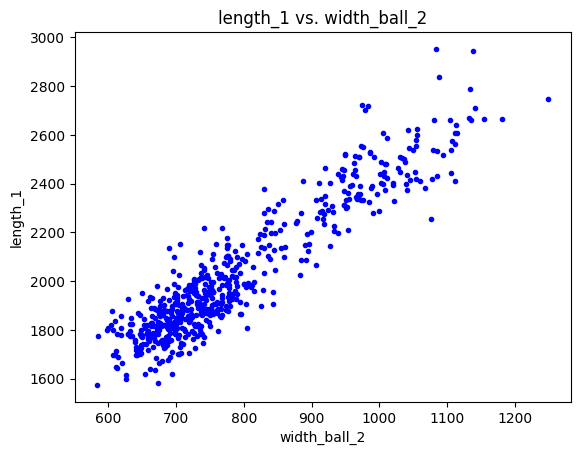

In [ ]:
plt.plot(df_test_orig_unorm_lw['width_ball_2'], df_test_orig_unorm_lw['length_1'], '.', color='b')
plt.xlabel('width_ball_2')
plt.ylabel('length_1')
plt.title('length_1 vs. width_ball_2')
plt.show()

#### Holdout set 1

Unormalizing landmarks, imputing missing values with the mean, flipping all feet to left, adding lengths, widths and areas, and re-normalizing all features.

In [ ]:
hold_out_mna_flip_lw_a_norm = df_test_orig.copy()
hold_out_mna_flip_lw_a_norm = unnormalize_landmarks(hold_out_mna_flip_lw_a_norm)
# Flipping prints
hold_out_mna_flip_lw_a_norm = add_foot_type(hold_out_mna_flip_lw_a_norm)
hold_out_mna_flip_lw_a_norm = flip_footprints(hold_out_mna_flip_lw_a_norm, False, 'left')
hold_out_mna_flip_lw_a_norm = hold_out_mna_flip_lw_a_norm.drop('foot_type', axis=1)

# replace NaNs
imp = SimpleImputer(missing_values=np.nan, strategy='mean')

imp.fit(df_train_dna_flip.drop(['sex'], axis=1))
temp = imp.transform(hold_out_mna_flip_lw_a_norm)
hold_out_mna_flip_lw_a_norm = pd.DataFrame(data=temp, columns=list(hold_out_mna_flip_lw_a_norm.columns))

# Adding length, width and areas
hold_out_mna_flip_lw_a_norm = calculate_lengths_widths(hold_out_mna_flip_lw_a_norm)
hold_out_mna_flip_lw_a_norm = add_areas(hold_out_mna_flip_lw_a_norm)

# Normalize Lengths and Widths
scaler = MinMaxScaler()
columns_to_normalize = hold_out_mna_flip_lw_a_norm.columns.difference(['sex'])
hold_out_mna_flip_lw_a_norm[columns_to_normalize] = scaler.fit_transform(hold_out_mna_flip_lw_a_norm[columns_to_normalize])

hold_out_mna_flip_lw_a_norm.head()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0.640070,0.445768,0.702084,0.478103,0.607018,0.461753,0.516824,0.509762,0.461074,0.521613,0.470670,0.505976,0.493032,0.454855,0.530697,0.527059,0.638560,0.569888,0.717942,0.636900,0.665292,0.662433,0.572549,0.622924,0.597051,0.487276,0.549563,0.546944,0.585951,0.504972,0.633530,0.542639,0.655936,0.520032,0.632941,0.497607,0.496607,0.465532,0.489772,0.479194,0.404842,0.228622,0.217543,0.237146,0.229409,0.275565,0.316714,0.292351,0.356006,0.339186,0.314285
1,0.701895,0.262578,0.691548,0.180910,0.649226,0.229591,0.607626,0.301593,0.526413,0.263014,0.599435,0.275143,0.655591,0.267848,0.717026,0.418913,0.721107,0.429602,0.735392,0.491624,0.725756,0.489144,0.589342,0.447454,0.232197,0.357437,0.324151,0.369672,0.562956,0.274247,0.668081,0.264834,0.714122,0.258487,0.713665,0.281852,0.488536,0.537566,0.523421,0.507062,0.485103,0.313791,0.326650,0.401116,0.373130,0.362367,0.295404,0.421792,0.840526,0.439456,0.525963
2,0.479752,0.300078,0.532399,0.347426,0.477585,0.311044,0.420835,0.289505,0.336614,0.293670,0.348248,0.251384,0.384334,0.212143,0.523507,0.209907,0.610509,0.221254,0.654100,0.246779,0.722356,0.243626,0.766622,0.244686,0.720108,0.266260,0.646416,0.284974,0.541195,0.288197,0.556859,0.324988,0.551597,0.296222,0.480535,0.301082,0.211805,0.164855,0.208117,0.250376,0.166628,0.189669,0.165495,0.192250,0.198596,0.214849,0.220540,0.179814,0.088482,0.159062,0.132793
3,0.344525,0.262906,0.338998,0.262222,0.251408,0.235307,0.201825,0.228434,0.165259,0.229412,0.127062,0.166648,0.138750,0.147126,0.257676,0.149533,0.366447,0.166287,0.473250,0.190914,0.476647,0.220822,0.392869,0.204489,0.372644,0.220779,0.412353,0.156334,0.370296,0.204852,0.384284,0.218391,0.388491,0.243323,0.266128,0.247678,0.183731,0.173724,0.210246,0.243882,0.175182,0.118902,0.118771,0.141680,0.119739,0.144654,0.201858,0.078806,0.141373,0.169005,0.113532
4,0.415178,0.219543,0.401133,0.245759,0.358232,0.282599,0.282725,0.321314,0.165962,0.285477,0.173796,0.282235,0.159510,0.259601,0.189971,0.256552,0.247762,0.265362,0.320680,0.263737,0.309334,0.324323,0.284456,0.265967,0.244705,0.224696,0.375512,0.243567,0.299494,0.248274,0.349045,0.263504,0.422791,0.232425,0.245661,0.274296,0.299351,0.281294,0.286251,0.290691,0.249420,0.228436,0.222375,0.236924,0.236966,0.230327,0.283696,0.186775,0.245175,0.251244,0.218238


In [ ]:
df_train_dna_clean_smote_flip_lw_a_norm.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.533420,0.175333,0.504288,0.222716,0.511636,0.245497,0.469247,0.244936,0.430577,0.214095,0.413990,0.263692,0.387220,0.210618,0.385231,0.289659,0.411962,0.318390,0.479130,0.349836,0.502080,0.339412,0.537134,0.308353,0.510699,0.287459,0.571895,0.281100,0.623937,0.279552,0.634276,0.277779,0.655335,0.234858,0.516853,0.260083,0.345220,0.316344,0.325946,0.309629,0.329243,0.274699,0.272492,0.233597,0.223460,0.239084,0.248731,0.158985,0.185668,0.229221,0.183229
1,0,0.441673,0.470022,0.380329,0.408757,0.426797,0.371832,0.394544,0.387977,0.394958,0.405242,0.402723,0.415226,0.426056,0.394672,0.489646,0.436900,0.469085,0.498465,0.520526,0.517068,0.555667,0.466700,0.624920,0.489417,0.585775,0.441123,0.596496,0.423176,0.594034,0.500128,0.562545,0.513962,0.555749,0.506625,0.491154,0.466390,0.279059,0.317413,0.367029,0.331305,0.299860,0.306667,0.333014,0.335138,0.297408,0.334404,0.292470,0.165390,0.206741,0.265518,0.212416
2,1,0.298446,0.535865,0.290030,0.514094,0.321455,0.497340,0.313650,0.502632,0.278337,0.493639,0.268881,0.567775,0.251468,0.562176,0.341858,0.639469,0.402839,0.701368,0.430682,0.786059,0.398551,0.680543,0.400262,0.643813,0.362703,0.628647,0.420178,0.601467,0.407805,0.644967,0.284383,0.649438,0.212810,0.600305,0.344647,0.590021,0.484386,0.503311,0.536950,0.518425,0.520631,0.599549,0.516500,0.472501,0.544505,0.491658,0.471671,0.345962,0.287230,0.475530,0.396290
3,1,0.456688,0.304409,0.423580,0.323518,0.364090,0.337134,0.332691,0.332073,0.286817,0.292903,0.206612,0.289081,0.189394,0.229810,0.239593,0.251467,0.261037,0.237914,0.388227,0.245701,0.424207,0.266499,0.400293,0.255580,0.385955,0.242278,0.441704,0.259518,0.514848,0.308916,0.524591,0.324855,0.517647,0.303221,0.379894,0.319058,0.150282,0.132940,0.131937,0.119384,0.128265,0.171758,0.152337,0.117378,0.122168,0.048555,0.152832,0.054087,0.142030,0.098848,0.077687
4,1,0.411337,0.635358,0.328481,0.598334,0.291404,0.610843,0.248340,0.578299,0.225090,0.559881,0.215978,0.569515,0.223393,0.530721,0.297297,0.496337,0.391419,0.539877,0.507177,0.599756,0.535291,0.574468,0.538006,0.627805,0.542677,0.579023,0.580026,0.592766,0.660126,0.593310,0.539037,0.662613,0.488340,0.661826,0.363253,0.637309,0.232237,0.242455,0.224989,0.224246,0.202297,0.174770,0.136262,0.118272,0.147233,0.096508,0.159950,0.053518,0.023034,0.088879,0.029652


In [ ]:
df_train_dna_flip_lw_a_clean_norm.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.533420,0.175333,0.504288,0.222716,0.511636,0.245497,0.469247,0.244936,0.430577,0.214095,0.413990,0.263692,0.387220,0.210618,0.385231,0.289659,0.411962,0.318390,0.479130,0.349836,0.502080,0.339412,0.537134,0.308353,0.510699,0.287459,0.571895,0.281100,0.623937,0.279552,0.634276,0.277779,0.655335,0.234858,0.516853,0.260083,0.345220,0.316344,0.325946,0.309629,0.329243,0.274699,0.272492,0.233597,0.223460,0.239084,0.248731,0.158985,0.185668,0.229221,0.183229
1,0,0.441673,0.470022,0.380329,0.408757,0.426797,0.371832,0.394544,0.387977,0.394958,0.405242,0.402723,0.415226,0.426056,0.394672,0.489646,0.436900,0.469085,0.498465,0.520526,0.517068,0.555667,0.466700,0.624920,0.489417,0.585775,0.441123,0.596496,0.423176,0.594034,0.500128,0.562545,0.513962,0.555749,0.506625,0.491154,0.466390,0.279059,0.317413,0.367029,0.331305,0.299860,0.306667,0.333014,0.335138,0.297408,0.334404,0.292470,0.165390,0.206741,0.265518,0.212416
2,1,0.298446,0.535865,0.290030,0.514094,0.321455,0.497340,0.313650,0.502632,0.278337,0.493639,0.268881,0.567775,0.251468,0.562176,0.341858,0.639469,0.402839,0.701368,0.430682,0.786059,0.398551,0.680543,0.400262,0.643813,0.362703,0.628647,0.420178,0.601467,0.407805,0.644967,0.284383,0.649438,0.212810,0.600305,0.344647,0.590021,0.484386,0.503311,0.536950,0.518425,0.520631,0.599549,0.516500,0.472501,0.544505,0.491658,0.471671,0.345962,0.287230,0.475530,0.396290
3,1,0.456688,0.304409,0.423580,0.323518,0.364090,0.337134,0.332691,0.332073,0.286817,0.292903,0.206612,0.289081,0.189394,0.229810,0.239593,0.251467,0.261037,0.237914,0.388227,0.245701,0.424207,0.266499,0.400293,0.255580,0.385955,0.242278,0.441704,0.259518,0.514848,0.308916,0.524591,0.324855,0.517647,0.303221,0.379894,0.319058,0.150282,0.132940,0.131937,0.119384,0.128265,0.171758,0.152337,0.117378,0.122168,0.048555,0.152832,0.054087,0.142030,0.098848,0.077687
4,1,0.411337,0.635358,0.328481,0.598334,0.291404,0.610843,0.248340,0.578299,0.225090,0.559881,0.215978,0.569515,0.223393,0.530721,0.297297,0.496337,0.391419,0.539877,0.507177,0.599756,0.535291,0.574468,0.538006,0.627805,0.542677,0.579023,0.580026,0.592766,0.660126,0.593310,0.539037,0.662613,0.488340,0.661826,0.363253,0.637309,0.232237,0.242455,0.224989,0.224246,0.202297,0.174770,0.136262,0.118272,0.147233,0.096508,0.159950,0.053518,0.023034,0.088879,0.029652


#### Holdout set 2

Unormalizing landmarks, imputing missing values with KNN, flipping all feet to left, adding lengths, widths and areas, and re-normalizing all features.

In [ ]:
hold_out_kna_flip_lw_a_norm = df_test_orig.copy()
hold_out_kna_flip_lw_a_norm = unnormalize_landmarks(hold_out_kna_flip_lw_a_norm)
# Flipping prints
hold_out_kna_flip_lw_a_norm = add_foot_type(hold_out_kna_flip_lw_a_norm)
hold_out_kna_flip_lw_a_norm = flip_footprints(hold_out_kna_flip_lw_a_norm, False, 'left')
hold_out_kna_flip_lw_a_norm = hold_out_kna_flip_lw_a_norm.drop('foot_type', axis=1)

# replace NaNs
imp = KNNImputer(n_neighbors=5)

imp.fit(df_train_dna_flip.drop(['sex'], axis=1))
temp = imp.transform(hold_out_kna_flip_lw_a_norm)
hold_out_kna_flip_lw_a_norm = pd.DataFrame(data=temp, columns=list(hold_out_kna_flip_lw_a_norm.columns))

# Adding length, width and areas
hold_out_kna_flip_lw_a_norm = calculate_lengths_widths(hold_out_kna_flip_lw_a_norm)
hold_out_kna_flip_lw_a_norm = add_areas(hold_out_kna_flip_lw_a_norm)

# Normalize Lengths and Widths
scaler = MinMaxScaler()
columns_to_normalize = hold_out_kna_flip_lw_a_norm.columns.difference(['sex'])
hold_out_kna_flip_lw_a_norm[columns_to_normalize] = scaler.fit_transform(hold_out_kna_flip_lw_a_norm[columns_to_normalize])

hold_out_kna_flip_lw_a_norm.head()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0.640070,0.445768,0.702084,0.478103,0.607018,0.461753,0.516824,0.509762,0.461074,0.521613,0.470670,0.505976,0.493032,0.454855,0.530697,0.527059,0.638560,0.569888,0.717942,0.636900,0.665292,0.662433,0.572549,0.622924,0.597051,0.487276,0.549563,0.546944,0.585951,0.504972,0.633530,0.542639,0.655936,0.520032,0.632941,0.497607,0.496607,0.465532,0.489772,0.479194,0.404842,0.228622,0.217543,0.237146,0.229409,0.275565,0.328605,0.292351,0.356006,0.339186,0.314285
1,0.701895,0.262578,0.691548,0.180910,0.649226,0.229591,0.607626,0.301593,0.526413,0.263014,0.599435,0.275143,0.655591,0.267848,0.717026,0.418913,0.721107,0.429602,0.735392,0.491624,0.725756,0.489144,0.589342,0.447454,0.232197,0.357437,0.324151,0.369672,0.562956,0.274247,0.668081,0.264834,0.714122,0.258487,0.713665,0.281852,0.488536,0.537566,0.523421,0.507062,0.485103,0.313791,0.326650,0.401116,0.373130,0.362367,0.307666,0.421792,0.840526,0.439456,0.525963
2,0.479752,0.300078,0.532399,0.347426,0.477585,0.311044,0.420835,0.289505,0.336614,0.293670,0.348248,0.251384,0.384334,0.212143,0.523507,0.209907,0.610509,0.221254,0.654100,0.246779,0.722356,0.243626,0.766622,0.244686,0.720108,0.266260,0.646416,0.284974,0.541195,0.288197,0.556859,0.324988,0.551597,0.296222,0.480535,0.301082,0.211805,0.164855,0.208117,0.250376,0.166628,0.189669,0.165495,0.192250,0.198596,0.214849,0.234104,0.179814,0.088482,0.159062,0.132793
3,0.344525,0.262906,0.338998,0.262222,0.251408,0.235307,0.201825,0.228434,0.165259,0.229412,0.127062,0.166648,0.138750,0.147126,0.257676,0.149533,0.366447,0.166287,0.473250,0.190914,0.476647,0.220822,0.392869,0.204489,0.372644,0.220779,0.412353,0.156334,0.370296,0.204852,0.384284,0.218391,0.388491,0.243323,0.266128,0.247678,0.183731,0.173724,0.210246,0.243882,0.175182,0.118902,0.118771,0.141680,0.119739,0.144654,0.215748,0.078806,0.141373,0.169005,0.113532
4,0.415178,0.219543,0.401133,0.245759,0.358232,0.282599,0.282725,0.321314,0.165962,0.285477,0.173796,0.282235,0.159510,0.259601,0.189971,0.256552,0.247762,0.265362,0.320680,0.263737,0.309334,0.324323,0.284456,0.265967,0.244705,0.224696,0.375512,0.243567,0.299494,0.248274,0.349045,0.263504,0.422791,0.232425,0.245661,0.274296,0.299351,0.281294,0.286251,0.290691,0.249420,0.228436,0.222375,0.236924,0.236966,0.230327,0.296162,0.186775,0.245175,0.251244,0.218238


#### Holdout set 3

Unormalizing landmarks, imputing missing values with the mean, flipping all feet to left, adding all pairwise distances and areas, and re-normalizing all features.

In [ ]:
hold_out_mna_flip_pairwise_a_norm = df_test_orig.copy()
hold_out_mna_flip_pairwise_a_norm = unnormalize_landmarks(hold_out_mna_flip_pairwise_a_norm)

hold_out_mna_flip_pairwise_a_norm = add_foot_type(hold_out_mna_flip_pairwise_a_norm)
hold_out_mna_flip_pairwise_a_norm = flip_footprints(hold_out_mna_flip_pairwise_a_norm, False, "left")
hold_out_mna_flip_pairwise_a_norm = hold_out_mna_flip_pairwise_a_norm.drop(['foot_type'], axis=1)
# replace NaNs
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(df_train_dna.drop(['sex'], axis=1))
temp = imp.transform(hold_out_mna_flip_pairwise_a_norm)
hold_out_mna_flip_pairwise_a_norm = pd.DataFrame(data=temp, columns=list(hold_out_mna_flip_pairwise_a_norm.columns))
# Distances
hold_out_mna_flip_pairwise_a_norm = all_pairwise_distances(hold_out_mna_flip_pairwise_a_norm)
# Areas
hold_out_mna_flip_pairwise_a_norm = add_areas(hold_out_mna_flip_pairwise_a_norm)

scaler = MinMaxScaler()
columns_to_normalize = hold_out_mna_flip_pairwise_a_norm.columns
hold_out_mna_flip_pairwise_a_norm[columns_to_normalize] = scaler.fit_transform(hold_out_mna_flip_pairwise_a_norm[columns_to_normalize])
hold_out_mna_flip_pairwise_a_norm.head()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0.640070,0.445768,0.702084,0.478103,0.607018,0.461753,0.516824,0.509762,0.536363,0.521613,0.552941,0.505976,0.580654,0.454855,0.530697,0.527059,0.638560,0.569888,0.717942,0.636900,0.665292,0.662433,0.572549,0.622924,0.597051,0.487276,0.549563,0.546944,0.585951,0.504972,0.630108,0.542639,0.655936,0.520032,0.632941,0.497607,0.345142,0.318516,0.423124,0.507965,0.493095,0.437668,0.425082,0.440933,0.496607,0.542313,0.572472,0.416308,0.570454,0.500730,0.569261,0.517253,0.432768,0.229623,0.464605,0.638838,0.601855,0.509639,0.429859,0.440651,0.465532,0.508264,0.516172,0.377077,0.677784,0.613933,0.675711,0.676249,0.612705,0.451039,0.514119,0.469866,0.390641,0.479267,0.461243,0.489772,0.524876,0.552149,0.398816,0.623448,0.484362,0.528248,0.525597,0.528256,0.512485,0.481255,0.340358,0.446784,0.458274,0.479194,0.506339,0.528409,0.363926,0.578107,0.408086,0.519855,0.536232,0.282763,0.395059,0.313629,0.393263,0.383081,0.404842,0.434124,0.466300,0.311698,0.400674,0.466488,0.557599,0.573668,0.380355,0.161016,0.386515,0.418797,0.444767,0.465142,0.486101,0.306676,0.480121,0.519748,0.556756,0.477664,0.311802,0.460070,0.455362,0.470839,0.488409,0.555749,0.399940,0.590550,0.558736,0.496817,0.405309,0.268666,0.427089,0.415462,0.588076,0.570525,0.444919,0.359184,0.364993,0.338530,0.361853,0.393543,0.423366,0.434875,0.404089,0.463895,0.372040,0.387988,0.374860,0.386378,0.424249,0.283548,0.362097,0.482800,0.404721,0.442701,0.428603,0.437834,0.457531,0.341104,0.562925,0.431761,0.527303,0.480055,0.486340,0.504775,0.838277,0.461135,0.552111,0.506959,0.510147,0.567826,0.200955,0.337840,0.288899,0.329914,0.386902,0.357629,0.321314,0.372788,0.487270,0.280223,0.381539,0.457625,0.475256,0.56953

In [ ]:
df_train_dna_clean_smote_flip_pairwise_a_norm.head()

,sex,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0,0.533420,0.175333,0.504288,0.222716,0.511636,0.245497,0.469247,0.244936,0.430577,0.214095,0.413990,0.263692,0.387220,0.210618,0.385231,0.289659,0.411962,0.318390,0.479130,0.349836,0.502080,0.339412,0.537134,0.308353,0.510699,0.287459,0.571895,0.281100,0.623937,0.279552,0.634276,0.277779,0.655335,0.234858,0.516853,0.260083,0.418559,0.448752,0.380336,0.316164,0.382504,0.329061,0.350948,0.348904,0.345220,0.384513,0.338903,0.358463,0.337646,0.344157,0.362089,0.388640,0.396131,0.390902,0.349695,0.266557,0.339028,0.285019,0.349176,0.319988,0.316344,0.362517,0.319532,0.359701,0.257992,0.326269,0.337485,0.338675,0.365737,0.227094,0.235970,0.342210,0.276129,0.354168,0.328761,0.325946,0.362243,0.324069,0.365387,0.243203,0.289631,0.334814,0.294856,0.434123,0.330675,0.367074,0.255657,0.358233,0.310905,0.309629,0.349077,0.307031,0.340230,0.222901,0.263036,0.308828,0.268857,0.370404,0.457182,0.317350,0.343952,0.332856,0.329243,0.354148,0.316159,0.337120,0.239895,0.287135,0.304288,0.260438,0.358522,0.179188,0.352186,0.310191,0.311535,0.344584,0.315322,0.300604,0.209571,0.290983,0.272492,0.274699,0.454749,0.403345,0.359119,0.329939,0.406774,0.367332,0.359822,0.199594,0.254407,0.233597,0.223460,0.258891,0.380048,0.337800,0.317956,0.301004,0.311900,0.360521,0.301799,0.275434,0.299105,0.358153,0.215159,0.239084,0.301606,0.417651,0.342847,0.337151,0.320831,0.332719,0.318810,0.253683,0.361445,0.410419,0.357988,0.346270,0.338880,0.346338,0.316317,0.388922,0.397020,0.428128,0.415240,0.401855,0.401344,0.361898,0.358666,0.376032,0.384076,0.341071,0.337897,0.324443,0.383025,0.325517,0.297299,0.334149,0.339810,0.383160,0.372552,0.324779,0.224807,0.318309,0.357001,0.264685,0.421179,0

#### Holdout set 4

Taking holdout set 3 but dropping all landmarks columns to keep only pairwise distances and areas.

In [ ]:
hold_out_mna_flip_pairwise_a_norm_shrunk = hold_out_mna_flip_pairwise_a_norm.copy()

for i in range(18):
    hold_out_mna_flip_pairwise_a_norm_shrunk = hold_out_mna_flip_pairwise_a_norm_shrunk.drop([f"x{i}", f"y{i}"], axis=1)

#### Holdout set 5

Unormalizing landmarks, imputing missing values with the mean, flipping all feet to left, adding all pairwise distances and areas, and standardizing all features.

In [ ]:
hold_out_mna_flip_pairwise_a_stan = df_test_orig.copy()
hold_out_mna_flip_pairwise_a_stan = unnormalize_landmarks(hold_out_mna_flip_pairwise_a_stan)

# Flip prints
hold_out_mna_flip_pairwise_a_stan = add_foot_type(hold_out_mna_flip_pairwise_a_stan)
hold_out_mna_flip_pairwise_a_stan = flip_footprints(hold_out_mna_flip_pairwise_a_stan, False, "left")
hold_out_mna_flip_pairwise_a_stan = hold_out_mna_flip_pairwise_a_stan.drop(['foot_type'], axis=1)

# replace NaNs
imp = SimpleImputer(missing_values=np.nan, strategy='mean')
imp.fit(df_train_dna.drop(['sex'], axis=1))
temp = imp.transform(hold_out_mna_flip_pairwise_a_stan)
hold_out_mna_flip_pairwise_a_stan = pd.DataFrame(data=temp, columns=list(hold_out_mna_flip_pairwise_a_stan.columns))

# Distances
hold_out_mna_flip_pairwise_a_stan = all_pairwise_distances(hold_out_mna_flip_pairwise_a_stan)

# Areas
hold_out_mna_flip_pairwise_a_stan = add_areas(hold_out_mna_flip_pairwise_a_stan)

# Scaling
scaler = StandardScaler()
columns_to_standardize = hold_out_mna_flip_pairwise_a_stan.columns
hold_out_mna_flip_pairwise_a_stan[columns_to_standardize] = scaler.fit_transform(hold_out_mna_flip_pairwise_a_stan[columns_to_standardize])
hold_out_mna_flip_pairwise_a_stan.head()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,distance_0_1,distance_0_2,distance_0_3,distance_0_4,distance_0_5,distance_0_6,distance_0_7,distance_0_8,distance_0_9,distance_0_10,distance_0_11,distance_0_12,distance_0_13,distance_0_14,distance_0_15,distance_0_16,distance_0_17,distance_1_2,distance_1_3,distance_1_4,distance_1_5,distance_1_6,distance_1_7,distance_1_8,distance_1_9,distance_1_10,distance_1_11,distance_1_12,distance_1_13,distance_1_14,distance_1_15,distance_1_16,distance_1_17,distance_2_3,distance_2_4,distance_2_5,distance_2_6,distance_2_7,distance_2_8,distance_2_9,distance_2_10,distance_2_11,distance_2_12,distance_2_13,distance_2_14,distance_2_15,distance_2_16,distance_2_17,distance_3_4,distance_3_5,distance_3_6,distance_3_7,distance_3_8,distance_3_9,distance_3_10,distance_3_11,distance_3_12,distance_3_13,distance_3_14,distance_3_15,distance_3_16,distance_3_17,distance_4_5,distance_4_6,distance_4_7,distance_4_8,distance_4_9,distance_4_10,distance_4_11,distance_4_12,distance_4_13,distance_4_14,distance_4_15,distance_4_16,distance_4_17,distance_5_6,distance_5_7,distance_5_8,distance_5_9,distance_5_10,distance_5_11,distance_5_12,distance_5_13,distance_5_14,distance_5_15,distance_5_16,distance_5_17,distance_6_7,distance_6_8,distance_6_9,distance_6_10,distance_6_11,distance_6_12,distance_6_13,distance_6_14,distance_6_15,distance_6_16,distance_6_17,distance_7_8,distance_7_9,distance_7_10,distance_7_11,distance_7_12,distance_7_13,distance_7_14,distance_7_15,distance_7_16,distance_7_17,distance_8_9,distance_8_10,distance_8_11,distance_8_12,distance_8_13,distance_8_14,distance_8_15,distance_8_16,distance_8_17,distance_9_10,distance_9_11,distance_9_12,distance_9_13,distance_9_14,distance_9_15,distance_9_16,distance_9_17,distance_10_11,distance_10_12,distance_10_13,distance_10_14,distance_10_15,distance_10_16,distance_10_17,distance_11_12,distance_11_13,distance_11_14,distance_11_15,distance_11_16,distance_11_17,distance_12_13,distance_12_14,distance_12_15,distance_12_16,distance_12_17,distance_13_14,distance_13_15,distance_13_16,distance_13_17,distance_14_15,distance_14_16,distance_14_17,distance_15_16,distance_15_17,distance_16_17,toes_area,ball_area,midfoot_area,hindfoot_area,total_area
0,0.752197,0.037979,0.869972,0.107962,0.555193,0.089997,0.141161,0.286438,0.120504,0.484358,0.162919,0.465264,0.217649,0.247942,0.038183,0.527725,0.180850,0.599372,0.469096,0.700481,0.160840,0.910433,-0.360157,0.820873,0.221081,0.293549,-0.359316,0.691119,0.289819,0.428675,0.511490,0.485658,0.639078,0.415502,0.810749,0.360083,0.077701,-0.331380,-0.393416,0.008863,0.173046,0.009105,0.506480,0.621374,0.769680,1.080440,1.025147,0.287063,0.959390,0.770108,1.028679,1.047333,0.570808,-0.846837,-0.416727,0.169773,0.290513,0.019036,0.525988,0.606957,0.713864,1.014213,1.019127,0.286089,1.103990,0.710905,0.742067,0.630192,0.692732,0.239167,0.698693,0.634398,0.196897,0.617731,0.659217,0.724387,1.019899,1.066321,0.331578,1.240661,0.615355,0.452094,0.203810,0.618042,0.771772,0.538409,-0.012996,0.467832,0.531609,0.565729,0.834167,0.885635,0.058364,0.923892,0.091480,-0.162625,-0.440991,-1.149578,-0.037107,-0.651119,0.283510,0.394190,0.418656,0.681735,0.747210,-0.225893,0.665868,-0.170041,-0.344952,-0.455989,-0.847791,-1.057922,0.344306,0.448786,0.450223,0.733584,0.852162,-0.235809,0.722633,-0.122695,-0.305809,-0.343128,-0.295399,0.743637,0.738778,0.668491,0.962613,1.156832,0.074916,0.776898,-0.069967,-0.326017,-0.389549,-0.458421,0.441876,0.312371,0.562305,0.670461,0.400540,-0.012294,0.207734,0.054568,0.161751,0.398256,-0.424449,-0.391172,0.071603,0.995939,0.225513,0.509800,0.360014,0.408786,0.530223,-0.423758,0.048679,1.068525,0.302958,0.743626,0.608911,0.623256,0.649304,0.330604,1.657916,0.604616,1.207158,0.992094,0.978822,1.005687,2.396994,0.551316,1.089387,0.777606,0.832893,1.045173,-0.879568,-0.248843,-0.362267,-0.203220,0.046847,-0.502232,-0.379646,0.187725,1.156043,-0.505

#### Holdout set 6

Taking holdout set 5 but applying principal component analysis from df_train_pca to reduce to the 20 most useful principal components.

In [ ]:
X_holdout_pca = pca.transform(hold_out_mna_flip_pairwise_a_stan.copy())
holdout_pca = pd.DataFrame(X_holdout_pca, columns=[f'PC{i+1}' for i in range(20)])

# Outputs
print(f"Training set PCA shape: {df_train_pca.shape}")
print(f"Holdout set PCA shape: {holdout_pca.shape}")

holdout_pca.head()

Training set PCA shape: (2220, 21)
Holdout set PCA shape: (598, 20)


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,4.967515,1.240283,1.022542,0.011627,3.102554,0.270205,-0.140192,-0.002313,-4.880278,-1.068742,0.285619,-0.779153,-0.249128,-0.405038,-1.567367,0.075346,-1.522558,1.507254,0.508895,0.441945
1,8.992006,-4.222626,3.957995,6.502668,6.312687,-0.692771,1.304807,0.106610,-2.750619,-0.841470,-1.240951,0.969781,0.912662,0.622714,1.650542,0.032027,1.871324,1.717605,-0.714584,-0.771525
2,-9.035644,-1.824896,1.316323,-0.518542,-2.277618,0.960745,0.201975,-2.139763,1.428659,0.742785,0.125306,-0.592921,0.815219,-0.091057,-0.761670,-1.693339,-1.836839,0.130679,-0.065771,-0.279186
3,-10.212086,-6.557325,-3.096833,-2.026433,-0.251908,0.779447,-0.515622,-1.137099,0.468854,-1.639644,-1.006888,0.117981,-0.781504,-0.904467,0.635911,-0.906135,-1.442517,-0.170885,-0.199782,-0.531147
4,-3.811069,-6.425263,-3.679339,-0.864242,-1.153755,-0.198476,-1.802558,0.473221,-2.298271,-1.281571,0.891791,-1.605959,-0.321993,0.273443,-0.779886,-0.039127,1.199136,0.939982,0.213943,-0.297896


#### Holdout set 7

Taking holdout set 6 and normalizing all features.

In [ ]:
holdout_pca_norm = holdout_pca.copy()
scaler = MinMaxScaler()
columns_to_normalize = holdout_pca_norm.columns
holdout_pca_norm[columns_to_normalize] = scaler.fit_transform(holdout_pca_norm[columns_to_normalize])
holdout_pca_norm.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,0.437577,0.543854,0.516884,0.447187,0.521623,0.524987,0.529950,0.622689,0.102197,0.346006,0.521283,0.516677,0.440901,0.344203,0.290753,0.486669,0.242528,0.790136,0.737312,0.608707
1,0.512332,0.307759,0.645818,0.847918,0.725884,0.439996,0.672940,0.630639,0.312300,0.369590,0.319393,0.675076,0.585358,0.489292,0.721229,0.480618,0.832946,0.826804,0.535412,0.433591
2,0.177466,0.411383,0.529787,0.414456,0.179284,0.585933,0.563809,0.466689,0.724609,0.533989,0.500081,0.533544,0.573242,0.388528,0.398535,0.239618,0.187855,0.550179,0.642480,0.504641
3,0.155613,0.206858,0.335948,0.321365,0.308179,0.569932,0.492799,0.539868,0.629919,0.286763,0.350348,0.597929,0.374706,0.273698,0.585496,0.349575,0.256453,0.497612,0.620365,0.468280
4,0.274513,0.212565,0.310362,0.393114,0.250795,0.483622,0.365450,0.657396,0.356926,0.323920,0.601449,0.441795,0.431841,0.439985,0.396098,0.470680,0.716009,0.691252,0.688639,0.501941


In [ ]:
df_train_pca.head()

,sex,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
0,0,-2.985137,-2.901741,2.839934,-0.751621,1.337235,-0.280787,-0.955931,0.684818,-0.758042,-0.286198,0.822139,-1.325844,0.697402,1.098152,-0.805683,-1.112182,0.688553,-0.584689,0.127976,-0.240512
1,0,-1.389676,0.864056,0.143649,-1.935430,-0.868228,0.371154,2.468970,1.281791,-0.665985,-0.440408,-0.431066,1.036166,-0.792938,-0.995822,1.129379,-0.402935,-0.255606,0.735679,-1.109332,-0.281133
2,1,9.727887,-0.230610,-5.929157,-0.807700,-1.875507,1.625910,0.908772,-0.043357,0.041479,1.525511,1.485789,1.159237,1.389824,-1.043943,0.747059,-1.129884,1.063768,-0.047151,-1.050052,0.824950
3,1,-12.713252,-3.051907,-2.645804,-0.396858,0.276735,-0.133610,-1.505604,1.774750,-0.464814,-1.467537,0.987300,-0.559309,-0.740856,-0.697750,-0.703976,-0.795380,0.089910,0.103452,0.586796,-0.069743
4,1,-8.910948,3.375963,-4.878637,-4.307527,1.980991,0.128265,1.427646,-1.981840,-1.173207,-0.639182,-0.822295,-1.585581,-0.544057,0.391606,-0.389644,0.358409,-0.076615,1.015993,-1.341611,0.993892


#### Holdout set 8

Taking holdout set 1 (hold_out_mna_flip_lw_a_norm) but splitting linearly into upper/lower cluster using the function classify_footprint_cluster_line()

In [ ]:
hold_out_cluster = hold_out_mna_flip_lw_a_norm.copy()
hold_out_cluster = classify_footprint_cluster_line(hold_out_cluster)
hold_out_cluster.head()

,x0,y0,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9,x10,y10,x11,y11,x12,y12,x13,y13,x14,y14,x15,y15,x16,y16,x17,y17,length_0,length_1,length_2,length_3,length_4,width_ball_0,width_ball_1,width_ball_2,width_ball_3,width_heel_0,toes_area,ball_area,midfoot_area,hindfoot_area,total_area,cluster
0,0.640070,0.445768,0.702084,0.478103,0.607018,0.461753,0.516824,0.509762,0.461074,0.521613,0.470670,0.505976,0.493032,0.454855,0.530697,0.527059,0.638560,0.569888,0.717942,0.636900,0.665292,0.662433,0.572549,0.622924,0.597051,0.487276,0.549563,0.546944,0.585951,0.504972,0.633530,0.542639,0.655936,0.520032,0.632941,0.497607,0.496607,0.465532,0.489772,0.479194,0.404842,0.228622,0.217543,0.237146,0.229409,0.275565,0.316714,0.292351,0.356006,0.339186,0.314285,lower
1,0.701895,0.262578,0.691548,0.180910,0.649226,0.229591,0.607626,0.301593,0.526413,0.263014,0.599435,0.275143,0.655591,0.267848,0.717026,0.418913,0.721107,0.429602,0.735392,0.491624,0.725756,0.489144,0.589342,0.447454,0.232197,0.357437,0.324151,0.369672,0.562956,0.274247,0.668081,0.264834,0.714122,0.258487,0.713665,0.281852,0.488536,0.537566,0.523421,0.507062,0.485103,0.313791,0.326650,0.401116,0.373130,0.362367,0.295404,0.421792,0.840526,0.439456,0.525963,upper
2,0.479752,0.300078,0.532399,0.347426,0.477585,0.311044,0.420835,0.289505,0.336614,0.293670,0.348248,0.251384,0.384334,0.212143,0.523507,0.209907,0.610509,0.221254,0.654100,0.246779,0.722356,0.243626,0.766622,0.244686,0.720108,0.266260,0.646416,0.284974,0.541195,0.288197,0.556859,0.324988,0.551597,0.296222,0.480535,0.301082,0.211805,0.164855,0.208117,0.250376,0.166628,0.189669,0.165495,0.192250,0.198596,0.214849,0.220540,0.179814,0.088482,0.159062,0.132793,lower
3,0.344525,0.262906,0.338998,0.262222,0.251408,0.235307,0.201825,0.228434,0.165259,0.229412,0.127062,0.166648,0.138750,0.147126,0.257676,0.149533,0.366447,0.166287,0.473250,0.190914,0.476647,0.220822,0.392869,0.204489,0.372644,0.220779,0.412353,0.156334,0.370296,0.204852,0.384284,0.218391,0.388491,0.243323,0.266128,0.247678,0.183731,0.173724,0.210246,0.243882,0.175182,0.118902,0.118771,0.141680,0.119739,0.144654,0.201858,0.078806,0.141373,0.169005,0.113532,lower
4,0.415178,0.219543,0.401133,0.245759,0.358232,0.282599,0.282725,0.321314,0.165962,0.285477,0.173796,0.282235,0.159510,0.259601,0.189971,0.256552,0.247762,0.265362,0.320680,0.263737,0.309334,0.324323,0.284456,0.265967,0.244705,0.224696,0.375512,0.243567,0.299494,0.248274,0.349045,0.263504,0.422791,0.232425,0.245661,0.274296,0.299351,0.281294,0.286251,0.290691,0.249420,0.228436,0.222375,0.236924,0.236966,0.230327,0.283696,0.186775,0.245175,0.251244,0.218238,lower


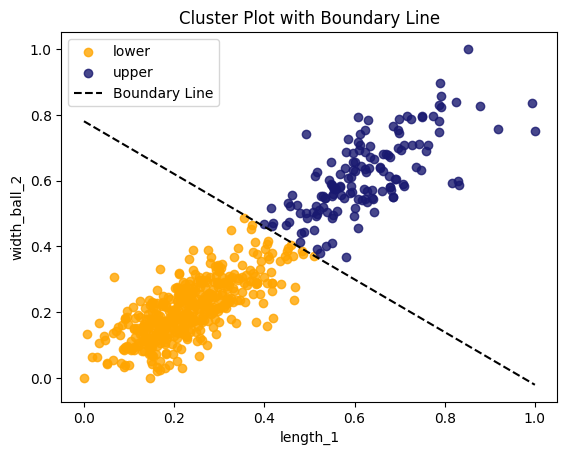

In [ ]:
plot_cluster(hold_out_cluster)

### Making Predictions

In [ ]:
def make_predictions(hold_out_data, model):
    prediction = model.predict_proba(hold_out_data)[:, 1] 

    RowID = np.array(hold_out_data.index)
    results = pd.DataFrame({'RowId': RowID, 'sex': prediction})

    return results

def make_predictions_cluster(hold_out, model_upper, model_lower):
    upper = hold_out[hold_out['cluster'] == 'upper'].drop(columns=['cluster'])
    lower = hold_out[hold_out['cluster'] == 'lower'].drop(columns=['cluster'])

    upper_predictions = model_upper.predict_proba(upper)[:, 1] 
    lower_predictions = model_lower.predict_proba(lower)[:, 1] 

    upper_results = pd.DataFrame({'RowId': upper.index, 'sex': upper_predictions})
    lower_results = pd.DataFrame({'RowId': lower.index, 'sex': lower_predictions})

    results = pd.concat([upper_results, lower_results]).sort_values(by='RowId').reset_index(drop=True)

    return results

#### Logistic Regression

In [ ]:
results_LR = make_predictions(df_train_dna_pairwise_a_clean_norm, lr)

print(results_LR.head())

   RowId  sex
0      0    1
1      1    0
2      2    1
3      3    0
4      4    0


In [ ]:
results_LR.to_csv('Data/Submissions/left_foot_LR.csv', index=False)

#### Decision Tree

In [ ]:
results_DT = make_predictions(hold_out_mna_flip_lw_a_norm, decision_tree)

print(results_DT.head())

   RowId  sex
0      0    0
1      1    0
2      2    1
3      3    1
4      4    0


In [ ]:
results_DT.to_csv('data/submissions/left_foot_DT.csv', index=False)

#### Random Forest

In [ ]:
results_RF = make_predictions(hold_out_mna_flip_lw_a_norm, random_forest)

print(results_RF.head())

   RowId  sex
0      0    0
1      1    0
2      2    1
3      3    1
4      4    0


In [ ]:
results_RF.to_csv('data/submissions/hold_out_mna_flip_lw_a_norm_smote_rf.csv', index=False)

#### MLP

In [ ]:
results_mlp = make_predictions(hold_out_kna_flip_lw_a_norm, mlp)

print(results_mlp.head())

   RowId       sex
0      0  0.103169
1      1  0.341084
2      2  0.953489
3      3  0.947704
4      4  0.430809


In [ ]:
results_mlp.to_csv('data/submissions/proba_hold_out_kna_flip_lw_a_norm_mlp.csv', index=False)

#### SVM

In [ ]:
results_svm = make_predictions(hold_out_kna_flip_lw_a_norm, svm_model)

print(results_svm.head())

   RowId       sex
0      0  0.196785
1      1  0.666781
2      2  0.959989
3      3  0.974898
4      4  0.464112


In [ ]:
results_svm.to_csv('data/submissions/proba_hold_out_kna_flip_lw_a_norm_svm.csv', index=False)

#### Bagging SVM

In [ ]:
results_bagging_svm = make_predictions(hold_out_kna_flip_lw_a_norm, bagging_svm)
print(results_bagging_svm.head())

   RowId       sex
0      0  0.163698
1      1  0.651113
2      2  0.952430
3      3  0.970536
4      4  0.462798


In [ ]:
results_bagging_svm.to_csv('data/submissions/hold_out_kna_flip_lw_a_norm_bagging_svm.csv', index=False)

#### Upper/Lower Cluster SVM

In [ ]:
results_cluster_svm = make_predictions_cluster(hold_out_cluster, svm_model_upper, svm_model_lower)
print(results_cluster_svm.head())

   RowId       sex
0      0  0.306391
1      1  0.354925
2      2  0.925186
3      3  0.974037
4      4  0.431091


In [ ]:
results_cluster_svm.to_csv('data/submissions/pred_proba_hold_out_cluster_svm.csv', index=False)

#### Upper/Lower Cluster Bagging SVM

In [ ]:
results_cluster_bagging_svm = make_predictions_cluster(hold_out_cluster, bagging_svm_upper, bagging_svm_lower)
print(results_cluster_bagging_svm.head())

   RowId       sex
0      0  0.273580
1      1  0.327633
2      2  0.926050
3      3  0.976613
4      4  0.504964


In [ ]:
results_cluster_bagging_svm.to_csv('data/submissions/pred_proba_hold_out_cluster_bagging_svm.csv', index=False)

#### XGBoost

In [ ]:
xgb_hold_out_data = xgb.DMatrix(df_train_dna_pairwise_a_clean_norm, enable_categorical=True)
results_XGB = make_predictions(xgb_hold_out_data, xgboost_model)
results_XGB['sex'] = (results_XGB['sex'] > 0.5).astype(int)

print(results_XGB.head())

   RowId       sex
0      0  0.794101
1      1  0.794101
2      2  0.794101
3      3  0.794101
4      4  0.794101


In [ ]:
results_XGB.to_csv('data/submissions/df_train_dna_lw_a_xgb.csv', index=False)

#### LightGBM

In [ ]:
results_lgb_model = make_predictions(holdout_pca, lgb_model)
print(results_lgb_model.head())

   RowId       sex
0      0  0.033799
1      1  0.366424
2      2  0.281219
3      3  0.967629
4      4  0.011680


In [148]:
results_lgb_model.to_csv('data/submissions/proba_holdout_pca_lgb.csv', index=False)

# Evaluation and Deployment

## Best model

The best performing model was LightGBM Gradient Boosting model with 500 estimators and 25 leaves, full list of hyper-parameters can be seen in the cell below along with the code to recreate it. This model achieved 93.13% on the private leaderboard and 89.95% on the public.

Data Preprocessing:
- All rows with missing values dropped.
- All right footprints mirrored so that they were uniformly left.
- Cleaned.
- SMOTE for class imbalance on training set.
- 153 pairwise distances added.
- Areas added.
- Standardized.
- PCA applied, reducing the dataset to the top 20 principal components.


This model meets the requirements addressed of having over 90% AUC and being fast to train and predict but despite being the best performing model I would not recommend it for deployment. This is because it does not meet the objective of being easily interpretable, which was was an important factor addressed in the business understanding phase. The use of Gradient Boosting (LightGBM) reduces interpretability due to the complexity introduced by the ensemble of vast numbers of decision trees, as well as the application of PCA which transforms the original features into principal components.

In [149]:
lgb_params = {
    'objective': 'binary',
    'learning_rate': 0.01,
    'num_leaves': 25,
    'max_depth': -1,
    'min_child_samples': 20,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'reg_alpha': 0.5,
    'reg_lambda': 0.5,
    'n_estimators': 500
}

lgb_model = lgb.LGBMClassifier(**lgb_params_orig)
X = df_train_pca.drop(['sex'], axis=1)
y = df_train_pca[['sex']]
lgb_model.fit(X,y.values.ravel())

results_lgb_model_best = make_predictions(holdout_pca, lgb_model)
print(results_lgb_model_best.head())

[LightGBM] [Info] Number of positive: 1110, number of negative: 1110
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train set: 2220, number of used features: 20
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
   RowId       sex
0      0  0.033799
1      1  0.366424
2      2  0.281219
3      3  0.967629
4      4  0.011680


## Alternative Models for Deployment

Alternatively, I would suggest Logistic Regression model instead, which achieved 80.48% on training set and 78.42% on testing set.
This will be a sacrifice to the accuracy but is much easier to interpret which is one of the most important factors to consider when this will be used in a legal context.
It is also a fast model to train and test.

Trained on a dataset with the following preprocessing:
- All rows with missing values dropped.
- All right footprints mirrored so that they are uniformly left.
- SMOTE for class imbalance.
- Lengths and Widths added.

## Further Work

Things to investigate further would be to experiment more with hyper-parameter optimization of LR, DT, KNN, and NB to get higher accuracy as these models are more interpretable than the complex ensemble models and neural networks. As well experiment further with a VotingClassifier that utilizes these simpler models for higher accuracy but maintaining interpretability.

Also, in the clustering of the dataset into upper/lower, instead of splitting on a linear threshold I would suggest using KNN to classify into clusters, as this can capture more complex boundaries.

# References

- Vernon, W., Reel, S. and Howsam, N., 2020. Examination and Interpretation of Bare Footprints in Forensic Investigations. *Research and Reports in Forensic Medical Science*, 10 (07 Oct 2020), 1-14.
- Abledu, J.K., Abledu, G.K., Offei, E.B. and Antwi, E.M., 2015. Determination of Sex from Footprint Dimensions in a Ghanaian Population. *PLOS One*, 10(10), p.e0139891.
- Awais, M., Naeem, F., Rasool, N. and Mahmood, S., 2018. Identification of sex from footprint dimensions using machine learning: a study on population of Punjab in Pakistan. *Egyptian Journal of Forensic Sciences*, 8 (72), 1-9.
- Dayarathne, S., Nawarathna, L.S. and Nanayakkara, 2021. Determination gender using foot, footprint, hand and hand print measurements in a Sinhalese population in Sri Lanka using supervised learning techniques. *Computer Methods and Programs in Biomedicine Update*, 1 (100017).
- Scikit-learn, 2024. *PCA*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *LogisticRegression*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *DecisionTreeClassifier*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *MLPClassifier*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *GridSearchCV*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *SVC*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *KNeighborsClassifier*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *MultinomialNB*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *ComplementNB*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.ComplementNB.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *GaussianNB*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *RandomForestClassifier*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *BaggingClassifier*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.BaggingClassifier.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *AdaBoostClassifier*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.AdaBoostClassifier.html [Accessed 21 November 2024].
- The XGBoost Contributors, 2024. *XGBoost Documentation*. Available from: https://xgboost.readthedocs.io/en/latest/index.html [Accessed 21 November 2024].
- Microsoft, 2024. *LightGBM*. Available from: https://lightgbm.readthedocs.io/en/latest/index.html [Accessed 21 November 2024].
- Scikit-learn, 2024. *VotingClassifier*. Available from: https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.VotingClassifier.html [Accessed 21 November 2024].